# Microsoft Malware Detection
## EDA and *ML* in progress

![](https://zeroproject.org/wp-content/uploads/2018/05/Microsoft.png)

![](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRbuYMzpgoRh2tLUj_EVV0z7gtIKwfJfZ7G-DP5dscAvSqcgSR_OQ)

The malware industry continues to be a well-organized, well-funded market dedicated to evading traditional security measures. Once a computer is infected by malware, criminals can hurt consumers and enterprises in many ways.With more than one billion enterprise and consumer customers, Microsoft takes this problem very seriously and is deeply invested in improving security. As one part of their overall strategy for doing so, Microsoft is challenging the data science community to develop techniques to predict if a machine will soon be hit with malware. As with their previous, Malware Challenge (2015), Microsoft is providing Kagglers with an unprecedented malware dataset to encourage open-source progress on effective techniques for predicting malware occurrences.

### Goals
The goal of this competition is to predict a Windows machine’s probability of getting infected by various families of malware, based on different properties of that machine. The telemetry data containing these properties and the machine infections was generated by combining heartbeat and threat reports collected by Microsoft's endpoint protection solution, Windows Defender. Each row in this dataset corresponds to a machine, uniquely identified by a MachineIdentifier. HasDetections is the ground truth and indicates that Malware was detected on the machine. Using the information and labels in train.csv, you must predict the value for HasDetections for each machine in test.csv.

### Metric
Submissions are evaluated on area under the ROC curve between the predicted probability and the observed label.

#### Initial thanks and inspirations for this kernel - sources:
- https://www.kaggle.com/theoviel/load-the-totality-of-the-data
- https://www.kaggle.com/artgor/is-this-malware-eda-fe-and-lgb-updated

## Table of Contents
1. [Importing the Dataset](#importing_the_dataset)
2. [Inspecting the Dataset](#inspecting)
3. [Exploratory Data Analysis](#EDA)
4. [Machine Learning Modeling](#ML)

## ToDo: 
- add more comments
- Conclusion for Univariate, Bivariate and Multivariate plots
- Dive into Feature Engineering
- Experiments with NA_rate threshold, eta, number of estimators and xgboost parameters in general to improve auc

### Summary of Versions:
Until Version 22 I was playing around with EDA and trying to visualize as information as possible, unfortuately due to the enormous train set size which is almost 8GB I was working mainly with samples and trying to find ways to visualize as much information as I can. From version 22 and later versions of this Kernel, I was experimenting with Baseline XGboost and trying to find the optimal parameters via tuning. Feature Engineering still missing due to the fact that I dive into so much to tuning and trying to improve the classifier's performance and lost focus on other subjects but I will come back to that later. Tuning causes Kaggle to terminate my kernels due to timeout limitations. From Version #61 and so on I work with XGBoost classifers with optimal parameters found from my previous kernels. After the end of the competition and with the reveal of the private dataset, I am starting to suspect that my final tuned models are a bit overfitted and have to generalize.

#### Version History:
- Version 22, with 90% na_rate threshold, 10% train_sample / Public score: ** 0.656 **
- Version 23, with 90% na_rate threshold, 15% train_sample / Public score: ** 0.654 **
- Version 24, with 80% na_rate threshold, 15% train_sample / Public score: ** 0.655 **
- Version 25, with 80% na_rate threshold, 10% train_sample with better xgboost params / Public score: ** 0.661 **
- Version 26, with 80% na_rate threshold, 10% train_sample with better xgboost params / Public score: ** 0.661 **
- Version 27, with 70% na_rate threshold, 10% train_sample with better xgboost params eta: 0.1, 1000 estimators / Public score: ** 0.669 **
- Version 28, with 70% na_rate threshold, 10% train_sample with better xgboost params eta: 0.05, 1000 estimators / Public score: ** 0.674 **
- Version 29, with 70% na_rate threshold, 10% train_sample with better xgboost params eta: 0.05, 2000 estimators / Public score: ** 0.669 **
- Version 30, with 60% na_rate threshold, 10% train_sample with better xgboost params eta: 0.05, 1000 estimators / Public score: ** 0.670 **
- Version 31, with 60% na_rate threshold, 10% train_sample with better xgboost params eta: 0.05, 2000 estimators / Public score: ** 0.672 **
- Version 32, with 50% na_rate threshold, 10% train_sample with better xgboost params eta: 0.05, 1000 estimators / Public score: ** 0.666 **
- Version 33-34, with 70% na_rate threshold, 10% train_sample with better xgboost params eta: 0.1, 1000 estimators / Public score: ** 0.674 **
- Version 35-36-37, with 70% na_rate threshold, 10% Introducing Feature Engineering, with train_sample and with better xgboost params eta: 0.1, 1000 estimators / score: ** 0.659 ** 
- Version 38, with 70% na_rate threshold, 10% train_sample and with better xgboost params eta: 0.1, 1000 estimators and tuning / score: ** 0.671 **
- Version 39-40, with 70% na_rate threshold, 10% train_sample and with better xgboost params eta: 0.1, 1000 estimators and tuning / score: ** 0.670 **
- Version 41, with 70% na_rate threshold, 10% train_sample and with better xgboost params eta: 0.05, 2000 estimators and tuning / score: ** 0.673 ** 
- Version 42-43-44, with 70% na_rate threshold, 10% train_sample and with better xgboost tuning / score: ** 0.677 **
- Version 45, with 90% na_rate and unbalanced_features threshold, 12.5% train_sample and with better xgboost tuning / score: ** 0.664 IT HAS AN ERROR **
- Version 46-47-48, with 90% na_rate and 90% unbalanced_features threshold, 12.5% train_sample and with xgboost tuning / score: ** TBA IT HAS AN ERROR **
- Version 49, with 90% na_rate and 90% unbalanced_features threshold, 10% train_sample and with xgboost tuning / score: ** TBA, IT HAS AN ERROR **
- Version 50, (Like Version 49) with 90% na_rate and 90% unbalanced_features threshold, 10% train_sample and with xgboost tuning / score: ** TBA, IT HAS AN ERROR  **
- Version 51, with 70% na_rate and 90% unbalanced_features threshold, 10% train_sample and with xgboost tuning / score: ** TBA, IT HAS AN ERROR  **
- Version 52, with 70% na_rate and 90% unbalanced_features threshold, 12.5% train_sample and with xgboost tuning / score: ** TBA, IT HAS AN ERROR **
- Version 53, with 90% na_rate and 90% unbalanced_features threshold, 10% train_sample and with xgboost tuning / score: ** 0.673  **
- Version 54, with 90% na_rate and 90% unbalanced_features threshold, 12.5% train_sample and with xgboost tuning / score: ** TBA,  running longer than 9h  **
- Version 55, with 70% na_rate and 90% unbalanced_features threshold, 10% train_sample and with xgboost tuning / score: ** TBA, running longer than 9h  **
- Version 56, with 70% na_rate and 90% unbalanced_features threshold, 12.5% train_sample and with xgboost tuning / score: ** TBA, running longer than 9h  **
- Version 57, with 70% na_rate and 90% unbalanced_features threshold, 15% train_sample and with xgboost tuning / score: ** TBA, running longer than 9h  **
- Version 58, with 70% na_rate and 90% unbalanced_features threshold, 18.5% train_sample and with xgboost tuning / score: ** TBA, running longer than 9h  **
- Version 59, with 70% na_rate and 90% unbalanced_features threshold, 20% train_sample and with xgboost tuning / score: ** TBA, running longer than 9h  **
- Version 60, with 70% na_rate and 90% unbalanced_features threshold, 10% train_sample and with xgboost tuning / score: ** TBA  **
- Version 61, with 70% na_rate and 90% unbalanced_features threshold, 12.5% train_sample and with xgboost tuned / score: ** TBA  **
- Version 62, with 70% na_rate and 90% unbalanced_features threshold, 15% train_sample and with xgboost tuned / score: ** TBA  **
- Version 63, with 70% na_rate and 90% unbalanced_features threshold, 17.5% train_sample and with xgboost tuned / score: ** TBA, Exit with code -1  **
- Version 64, with 70% na_rate and 90% unbalanced_features threshold, 20% train_sample and with xgboost tuned / score: ** TBA, Exit with code -1  **
- Version 65, with 70% na_rate and 90% unbalanced_features threshold, 22.5% train_sample and with xgboost tuned / score: ** TBA, Exit with code -1  **
- Version 66-67-68, with 70% na_rate and 90% unbalanced_features threshold, 25% train_sample and with xgboost tuned / score: ** TBA, Exit with code -1  **
- Version 69, with 70% na_rate and 90% unbalanced_features threshold, 27.5% train_sample and with xgboost tuned / score: ** 0.674  **
- Version 70, with 70% na_rate and 90% unbalanced_features threshold, 30% train_sample and with xgboost tuned / score: ** 0.675  **
- Version 71-72-73, with 70% na_rate and 90% unbalanced_features threshold, 25% train_sample and with xgboost tuned and reduced reg_alpha and lambda / score: ** TBA  **
- Version 74-75, with 70% na_rate and 90% unbalanced_features threshold, 27.5% train_sample and with xgboost tuned and reduced reg_alpha and lambda / score: ** TBA  **
- Version 76, with 70% na_rate and 90% unbalanced_features threshold, 30% train_sample and with xgboost tuned and reduced reg_alpha and lambda / score: ** TBA  **
- Version 77, with 70% na_rate and 90% unbalanced_features threshold, 32.5% train_sample and with xgboost tuned and reduced reg_alpha and lambda / score: ** 0.672  **
- Version 78-79, Returning after the end of the competition to polish the Kernel, with 90% na_rate and 90% unbalanced_features threshold, 15% train_sample and with xgboost tuned / score: ** TBA  **


### Version Summary:
Until Version 22 I was playing around with EDA and trying to visualize as information as possible, unfortuately due to the enormous train set size which is almost 8GB I was working mainly with samples and trying to find ways to visualize as much information as I can. From version 22 and later versions of this Kernel, I was experimenting with Baseline XGboost and trying to find the optimal parameters via tuning. Feature Engineering still missing due to the fact that I dive into so much to tuning and trying to improve the classifier's performance and lost focus on other subjects but I will come back to that later. Tuning causes Kaggle to terminate my kernels due to timeout limitations. From Version #61 and so on I work with XGBoost classifers with optimal parameters found from my previous kernels. Moreover, I am starting to believe that the 2 thresholds, na_rate and unbalanced_feature_rate_threshold must be both set to 0.9.

### Thoughts about Feature Engineering:
In order to know if a newly introduced feature may affect positevely or negatively the dataset I have to cross validate both with and without an xgboost model and measure its performance.


## My train of thought is the following:
The following Kernel Will perform:
- Importing the dataset
- EDA
- Feature Engineering
- Machine Learning Modeling

There is another Kernel for parameter tuning and another of blending CV predictions.
1. [XGBoost Tuning](https://www.kaggle.com/praxitelisk/microsoft-malware-detection-xgboost-tuning)
2. [XGBoost Blending CV Predictions](https://www.kaggle.com/praxitelisk/microsoft-malware-detection-xgboost-blends)

The order for Machine Learning predictions is as depicted from the flowchart:
1. Use this kernel for EDA, Feature Engineering and Baseline Modeling
2. Then tune the baseline model
3. Finally Blend Predictions from Cross Validations.

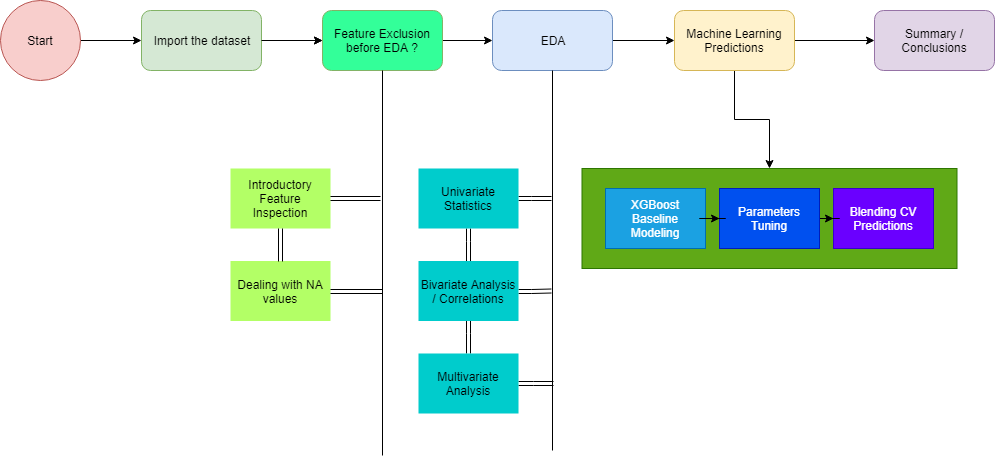

### *Due to memory limitations both EDA and Machine Learning will be performed with a representative sample from the whole train set. Approximately 15% from the train set will be used for EDA and 15% sample from the whole train set will be used from ML modeling.*

<a id="importing_the_dataset"></a>
## Importing the Dataset

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns

%matplotlib inline

plt.style.use('fivethirtyeight')

import time


# due to Kaggle memory limitations and the enormous dataset size, a sample from the whole
# trainset will be used for ML modeling
train_sample_fraction = None


# another global variable that must be defined is the NA values rate / theshold to ommit columns with
# NA values that pass this rate
na_rate_threshold = 0.9

# if we want to avoid using a fraction of the train dataset then using the following variable will suffice
train_sample_num = 1500000

# theshold to remove columns with unbalanced features to their values 
unbalanced_feature_rate_threshold = 0.9

# Any results you write to the current directory are saved as output.

['train.csv', 'sample_submission.csv', 'test.csv']


The data is quite big here, and all of it cannot be loaded at once with a simple read_csv call.
A solution is to specify types, to gain memory (for example switching from float64 to float32)

In [2]:
# I am grateful for the help of author of this kernel for the main idea to load the dataset and save memory space!!
# https://www.kaggle.com/theoviel/load-the-totality-of-the-data

dtypes = {
        'MachineIdentifier':                                    'category',
        'ProductName':                                          'category',
        'EngineVersion':                                        'category',
        'AppVersion':                                           'category',
        'AvSigVersion':                                         'category',
        'IsBeta':                                               'int8',
        'RtpStateBitfield':                                     'float16',
        'IsSxsPassiveMode':                                     'int8',
        'DefaultBrowsersIdentifier':                            'float16',
        'AVProductStatesIdentifier':                            'float32',
        'AVProductsInstalled':                                  'float16',
        'AVProductsEnabled':                                    'float16',
        'HasTpm':                                               'int8',
        'CountryIdentifier':                                    'int16',
        'CityIdentifier':                                       'float32',
        'OrganizationIdentifier':                               'float16',
        'GeoNameIdentifier':                                    'float16',
        'LocaleEnglishNameIdentifier':                          'int8',
        'Platform':                                             'category',
        'Processor':                                            'category',
        'OsVer':                                                'category',
        'OsBuild':                                              'int16',
        'OsSuite':                                              'int16',
        'OsPlatformSubRelease':                                 'category',
        'OsBuildLab':                                           'category',
        'SkuEdition':                                           'category',
        'IsProtected':                                          'float16',
        'AutoSampleOptIn':                                      'int8',
        'PuaMode':                                              'category',
        'SMode':                                                'float16',
        'IeVerIdentifier':                                      'float16',
        'SmartScreen':                                          'category',
        'Firewall':                                             'float16',
        'UacLuaenable':                                         'float32',
        'Census_MDC2FormFactor':                                'category',
        'Census_DeviceFamily':                                  'category',
        'Census_OEMNameIdentifier':                             'float16',
        'Census_OEMModelIdentifier':                            'float32',
        'Census_ProcessorCoreCount':                            'float16',
        'Census_ProcessorManufacturerIdentifier':               'float16',
        'Census_ProcessorModelIdentifier':                      'float16',
        'Census_ProcessorClass':                                'category',
        'Census_PrimaryDiskTotalCapacity':                      'float32',
        'Census_PrimaryDiskTypeName':                           'category',
        'Census_SystemVolumeTotalCapacity':                     'float32',
        'Census_HasOpticalDiskDrive':                           'int8',
        'Census_TotalPhysicalRAM':                              'float32',
        'Census_ChassisTypeName':                               'category',
        'Census_InternalPrimaryDiagonalDisplaySizeInInches':    'float16',
        'Census_InternalPrimaryDisplayResolutionHorizontal':    'float16',
        'Census_InternalPrimaryDisplayResolutionVertical':      'float16',
        'Census_PowerPlatformRoleName':                         'category',
        'Census_InternalBatteryType':                           'category',
        'Census_InternalBatteryNumberOfCharges':                'float32',
        'Census_OSVersion':                                     'category',
        'Census_OSArchitecture':                                'category',
        'Census_OSBranch':                                      'category',
        'Census_OSBuildNumber':                                 'int16',
        'Census_OSBuildRevision':                               'int32',
        'Census_OSEdition':                                     'category',
        'Census_OSSkuName':                                     'category',
        'Census_OSInstallTypeName':                             'category',
        'Census_OSInstallLanguageIdentifier':                   'float16',
        'Census_OSUILocaleIdentifier':                          'int16',
        'Census_OSWUAutoUpdateOptionsName':                     'category',
        'Census_IsPortableOperatingSystem':                     'int8',
        'Census_GenuineStateName':                              'category',
        'Census_ActivationChannel':                             'category',
        'Census_IsFlightingInternal':                           'float16',
        'Census_IsFlightsDisabled':                             'float16',
        'Census_FlightRing':                                    'category',
        'Census_ThresholdOptIn':                                'float16',
        'Census_FirmwareManufacturerIdentifier':                'float16',
        'Census_FirmwareVersionIdentifier':                     'float32',
        'Census_IsSecureBootEnabled':                           'int8',
        'Census_IsWIMBootEnabled':                              'float16',
        'Census_IsVirtualDevice':                               'float16',
        'Census_IsTouchEnabled':                                'int8',
        'Census_IsPenCapable':                                  'int8',
        'Census_IsAlwaysOnAlwaysConnectedCapable':              'float16',
        'Wdft_IsGamer':                                         'float16',
        'Wdft_RegionIdentifier':                                'float16',
        'HasDetections':                                        'int8'
        }

def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage(deep=True).sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage(deep=True).sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [3]:
# to be deleted this cell
numerics = ['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerical_and_binary_columns = [c for c,v in dtypes.items() if v in numerics]


In [4]:
%%time
train = pd.read_csv('../input/train.csv', dtype=dtypes)

CPU times: user 3min 12s, sys: 14.1 s, total: 3min 26s
Wall time: 3min 26s


In [5]:
# Special thanks to https://www.kaggle.com/artgor/is-this-malware-eda-fe-and-lgb-updated
#train = reduce_mem_usage(train)

<a id="inspecting"></a>
## Introductory Inspection for the train set and its features

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8921483 entries, 0 to 8921482
Data columns (total 83 columns):
MachineIdentifier                                    category
ProductName                                          category
EngineVersion                                        category
AppVersion                                           category
AvSigVersion                                         category
IsBeta                                               int8
RtpStateBitfield                                     float16
IsSxsPassiveMode                                     int8
DefaultBrowsersIdentifier                            float16
AVProductStatesIdentifier                            float32
AVProductsInstalled                                  float16
AVProductsEnabled                                    float16
HasTpm                                               int8
CountryIdentifier                                    int16
CityIdentifier                         

We can see that we have already a mix of numerical and categorical features.

In [7]:
train.describe()

,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,AVProductStatesIdentifier,AVProductsInstalled,AVProductsEnabled,HasTpm,CountryIdentifier,CityIdentifier,OrganizationIdentifier,GeoNameIdentifier,LocaleEnglishNameIdentifier,OsBuild,OsSuite,IsProtected,AutoSampleOptIn,SMode,IeVerIdentifier,Firewall,UacLuaenable,Census_OEMNameIdentifier,Census_OEMModelIdentifier,Census_ProcessorCoreCount,Census_ProcessorManufacturerIdentifier,Census_ProcessorModelIdentifier,Census_PrimaryDiskTotalCapacity,Census_SystemVolumeTotalCapacity,Census_HasOpticalDiskDrive,Census_TotalPhysicalRAM,Census_InternalPrimaryDiagonalDisplaySizeInInches,Census_InternalPrimaryDisplayResolutionHorizontal,Census_InternalPrimaryDisplayResolutionVertical,Census_InternalBatteryNumberOfCharges,Census_OSBuildNumber,Census_OSBuildRevision,Census_OSInstallLanguageIdentifier,Census_OSUILocaleIdentifier,Census_IsPortableOperatingSystem,Census_IsFlightingInternal,Census_IsFlightsDisabled,Census_ThresholdOptIn,Census_FirmwareManufacturerIdentifier,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections
count,8.921483e+06,8889165.0,8.921483e+06,433438.0,8.885262e+06,8885262.0,8885262.0,8.921483e+06,8.921483e+06,8.596074e+06,6169965.0,8921270.0,8.921483e+06,8.921483e+06,8.921483e+06,8885439.0,8.921483e+06,8.383724e+06,8862589.0,8830133.0,8.910645e+06,8826005.0,8.819250e+06,8880177.0,8880170.0,8880140.0,8.868467e+06,8.868481e+06,8.921483e+06,8.840950e+06,8.874349e+06,8874497.0,8874497.0,8.652728e+06,8.921483e+06,8.921483e+06,8861399.0,8.921483e+06,8.921483e+06,1.512724e+06,8.760960e+06,3.254158e+06,8738226.0,8.761350e+06,8.921483e+06,3.261780e+06,8.905530e+06,8.921483e+06,8.921483e+06,8850140.0,8618032.0,8618032.0,8.921483e+06
mean,7.509962e-06,NaN,1.733378e-02,NaN,4.948320e+04,NaN,NaN,9.879711e-01,1.080490e+02,8.049152e+04,NaN,NaN,2.790453e+01,1.571997e+04,5.751534e+02,NaN,2.891896e-05,4.649162e-04,NaN,NaN,1.216142e+01,NaN,2.378578e+05,NaN,NaN,NaN,2.912138e+06,3.823069e+05,7.718728e-02,6.109390e+03,NaN,NaN,NaN,1.123782e+09,1.583483e+04,9.730490e+02,NaN,6.046534e+01,5.452008e-04,1.388788e-05,1.007318e-05,2.508163e-04,NaN,3.268055e+04,4.860229e-01,2.980232e-07,7.202148e-03,1.255431e-01,3.807091e-02,NaN,NaN,NaN,4.997927e-01
std,2.740421e-03,0.0,1.305118e-01,NaN,1.379994e+04,0.0,0.0,1.090149e-01,6.304706e+01,4.873461e+04,0.0,NaN,6.560791e+01,2.190685e+03,2.480847e+02,0.0,5.377558e-03,2.104187e-02,NaN,0.0,9.867765e+03,NaN,7.148446e+04,0.0,0.0,NaN,4.451633e+09,3.233614e+05,2.668884e-01,4.971148e+03,0.000000e+00,NaN,NaN,1.933305e+09,1.961743e+03,2.931971e+03,0.0,4.499992e+01,2.334317e-02,3.726959e-03,3.173828e-03,1.582336e-02,NaN,2.112612e+04,4.998046e-01,5.459785e-04,8.453369e-02,3.313338e-01,1.913675e-01,0.0,0.0,0.0,5.000000e-01
min,0.000000e+00,0.0,0.000000e+00,1.0,3.000000e+00,0.0,0.0,0.000000e+00,1.000000e+00,5.000000e+00,1.0,1.0,-1.280000e+02,7.600000e+03,1.600000e+01,0.0,0.000000e+00,0.000000e+00,1.0,0.0,0.000000e+00,1.0,1.000000e+00,1.0,1.0,2.0,0.000000e+00,0.000000e+00,0.000000e+00,2.550000e+02,7.001953e-01,-1.0,-1.0,0.000000e+00,7.600000e+03,0.000000e+00,1.0,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.0,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,1.0,0.000000e+00
25%,0.000000e+00,7.0,0.000000e+00,788.0,4.948000e+04,1.0,1.0,1.000000e+00,5.100000e+01,3.682500e+04,18.0,89.0,-2.900000e+01,1.506300e+04,2.560000e+02,1.0,0.000000e+00,0.000000e+00,111.0,1.0,1.000000e+00,1443.0,1.896920e+05,2.0,5.0,1998.0,2.393720e+05,1.207750e+05,0.000000e+00,4.096000e+03,1.389844e+01,1366.0,768.0,0.000000e+00,1.506300e+04,1.670000e+02,8.0,3.100000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,142.0,1.315600e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,3.0,0.000000e+00
50%,0.000000e+00,7.0,0.000000e

We have a wide variety of data. most of them appear to have NaN values, we have to thoroughly inspect them.

We have many features and lots of them have NA values, an idea is to ditch features that have many NA values bacause they do not provide any information that may be useful for the analysis.

In [8]:
# special thanks to https://www.kaggle.com/artgor/is-this-malware-eda-fe-and-lgb-updated

stats = []
for col in train.columns:
    stats.append((col, train[col].dtype, train[col].nunique(), train[col].isnull().sum() * 100 / train.shape[0], train[col].value_counts(normalize=True, dropna=False).values[0] * 100))
    
stats_df = pd.DataFrame(stats, columns=['Feature', "type", 'Unique_values', 'Percentage of missing values', 'Percentage of values in the biggest category'])

stats_df.sort_values('Percentage of missing values', ascending=False)

,Feature,type,Unique_values,Percentage of missing values,Percentage of values in the biggest category
28,PuaMode,category,2,99.974119,99.974119
41,Census_ProcessorClass,category,3,99.589407,99.589407
8,DefaultBrowsersIdentifier,float16,1730,95.141637,95.141637
68,Census_IsFlightingInternal,float16,2,83.044030,83.044030
52,Census_InternalBatteryType,category,78,71.046809,71.046809
71,Census_ThresholdOptIn,float16,2,63.524472,63.524472
75,Census_IsWIMBootEnabled,float16,2,63.439038,63.439038
31,SmartScreen,category,21,35.610795,48.379658
15,OrganizationIdentifier,float16,49,30.841487,47.037662
29,SMode,float16,2,6.027686,93.928812


### Remove columns with high * **NA** * rate threshold and high * **one category** * values only
removing colums with NA rate more than * ** 70%** * threshold and * ** 90%  ** * features with one category only.

In [9]:
good_cols = list(train.columns)

for col in train.columns:
    
    # remove columns with high NA rate
    na_rate = train[col].isnull().sum() / train.shape[0]
    
    # remove columns with high Unbalanced values rate
    unbalanced_rate = train[col].value_counts(normalize=True, dropna=False).values[0]
    
    if na_rate > na_rate_threshold:
        good_cols.remove(col)
    elif unbalanced_rate > unbalanced_feature_rate_threshold:
        good_cols.remove(col)

In [10]:
good_cols

['MachineIdentifier',
 'EngineVersion',
 'AppVersion',
 'AvSigVersion',
 'AVProductStatesIdentifier',
 'AVProductsInstalled',
 'CountryIdentifier',
 'CityIdentifier',
 'OrganizationIdentifier',
 'GeoNameIdentifier',
 'LocaleEnglishNameIdentifier',
 'OsBuild',
 'OsSuite',
 'OsPlatformSubRelease',
 'OsBuildLab',
 'SkuEdition',
 'IeVerIdentifier',
 'SmartScreen',
 'Census_MDC2FormFactor',
 'Census_OEMNameIdentifier',
 'Census_OEMModelIdentifier',
 'Census_ProcessorCoreCount',
 'Census_ProcessorManufacturerIdentifier',
 'Census_ProcessorModelIdentifier',
 'Census_PrimaryDiskTotalCapacity',
 'Census_PrimaryDiskTypeName',
 'Census_SystemVolumeTotalCapacity',
 'Census_TotalPhysicalRAM',
 'Census_ChassisTypeName',
 'Census_InternalPrimaryDiagonalDisplaySizeInInches',
 'Census_InternalPrimaryDisplayResolutionHorizontal',
 'Census_InternalPrimaryDisplayResolutionVertical',
 'Census_PowerPlatformRoleName',
 'Census_InternalBatteryType',
 'Census_InternalBatteryNumberOfCharges',
 'Census_OSVersion

In [11]:
print("train data set reduced size in memory:", train.memory_usage().sum() / (1000000000))

train data set reduced size in memory: 1.754534285


In [12]:
train = train[good_cols]

### Delete some variables to free memory space.

In [13]:
del stats_df

### Call garbage collector

In [14]:
import gc

gc.collect()

228739

<a id="EDA"></a>
## Exploratory Data Analysis

![](http://blog.k2analytics.co.in/wp-content/uploads/2016/12/Exploratory_Data_Analysis.png)

### Let's print out and take a look at the header frame

In [15]:
train.head()

,MachineIdentifier,EngineVersion,AppVersion,AvSigVersion,AVProductStatesIdentifier,AVProductsInstalled,CountryIdentifier,CityIdentifier,OrganizationIdentifier,GeoNameIdentifier,LocaleEnglishNameIdentifier,OsBuild,OsSuite,OsPlatformSubRelease,OsBuildLab,SkuEdition,IeVerIdentifier,SmartScreen,Census_MDC2FormFactor,Census_OEMNameIdentifier,Census_OEMModelIdentifier,Census_ProcessorCoreCount,Census_ProcessorManufacturerIdentifier,Census_ProcessorModelIdentifier,Census_PrimaryDiskTotalCapacity,Census_PrimaryDiskTypeName,Census_SystemVolumeTotalCapacity,Census_TotalPhysicalRAM,Census_ChassisTypeName,Census_InternalPrimaryDiagonalDisplaySizeInInches,Census_InternalPrimaryDisplayResolutionHorizontal,Census_InternalPrimaryDisplayResolutionVertical,Census_PowerPlatformRoleName,Census_InternalBatteryType,Census_InternalBatteryNumberOfCharges,Census_OSVersion,Census_OSBranch,Census_OSBuildNumber,Census_OSBuildRevision,Census_OSEdition,Census_OSSkuName,Census_OSInstallTypeName,Census_OSInstallLanguageIdentifier,Census_OSUILocaleIdentifier,Census_OSWUAutoUpdateOptionsName,Census_GenuineStateName,Census_ActivationChannel,Census_IsFlightingInternal,Census_ThresholdOptIn,Census_FirmwareManufacturerIdentifier,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsTouchEnabled,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections
0,0000028988387b115f69f31a3bf04f09,1.1.15100.1,4.18.1807.18075,1.273.1735.0,53447.0,1.0,29,128035.0,18.0,35.0,-85,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,137.0,NaN,Desktop,2668.0,9124.0,4.0,5.0,2340.0,476940.0,HDD,299451.0,4096.0,Desktop,18.906250,1440.0,900.0,Desktop,NaN,4.294967e+09,10.0.17134.165,rs4_release,17134,165,Professional,PROFESSIONAL,UUPUpgrade,26.0,119,UNKNOWN,IS_GENUINE,Retail,NaN,NaN,628.0,36144.0,0,NaN,0,0.0,10.0,0
1,000007535c3f730efa9ea0b7ef1bd645,1.1.14600.4,4.13.17134.1,1.263.48.0,53447.0,1.0,93,1482.0,18.0,119.0,64,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,137.0,NaN,Notebook,2668.0,91656.0,4.0,5.0,2404.0,476940.0,HDD,102385.0,4096.0,Notebook,13.898438,1366.0,768.0,Mobile,NaN,1.000000e+00,10.0.17134.1,rs4_release,17134,1,Professional,PROFESSIONAL,IBSClean,8.0,31,UNKNOWN,OFFLINE,Retail,NaN,NaN,628.0,57858.0,0,NaN,0,0.0,8.0,0
2,000007905a28d863f6d0d597892cd692,1.1.15100.1,4.18.1807.18075,1.273.1341.0,53447.0,1.0,86,153579.0,18.0,64.0,49,17134,768,rs4,17134.1.amd64fre.rs4_release.180410-1804,Home,137.0,RequireAdmin,Desktop,4908.0,317701.0,4.0,5.0,1972.0,114473.0,SSD,113907.0,4096.0,Desktop,21.500000,1920.0,1080.0,Desktop,NaN,4.294967e+09,10.0.17134.165,rs4_release,17134,165,Core,CORE,UUPUpgrade,7.0,30,FullAuto,IS_GENUINE,OEM:NONSLP,NaN,NaN,142.0,52682.0,0,NaN,0,0.0,3.0,0
3,00000b11598a75ea8ba1beea8459149f,1.1.15100.1,4.18.1807.18075,1.273.1527.0,53447.0,1.0,88,20710.0,NaN,117.0,115,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,137.0,ExistsNotSet,Desktop,1443.0,275890.0,4.0,5.0,2272.0,238475.0,UNKNOWN,227116.0,4096.0,MiniTower,18.500000,1366.0,768.0,Desktop,NaN,4.294967e+09,10.0.17134.228,rs4_release,17134,228,Professional,PROFESSIONAL,UUPUpgrade,17.0,64,FullAuto,IS_GENUINE,OEM:NONSLP,NaN,NaN,355.0,20050.0,0,NaN,0,0.0,3.0,1
4,000014a5f00daa18e76b81417eeb99fc,1.1.15100.1,4.18.1807.18075,1.273.1379.0,53447.0,1.0,18,37376.0,NaN,277.0,75,17134,768,rs4,17134.1.amd64fre.rs4_release.180410-1804,Home,137.0,RequireAdmin,Notebook,1443.0,331929.0,4.0,5.0,2500.0,476940.0,HDD,101900.0,6144.0,Portable,14.000000,1366.0,768.0,Mobile,lion,0.000000e+00,10.0.17134.191,rs4_release,17134,191,Core,CORE,Update,8.0,31,FullAuto,IS_GENUINE,Retail,0.0,0.0,355.0,19844.0,0,0.0,0,0.0,1.0,1


### Train Set dimensions

In [16]:
train.shape

(8921483, 57)

### Target

In [17]:
train['HasDetections'].value_counts()

0    4462591
1    4458892
Name: HasDetections, dtype: int64

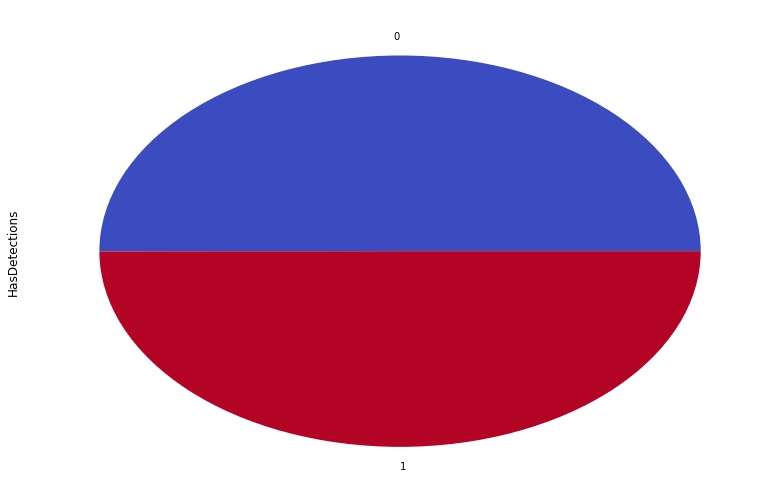

In [18]:
train['HasDetections'].value_counts().plot(kind="pie", figsize=(12,9), colormap="coolwarm")

#### The target is balanced, which is nice.

### Seperate the categorical and the numerical columns in the Train Set
MachineIdentifier is a unique ID and does not play any role to the analysis.

In [19]:
categorical_columns = list(train.loc[:, train.dtypes =="category"].columns)
numerical_and_binary_columns = list(train.loc[:, train.dtypes !="category"].columns)
numerical_columns = numerical_and_binary_columns

categorical_columns.remove("MachineIdentifier")

binary_columns = []
for col in (numerical_and_binary_columns):
    if train[col].nunique() == 2:
        binary_columns.append(col)
        numerical_columns.remove(col)

### The Majority of types of features

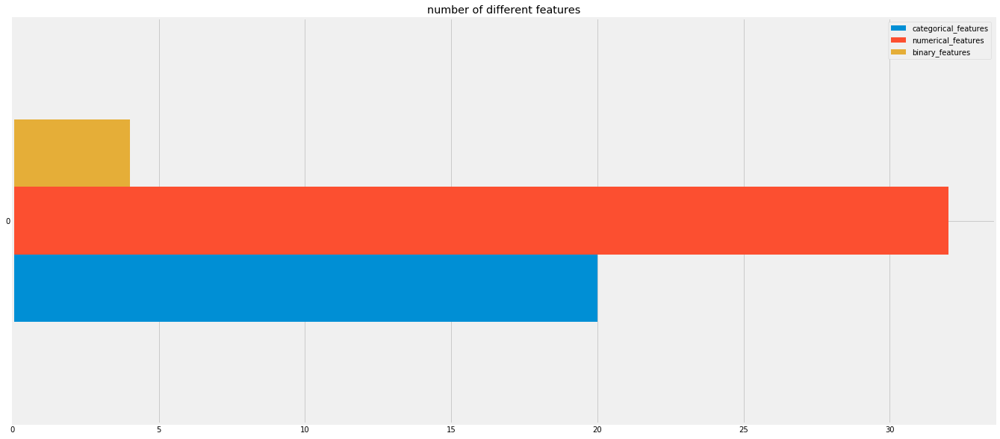

In [20]:
#print(len(categorical_columns))
#print(len(numerical_columns))
#print(len(binary_columns))

categories_list = []
categories_list.append(len(categorical_columns))
categories_list.append(len(numerical_columns))
categories_list.append(len(binary_columns))

categories_df = pd.DataFrame(categories_list, 
                             index=["categorical_features", "numerical_features", "binary_features"])

categories_df = categories_df.transpose().plot(kind="barh", figsize=(21, 10), title="number of different features")

### * Due to memory limitations, a small sample between 10% to 13% from the whole trainset will be used for Univariate, Bivariate and Multivariate plots *

In [21]:
if train_sample_fraction is not None:
    train_sample = train.sample(frac=train_sample_fraction, random_state=42)
elif train_sample_num is not None:
    train_sample = train.sample(n=train_sample_num, random_state=42)
else:
    train_sample = train.sample(n=1500000, random_state=42)

gc.collect()

10

In [22]:
categorical_columns

['EngineVersion',
 'AppVersion',
 'AvSigVersion',
 'OsPlatformSubRelease',
 'OsBuildLab',
 'SkuEdition',
 'SmartScreen',
 'Census_MDC2FormFactor',
 'Census_PrimaryDiskTypeName',
 'Census_ChassisTypeName',
 'Census_PowerPlatformRoleName',
 'Census_InternalBatteryType',
 'Census_OSVersion',
 'Census_OSBranch',
 'Census_OSEdition',
 'Census_OSSkuName',
 'Census_OSInstallTypeName',
 'Census_OSWUAutoUpdateOptionsName',
 'Census_GenuineStateName',
 'Census_ActivationChannel']

### Univariate Analysis - Barplots for the categorical features
#### Inspecting each one of the categorical features from the train set and illustrating the top most occured categories per categorical feature against the *HasDetections* target variable. Moreover trying to fit a logistic regression model between the target variable and the inspected feature to identify if the feature is a good predictor.

In [23]:
def categorical_univariate_and_bivariate_stats(feature):
    
    if feature in train_sample.columns:
    
        print("Top 10 most occurred categories for the categorical feature", feature)
        print(train_sample[feature].value_counts().head(10))

        f, axes = plt.subplots(1, 2, figsize=(21, 10))

        train_sample[feature].value_counts().head(10).plot.bar(ax=axes[0], colormap="BrBG")

        train_sample.groupby(["HasDetections", feature]).count()["MachineIdentifier"].unstack(0).sort_values(by=1, axis=0, ascending=False).head(10).plot.bar(ax=axes[1], colormap="coolwarm")
        
        f.suptitle("Categorical feature: "+" Univariate and Bivariate plots against the target variable")
        
    else:
        print("This feature has been removed from dataset due to high NaN rate or highly unbalanced values")
        
        
def logistic_fit(feature):
    
    import warnings
    warnings.filterwarnings("ignore", category=FutureWarning)
    
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import precision_score
    from sklearn.metrics import recall_score
    from sklearn.metrics import f1_score
    from sklearn.metrics import r2_score

    if feature in train_sample.columns:
        
        from sklearn.linear_model import LogisticRegression
        
        f, axes = plt.subplots(1, 2, figsize=(21, 10))

        # test if there is a logistic relationship between the feature1 and the target.
        print()
        print("Fitting a logistic regression model for the feature", feature,"against the target variable")
        
               
        mask = ~train_sample[feature].isnull() & ~train_sample["HasDetections"].isnull()

        logmodel = LogisticRegression(C=1e5, solver='lbfgs')
        
        if feature in categorical_columns:        
            logmodel.fit(train_sample[feature][mask].cat.codes.values.reshape(-1,1), train_sample["HasDetections"][mask])
            predictions = logmodel.predict(train_sample[feature][mask].cat.codes.values.reshape(-1,1))
        else:
            logmodel.fit(train_sample[feature][mask].values.reshape(-1,1), train_sample["HasDetections"][mask])
            predictions = logmodel.predict(train_sample[feature][mask].values.reshape(-1,1))

        from sklearn.metrics import classification_report
        print(classification_report(train_sample["HasDetections"][mask], predictions))
        print("")
        print("accuracy score:", accuracy_score(train_sample["HasDetections"][mask], predictions))
        print("F1 score:", accuracy_score(train_sample["HasDetections"][mask], predictions))
        #print("R^2 score:", r2_score(train_sample["HasDetections"][mask], predictions))

        import scikitplot as skplt
        skplt.metrics.plot_confusion_matrix(train_sample["HasDetections"][mask], predictions, normalize=False,
                                            title = "Confusion matrix for the feature: "+feature+" against the target variable after fitting a logistic regression model",
                                           figsize=(10,8), text_fontsize='medium', cmap="BrBG", ax = axes[0])
        
        
        # import statsmodels.api as sm
        # print()
        # est = sm.Logit(train_sample["HasDetections"][mask], train_sample[feature][mask].cat.codes.values.reshape(-1,1))
        # result1=est.fit()
        # print(result1.summary())
        if feature in categorical_columns:
            axes[1] = plt.scatter(train_sample[feature][mask].cat.codes.values.reshape(-1,1), predictions)
            axes[1] = plt.scatter(train_sample[feature][mask].cat.codes.values.reshape(-1,1), logmodel.predict_proba(train_sample[feature][mask].cat.codes.values.reshape(-1,1))[:,1])
            plt.xlabel(feature)
            plt.ylabel("HasDetections Probability")
            plt.title("Probability of Detecting a Malware vs the "+ feature)
            plt.show()
        else:
            axes[1] = plt.scatter(train_sample[feature][mask].values.reshape(-1,1), predictions)
            axes[1] = plt.scatter(train_sample[feature][mask].values.reshape(-1,1), logmodel.predict_proba(train_sample[feature][mask].values.reshape(-1,1))[:,1])
            plt.xlabel(feature)
            plt.ylabel("HasDetections Probability")
            plt.title("Probability of Detecting a Malware vs the "+ feature)
            plt.show()
        
    else:
        print("This feature has been removed from dataset due to high NaN rate or highly unbalanced values")



In [24]:
categorical_univariate_and_bivariate_stats(feature="ProductName")
logistic_fit(feature="ProductName")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 most occurred categories for the categorical feature EngineVersion
1.1.15200.1    647025
1.1.15100.1    617750
1.1.15000.2     44726
1.1.14901.4     35818
1.1.14600.4     26917
1.1.14800.3     22728
1.1.15300.6     20301
1.1.14104.0     15877
1.1.13504.0     11871
1.1.15300.5     11522
Name: EngineVersion, dtype: int64

Fitting a logistic regression model for the feature EngineVersion against the target variable
              precision    recall  f1-score   support

           0       0.64      0.17      0.27    750796
           1       0.52      0.90      0.66    749204

   micro avg       0.54      0.54      0.54   1500000
   macro avg       0.58      0.54      0.47   1500000
weighted avg       0.58      0.54      0.47   1500000


accuracy score: 0.5365933333333334
F1 score: 0.5365933333333334


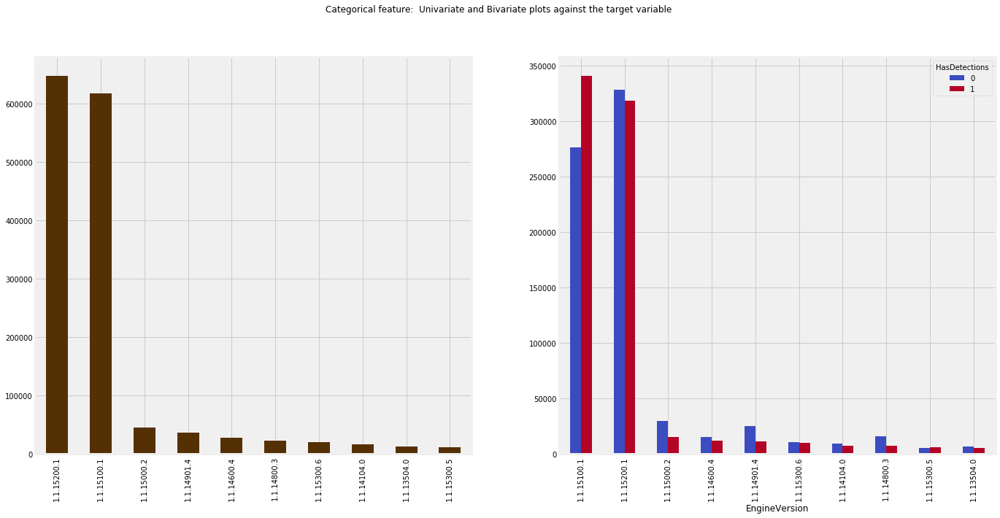

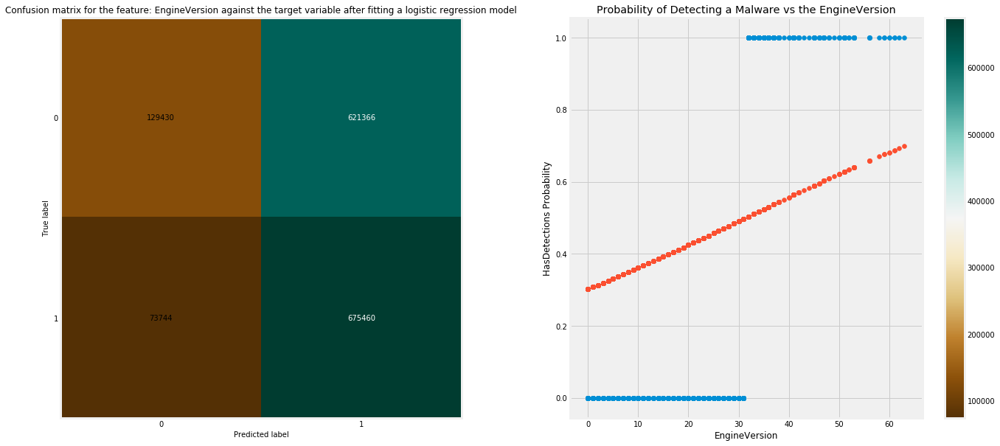

In [25]:
categorical_univariate_and_bivariate_stats(feature="EngineVersion")
logistic_fit(feature="EngineVersion")

We can see that 2 engine versions, "1.1.15200.1" and "1.1.15100.1" is at high frequencies than the rest engine versions. However the version "1.1.15100.1" has more Malware Detections than the rest of the categoeris. Just out of curiosity, fitting a logistic regression for binary classification for this feature against the target variable, It detects the infected systems with precision. However the model is very weak due to its low accuracy and high recall scores, but it can at least predict the infected systems with great precision.

Top 10 most occurred categories for the categorical feature AppVersion
4.18.1807.18075     865026
4.18.1806.18062     142638
4.12.16299.15        60847
4.10.209.0           45892
4.13.17134.1         43083
4.16.17656.18052     39691
4.13.17134.228       37851
4.8.10240.17443      34526
4.9.10586.1106       34318
4.14.17639.18041     32336
Name: AppVersion, dtype: int64

Fitting a logistic regression model for the feature AppVersion against the target variable
              precision    recall  f1-score   support

           0       0.55      0.37      0.44    750796
           1       0.52      0.69      0.59    749204

   micro avg       0.53      0.53      0.53   1500000
   macro avg       0.53      0.53      0.52   1500000
weighted avg       0.53      0.53      0.52   1500000


accuracy score: 0.5307813333333333
F1 score: 0.5307813333333333


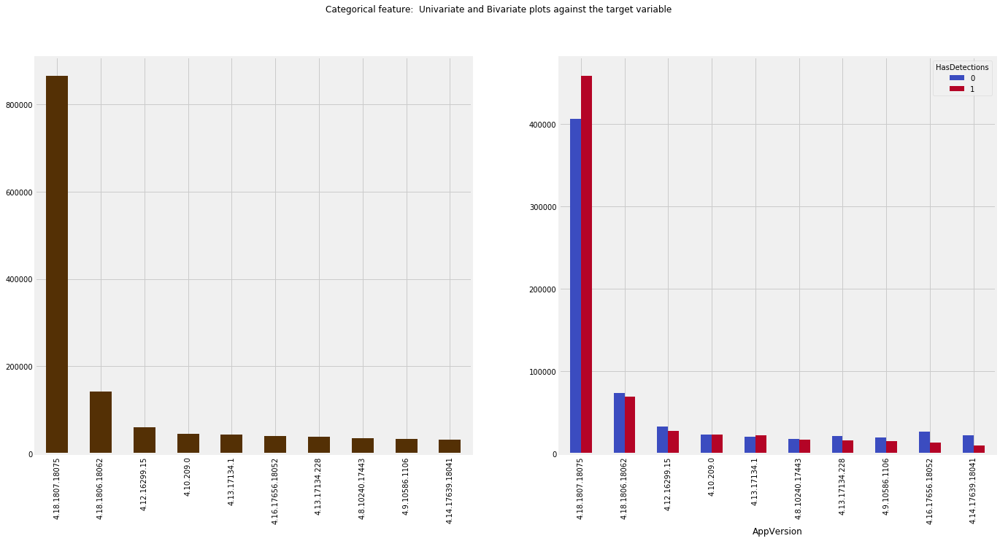

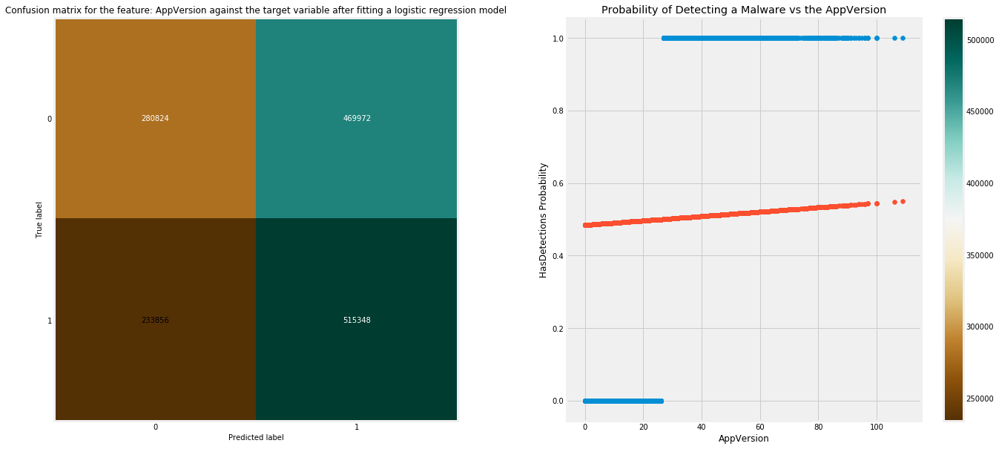

In [26]:
categorical_univariate_and_bivariate_stats(feature="AppVersion")
logistic_fit(feature="AppVersion")

Top 10 most occurred categories for the categorical feature AvSigVersion
1.273.1420.0    17314
1.263.48.0      16330
1.275.1140.0    16142
1.275.727.0     15550
1.273.371.0     14492
1.273.1826.0    14379
1.275.1244.0    13332
1.251.42.0      12959
1.275.1209.0    11208
1.273.810.0     11162
Name: AvSigVersion, dtype: int64

Fitting a logistic regression model for the feature AvSigVersion against the target variable
              precision    recall  f1-score   support

           0       0.53      0.40      0.46    750796
           1       0.52      0.64      0.57    749204

   micro avg       0.52      0.52      0.52   1500000
   macro avg       0.52      0.52      0.51   1500000
weighted avg       0.52      0.52      0.51   1500000


accuracy score: 0.520112
F1 score: 0.520112


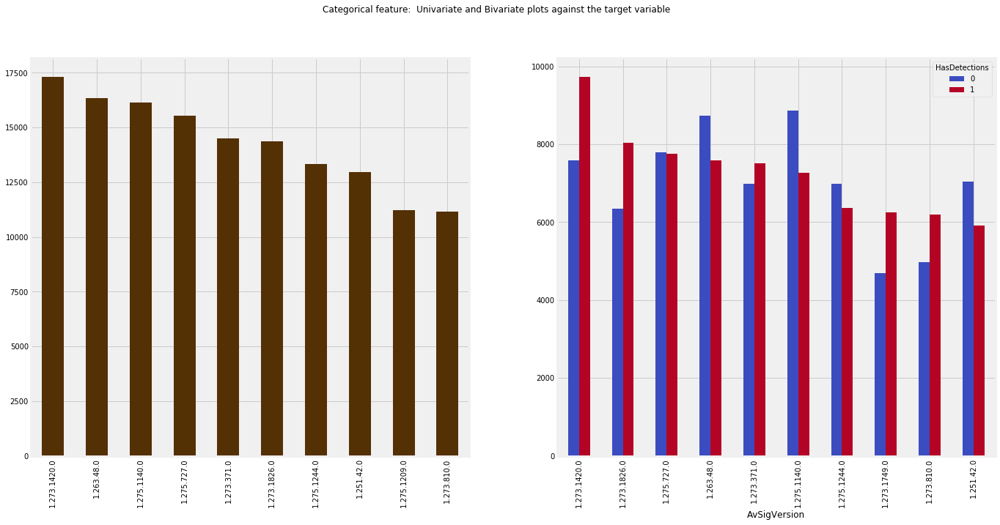

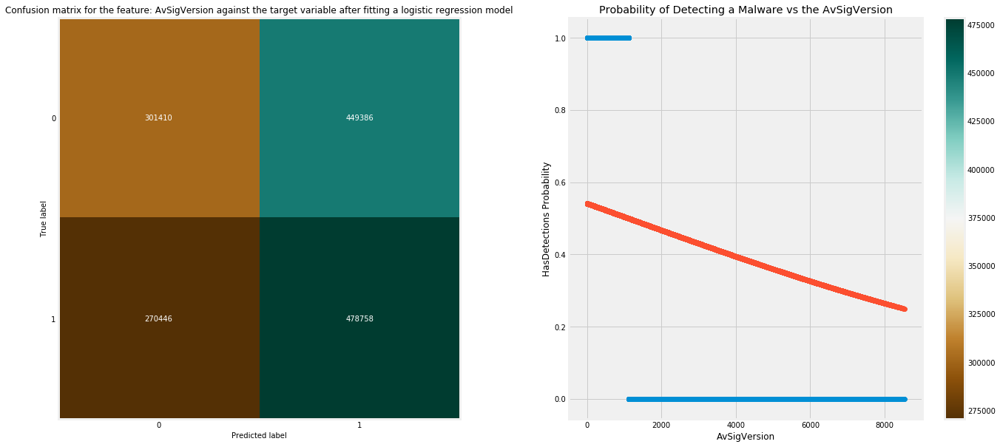

In [27]:
categorical_univariate_and_bivariate_stats(feature="AvSigVersion")
logistic_fit(feature="AvSigVersion")

In [28]:
categorical_univariate_and_bivariate_stats(feature="Platform")
logistic_fit(feature="Platform")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [29]:
categorical_univariate_and_bivariate_stats(feature="Processor")
logistic_fit(feature="Processor")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [30]:
categorical_univariate_and_bivariate_stats(feature="OsVer")
logistic_fit(feature="OsVer")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 most occurred categories for the categorical feature OsPlatformSubRelease
rs4           659307
rs3           421058
rs2           130582
rs1           122160
th2            69383
th1            45416
windows8.1     32618
windows7       15963
prers5          3513
Name: OsPlatformSubRelease, dtype: int64

Fitting a logistic regression model for the feature OsPlatformSubRelease against the target variable
              precision    recall  f1-score   support

           0       0.52      0.47      0.49    750796
           1       0.51      0.56      0.54    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.51      0.51      0.51   1500000
weighted avg       0.51      0.51      0.51   1500000


accuracy score: 0.5144566666666667
F1 score: 0.5144566666666667


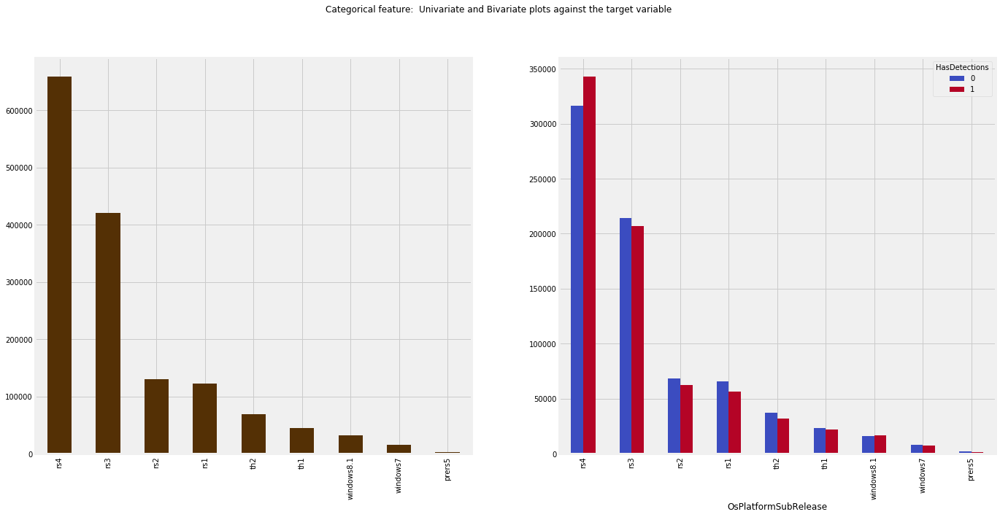

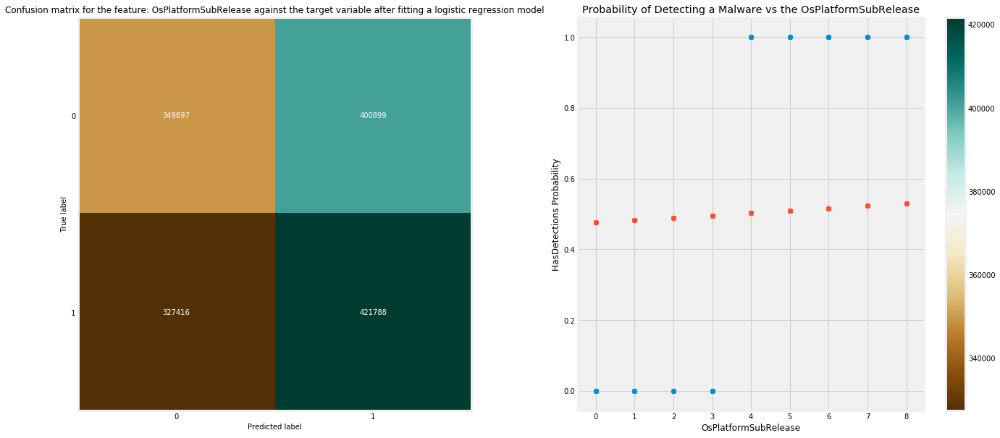

In [31]:
categorical_univariate_and_bivariate_stats(feature="OsPlatformSubRelease")
logistic_fit(feature="OsPlatformSubRelease")

Top 10 most occurred categories for the categorical feature OsBuildLab
17134.1.amd64fre.rs4_release.180410-1804                 616130
16299.431.amd64fre.rs3_release_svc_escrow.180502-1908    210346
16299.15.amd64fre.rs3_release.170928-1534                162061
15063.0.amd64fre.rs2_release.170317-1834                 120083
17134.1.x86fre.rs4_release.180410-1804                    43139
16299.15.x86fre.rs3_release.170928-1534                   39275
14393.2189.amd64fre.rs1_release.180329-1711               32228
10240.17443.amd64fre.th1.170602-2340                      28976
10586.1176.amd64fre.th2_release_sec.170913-1848           25037
15063.0.x86fre.rs2_release.170317-1834                    10499
Name: OsBuildLab, dtype: int64

Fitting a logistic regression model for the feature OsBuildLab against the target variable
              precision    recall  f1-score   support

           0       0.52      0.25      0.33    750794
           1       0.51      0.78      0.61    749203

  

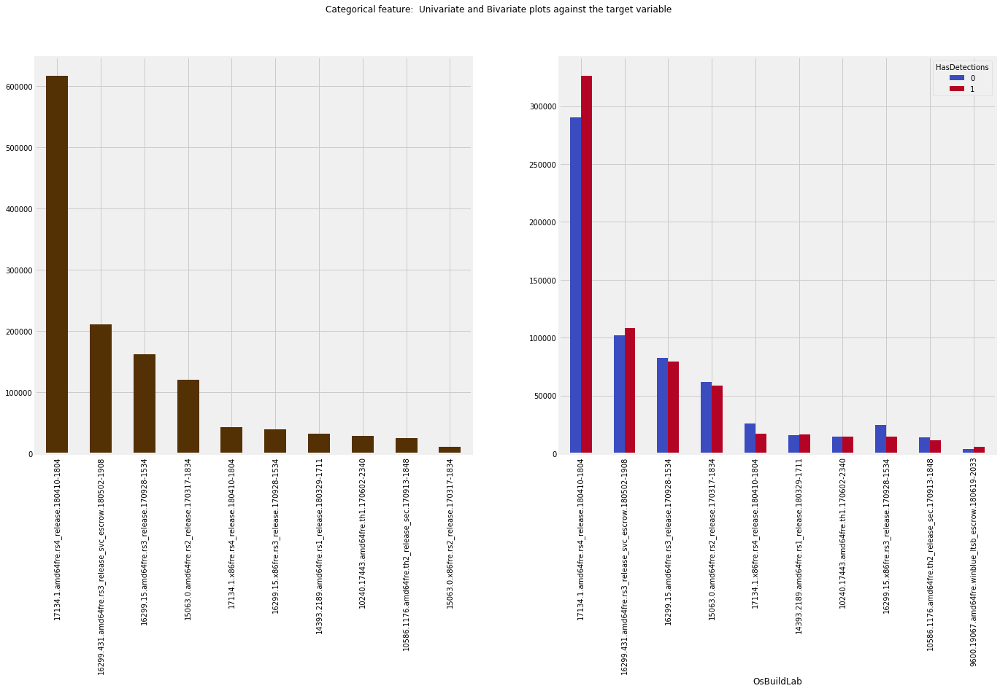

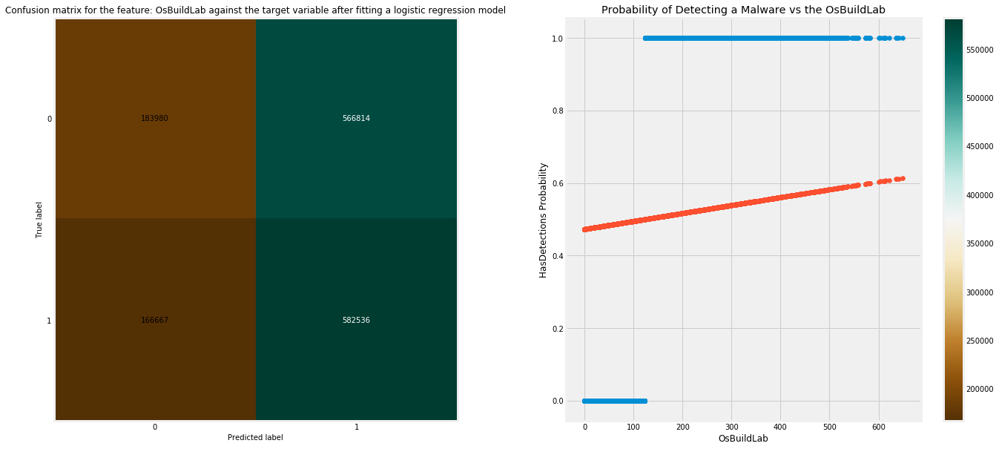

In [32]:
categorical_univariate_and_bivariate_stats(feature="OsBuildLab")
logistic_fit(feature="OsBuildLab")

Top 10 most occurred categories for the categorical feature SmartScreen
RequireAdmin    724714
ExistsNotSet    175900
Off              31432
Warn             22968
Prompt            5839
Block             3754
off                234
On                 133
&#x02;              59
&#x01;              47
Name: SmartScreen, dtype: int64

Fitting a logistic regression model for the feature SmartScreen against the target variable
              precision    recall  f1-score   support

           0       0.56      0.88      0.68    472787
           1       0.75      0.33      0.46    492317

   micro avg       0.60      0.60      0.60    965104
   macro avg       0.65      0.61      0.57    965104
weighted avg       0.65      0.60      0.57    965104


accuracy score: 0.6004731096337804
F1 score: 0.6004731096337804


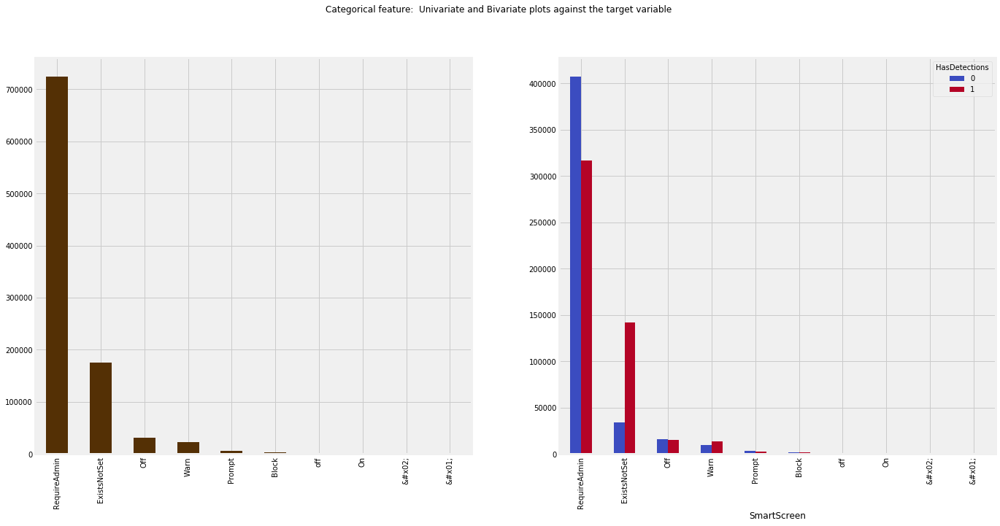

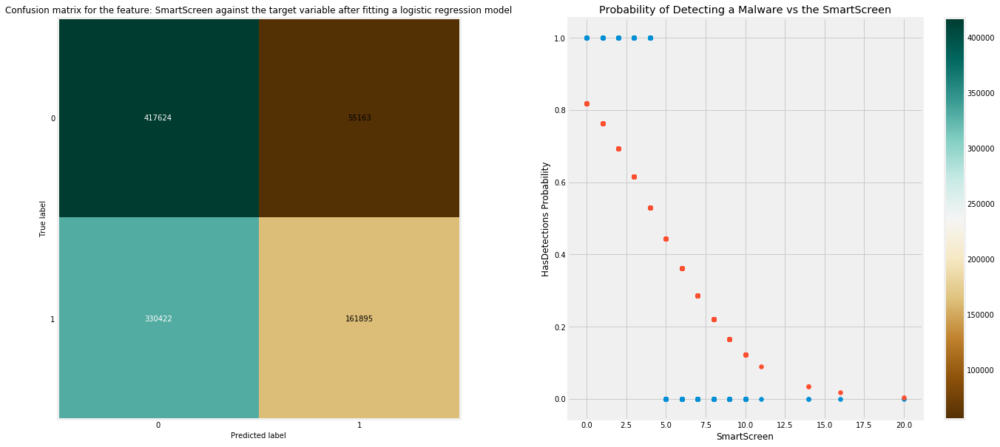

In [33]:
categorical_univariate_and_bivariate_stats(feature="SmartScreen")
logistic_fit(feature="SmartScreen")

Top 10 most occurred categories for the categorical feature Census_MDC2FormFactor
Notebook        962470
Desktop         327497
Convertible      67995
Detachable       50676
AllInOne         49071
PCOther          23537
LargeTablet      11340
SmallTablet       5220
SmallServer       1462
MediumServer       570
Name: Census_MDC2FormFactor, dtype: int64

Fitting a logistic regression model for the feature Census_MDC2FormFactor against the target variable
              precision    recall  f1-score   support

           0       0.50      0.66      0.57    750796
           1       0.50      0.34      0.40    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.50      0.50      0.49   1500000
weighted avg       0.50      0.50      0.49   1500000


accuracy score: 0.4999613333333333
F1 score: 0.4999613333333333


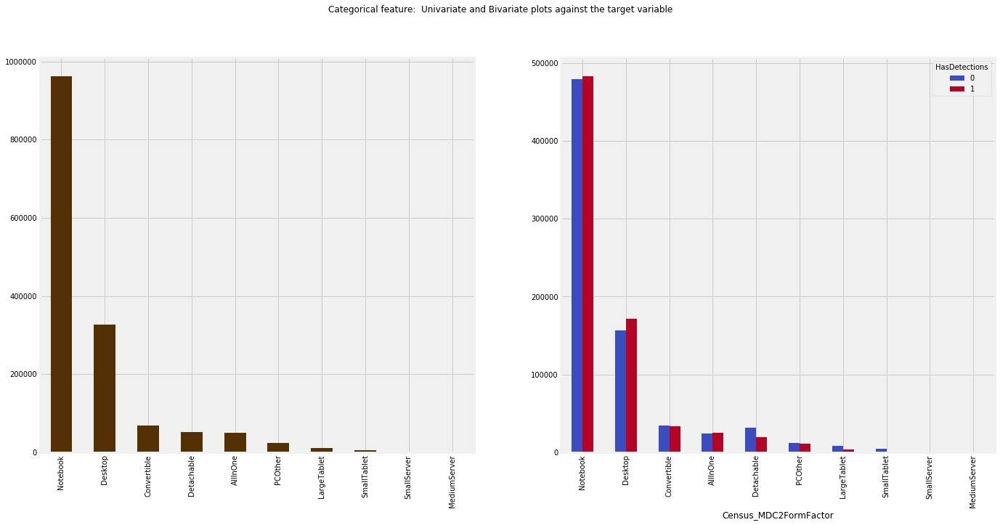

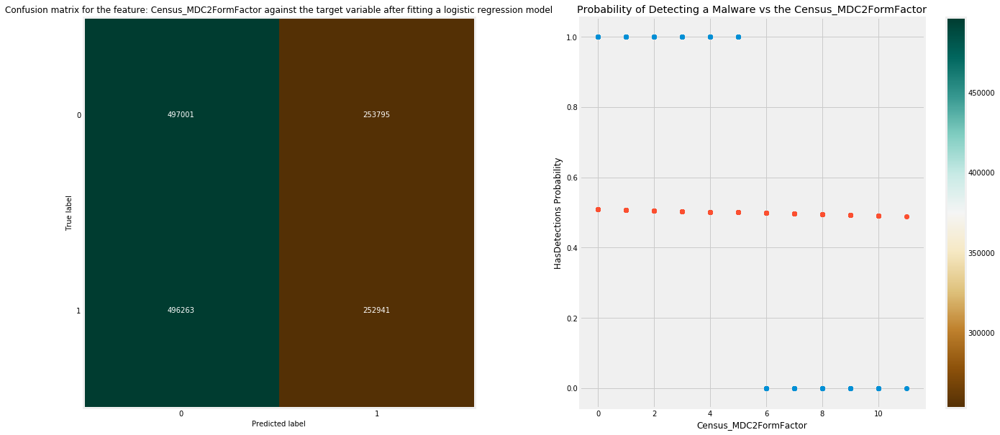

In [34]:
categorical_univariate_and_bivariate_stats(feature="Census_MDC2FormFactor")
logistic_fit(feature="Census_MDC2FormFactor")

Top 10 most occurred categories for the categorical feature Census_ChassisTypeName
Notebook       883129
Desktop        314161
Laptop         114813
Portable        60851
AllinOne        34303
MiniTower       14337
Convertible     14223
Other           12931
UNKNOWN         11084
Detachable       8774
Name: Census_ChassisTypeName, dtype: int64

Fitting a logistic regression model for the feature Census_ChassisTypeName against the target variable
              precision    recall  f1-score   support

           0       0.51      0.67      0.58    750744
           1       0.51      0.34      0.41    749160

   micro avg       0.51      0.51      0.51   1499904
   macro avg       0.51      0.51      0.49   1499904
weighted avg       0.51      0.51      0.49   1499904


accuracy score: 0.5062157311401263
F1 score: 0.5062157311401263


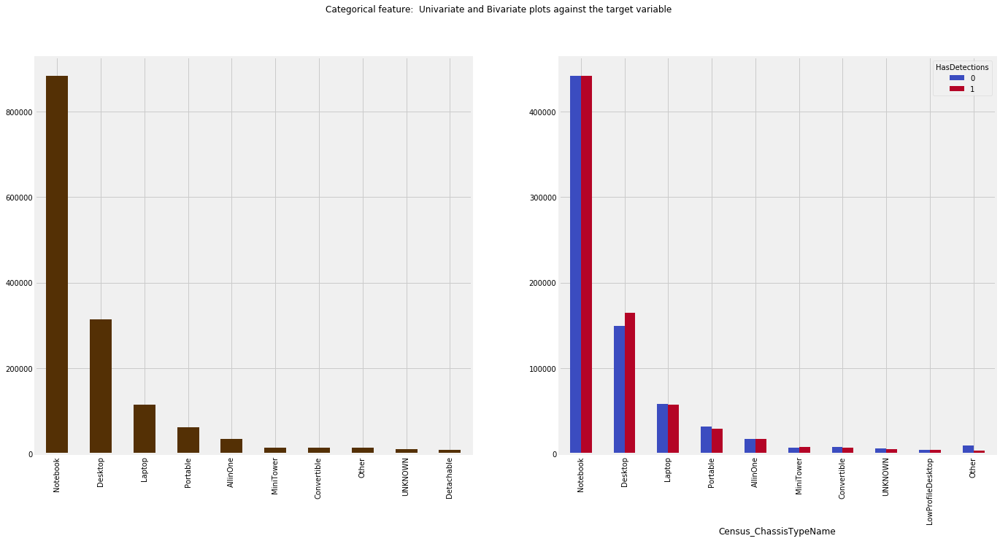

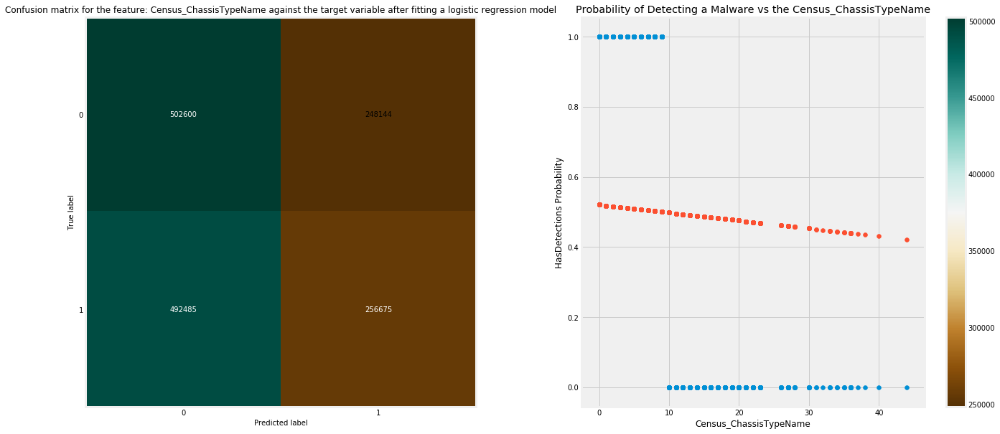

In [35]:
categorical_univariate_and_bivariate_stats(feature="Census_ChassisTypeName")
logistic_fit(feature="Census_ChassisTypeName")

Top 10 most occurred categories for the categorical feature Census_PowerPlatformRoleName
Mobile               1039587
Desktop               346996
Slate                  83317
Workstation            18485
SOHOServer              6293
UNKNOWN                 3431
EnterpriseServer        1212
AppliancePC              649
PerformanceServer         21
Unspecified                2
Name: Census_PowerPlatformRoleName, dtype: int64

Fitting a logistic regression model for the feature Census_PowerPlatformRoleName against the target variable
              precision    recall  f1-score   support

           0       0.51      0.78      0.61    750791
           1       0.52      0.24      0.33    749202

   micro avg       0.51      0.51      0.51   1499993
   macro avg       0.52      0.51      0.47   1499993
weighted avg       0.52      0.51      0.47   1499993


accuracy score: 0.5115397205186958
F1 score: 0.5115397205186958


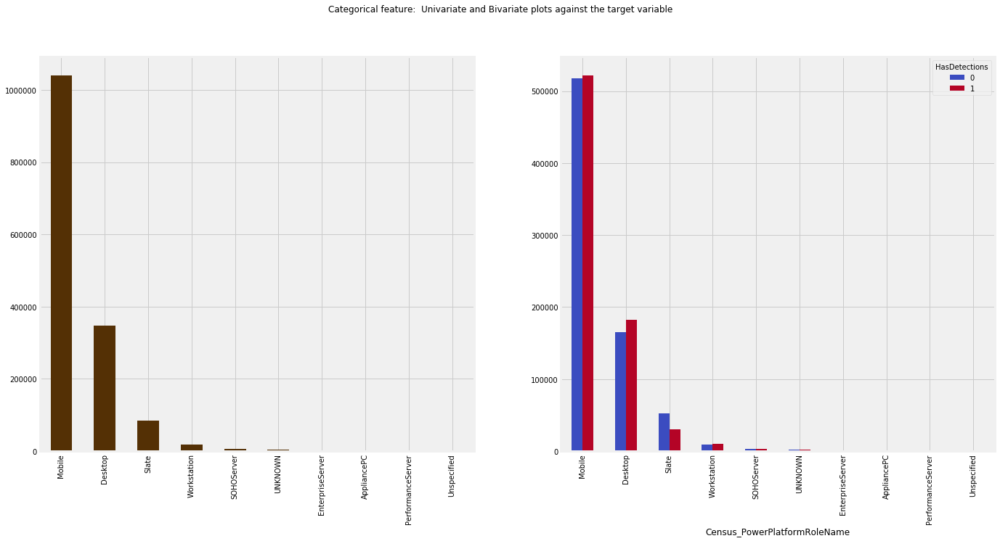

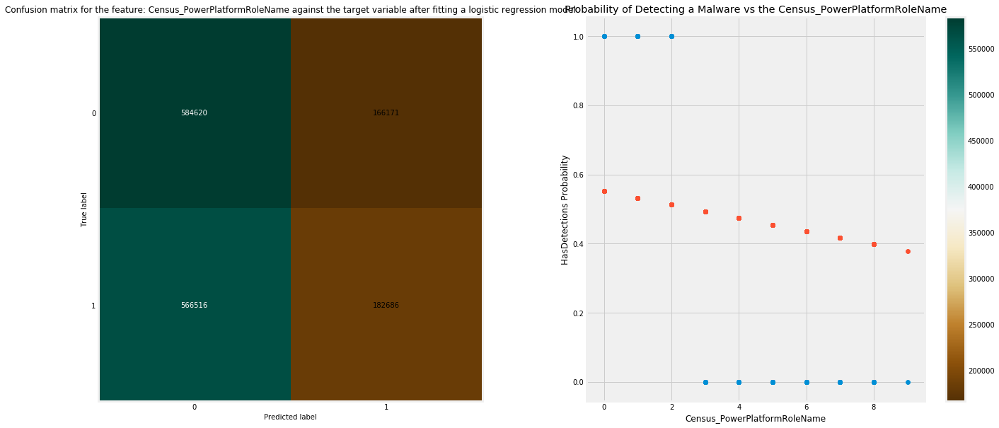

In [36]:
categorical_univariate_and_bivariate_stats(feature="Census_PowerPlatformRoleName")
logistic_fit(feature="Census_PowerPlatformRoleName")

Top 10 most occurred categories for the categorical feature Census_InternalBatteryType
lion    340991
li-i     41361
#        30889
lip      10292
liio      5591
li p      1396
li        1145
nimh       787
real       475
bq20       386
Name: Census_InternalBatteryType, dtype: int64

Fitting a logistic regression model for the feature Census_InternalBatteryType against the target variable
              precision    recall  f1-score   support

           0       0.52      0.93      0.66    223424
           1       0.51      0.08      0.14    210865

   micro avg       0.52      0.52      0.52    434289
   macro avg       0.51      0.50      0.40    434289
weighted avg       0.51      0.52      0.41    434289


accuracy score: 0.5164256980950473
F1 score: 0.5164256980950473


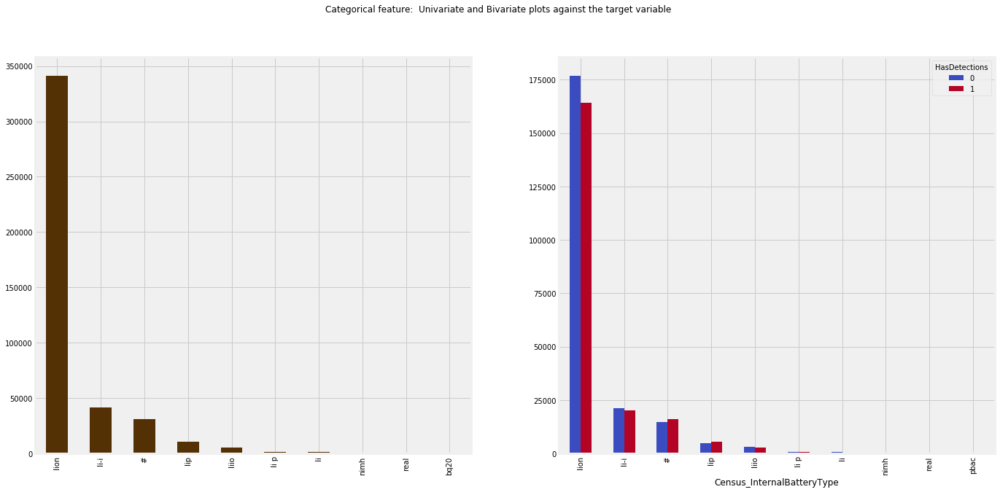

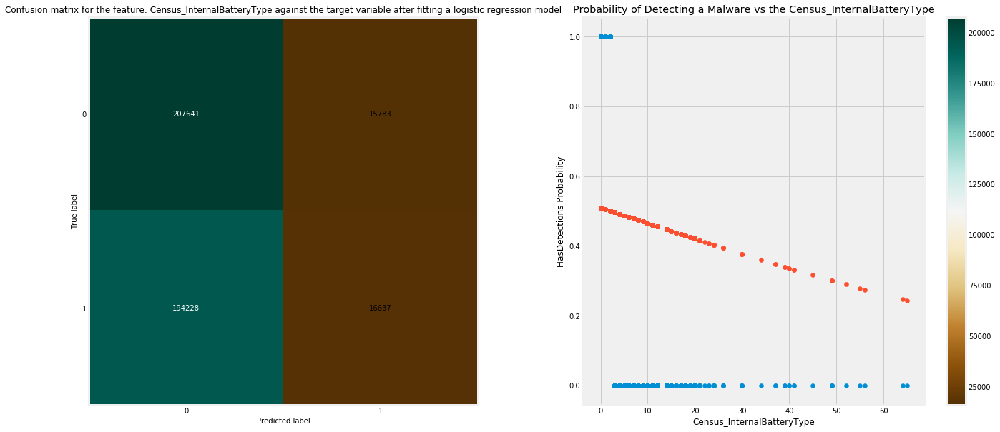

In [37]:
categorical_univariate_and_bivariate_stats(feature="Census_InternalBatteryType")
logistic_fit(feature="Census_InternalBatteryType")

Top 10 most occurred categories for the categorical feature Census_OSVersion
10.0.17134.228     238058
10.0.17134.165     151380
10.0.16299.431      92192
10.0.17134.285      78968
10.0.17134.112      58436
10.0.16299.547      57707
10.0.16299.371      54556
10.0.17134.191      38582
10.0.14393.2189     37295
10.0.16299.611      36764
Name: Census_OSVersion, dtype: int64

Fitting a logistic regression model for the feature Census_OSVersion against the target variable
              precision    recall  f1-score   support

           0       0.53      0.32      0.40    750796
           1       0.51      0.71      0.59    749204

   micro avg       0.52      0.52      0.52   1500000
   macro avg       0.52      0.52      0.50   1500000
weighted avg       0.52      0.52      0.50   1500000


accuracy score: 0.515126
F1 score: 0.515126


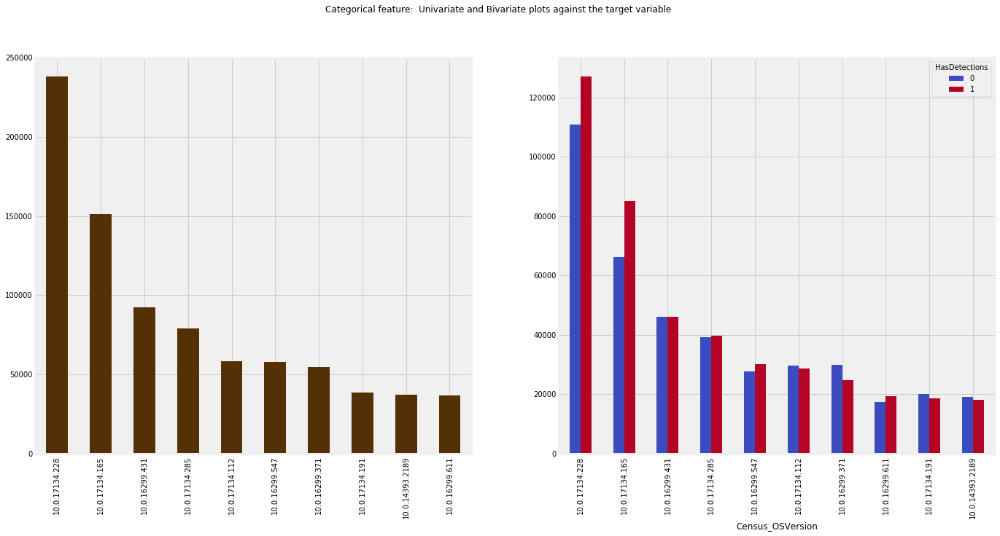

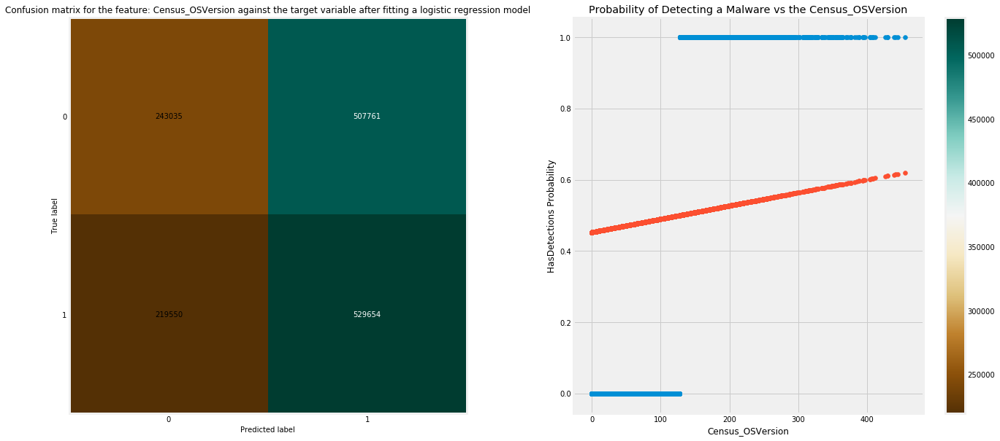

In [38]:
categorical_univariate_and_bivariate_stats(feature="Census_OSVersion")
logistic_fit(feature="Census_OSVersion")

In [39]:
categorical_univariate_and_bivariate_stats(feature="Census_OSArchitecture")
logistic_fit(feature="Census_OSArchitecture")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 most occurred categories for the categorical feature Census_OSBranch
rs4_release               675056
rs3_release               208375
rs3_release_svc_escrow    201598
rs2_release               133375
rs1_release               131210
th2_release                55162
th2_release_sec            45026
th1_st1                    32966
th1                        12684
rs5_release                 2541
Name: Census_OSBranch, dtype: int64

Fitting a logistic regression model for the feature Census_OSBranch against the target variable
              precision    recall  f1-score   support

           0       0.52      0.47      0.49    750796
           1       0.51      0.56      0.54    749204

   micro avg       0.52      0.52      0.52   1500000
   macro avg       0.52      0.52      0.51   1500000
weighted avg       0.52      0.52      0.51   1500000


accuracy score: 0.51529
F1 score: 0.51529


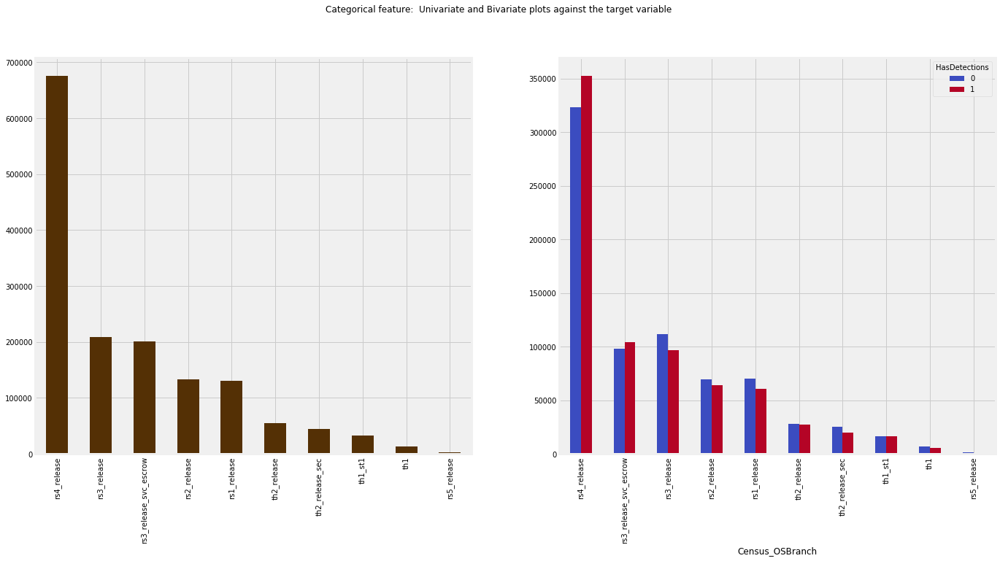

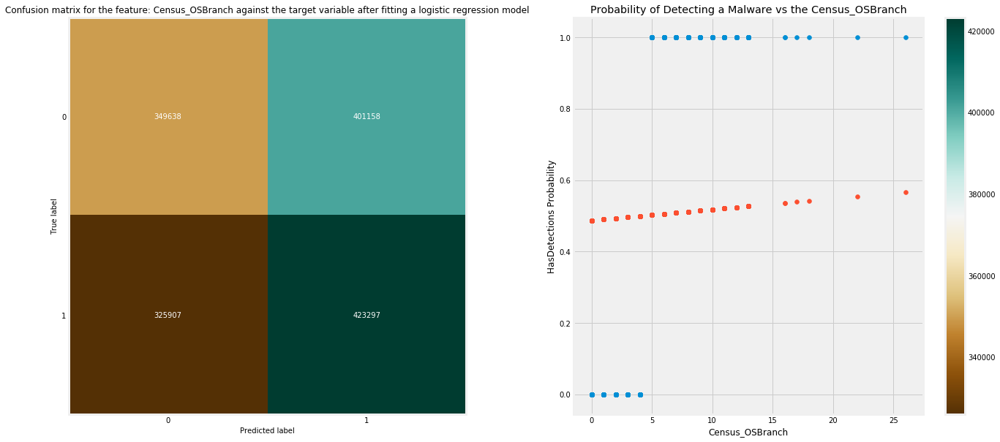

In [40]:
categorical_univariate_and_bivariate_stats(feature="Census_OSBranch")
logistic_fit(feature="Census_OSBranch")

Top 10 most occurred categories for the categorical feature Census_OSEdition
Core                     584202
Professional             526765
CoreSingleLanguage       326333
CoreCountrySpecific       27598
ProfessionalEducation      9413
Education                  6920
Enterprise                 5927
ProfessionalN              4773
EnterpriseS                3379
ServerStandard             1702
Name: Census_OSEdition, dtype: int64

Fitting a logistic regression model for the feature Census_OSEdition against the target variable
              precision    recall  f1-score   support

           0       0.51      0.64      0.57    750796
           1       0.51      0.38      0.43    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.51      0.51      0.50   1500000
weighted avg       0.51      0.51      0.50   1500000


accuracy score: 0.509216
F1 score: 0.509216


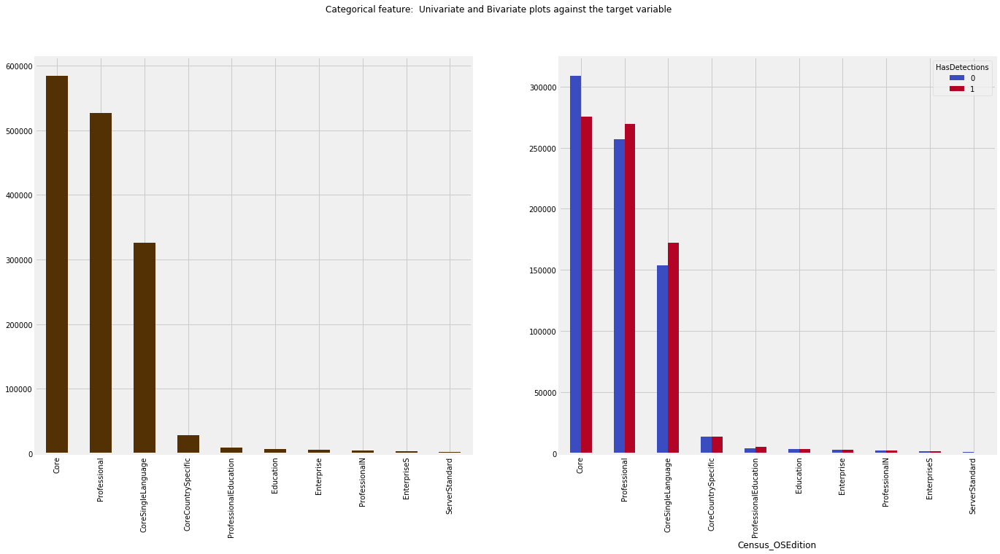

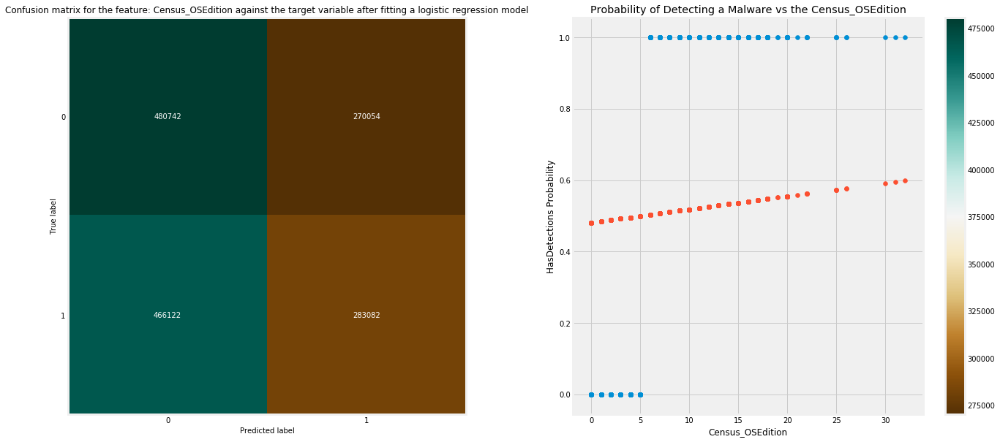

In [41]:
categorical_univariate_and_bivariate_stats(feature="Census_OSEdition")
logistic_fit(feature="Census_OSEdition")

Top 10 most occurred categories for the categorical feature Census_OSSkuName
CORE                    584197
PROFESSIONAL            536275
CORE_SINGLELANGUAGE     326270
CORE_COUNTRYSPECIFIC     27558
EDUCATION                 6937
ENTERPRISE                5939
PROFESSIONAL_N            4803
ENTERPRISE_S              3379
STANDARD_SERVER           1703
CLOUD                     1011
Name: Census_OSSkuName, dtype: int64

Fitting a logistic regression model for the feature Census_OSSkuName against the target variable
              precision    recall  f1-score   support

           0       0.51      0.64      0.57    750796
           1       0.51      0.38      0.43    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.51      0.51      0.50   1500000
weighted avg       0.51      0.51      0.50   1500000


accuracy score: 0.509216
F1 score: 0.509216


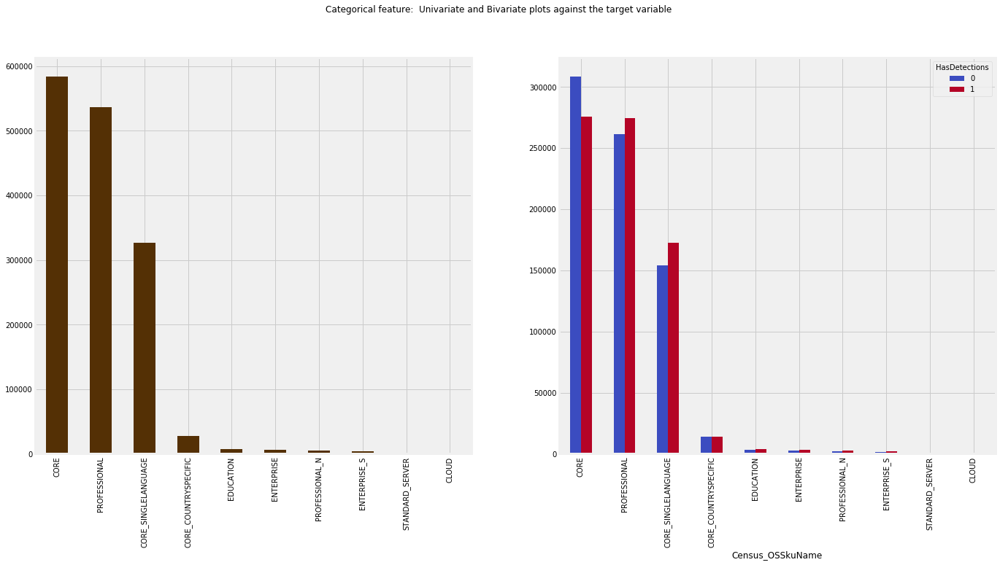

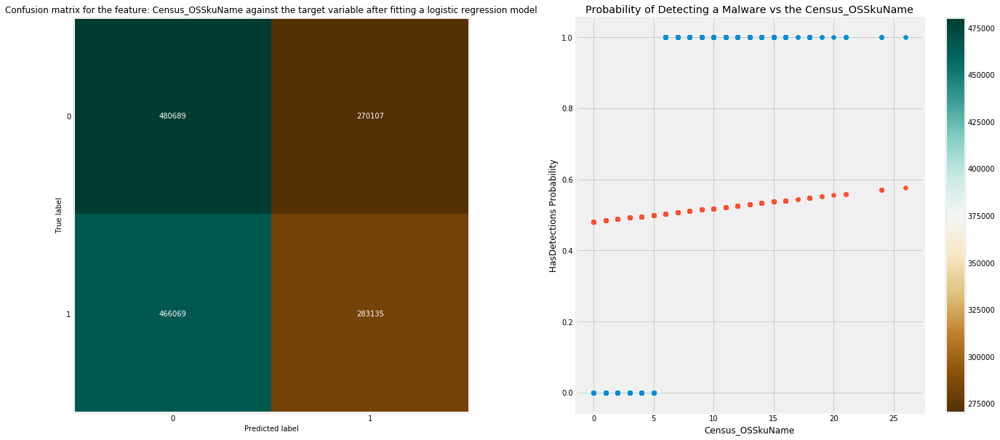

In [42]:
categorical_univariate_and_bivariate_stats(feature="Census_OSSkuName")
logistic_fit(feature="Census_OSSkuName")

Top 10 most occurred categories for the categorical feature Census_OSInstallTypeName
UUPUpgrade        439320
IBSClean          277729
Update            267127
Upgrade           210433
Other             140895
Reset             109124
Refresh            34680
Clean              11603
CleanPCRefresh      9089
Name: Census_OSInstallTypeName, dtype: int64

Fitting a logistic regression model for the feature Census_OSInstallTypeName against the target variable
              precision    recall  f1-score   support

           0       0.50      0.61      0.55    750796
           1       0.50      0.39      0.44    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.50      0.50      0.49   1500000
weighted avg       0.50      0.50      0.49   1500000


accuracy score: 0.4998453333333333
F1 score: 0.4998453333333333


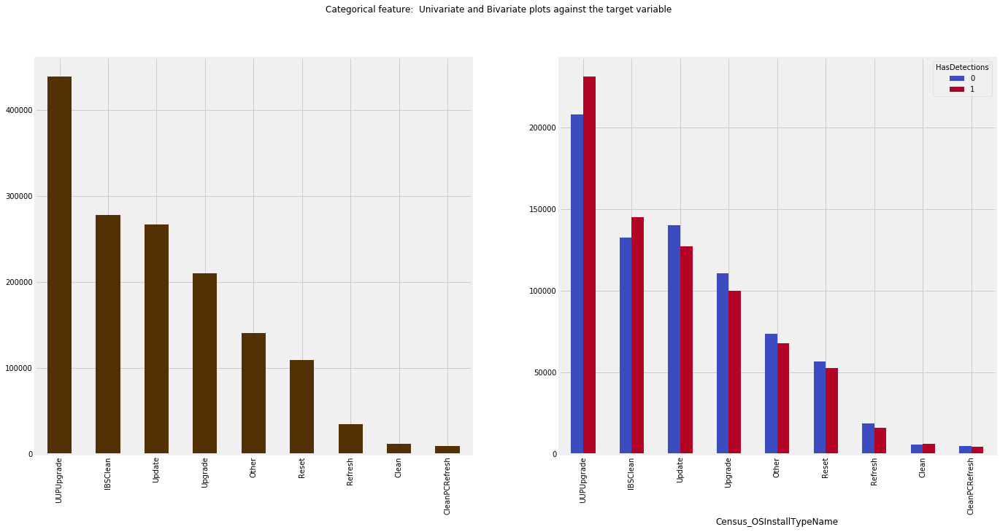

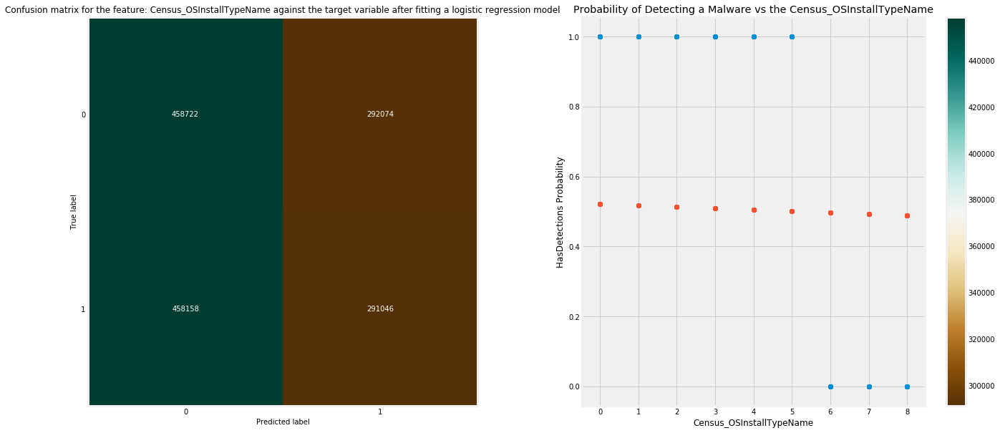

In [43]:
categorical_univariate_and_bivariate_stats(feature="Census_OSInstallTypeName")
logistic_fit(feature="Census_OSInstallTypeName")

Top 10 most occurred categories for the categorical feature Census_OSWUAutoUpdateOptionsName
FullAuto                                 665644
UNKNOWN                                  423836
Notify                                   341486
AutoInstallAndRebootAtMaintenanceTime     62207
Off                                        4428
DownloadNotify                             2399
Name: Census_OSWUAutoUpdateOptionsName, dtype: int64

Fitting a logistic regression model for the feature Census_OSWUAutoUpdateOptionsName against the target variable
              precision    recall  f1-score   support

           0       0.51      0.53      0.52    750796
           1       0.51      0.50      0.51    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.51      0.51      0.51   1500000
weighted avg       0.51      0.51      0.51   1500000


accuracy score: 0.5127053333333333
F1 score: 0.5127053333333333


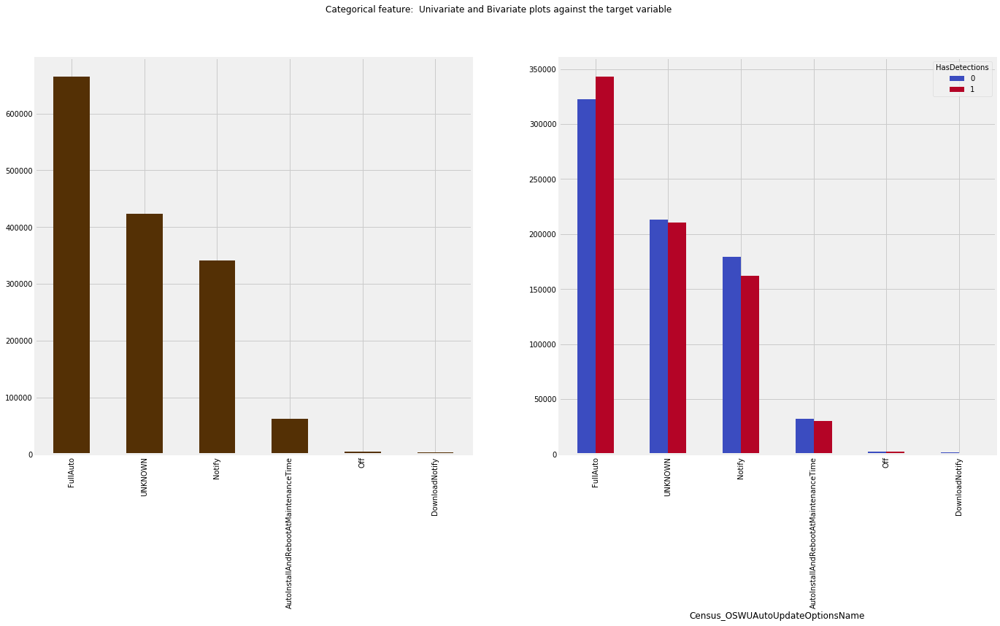

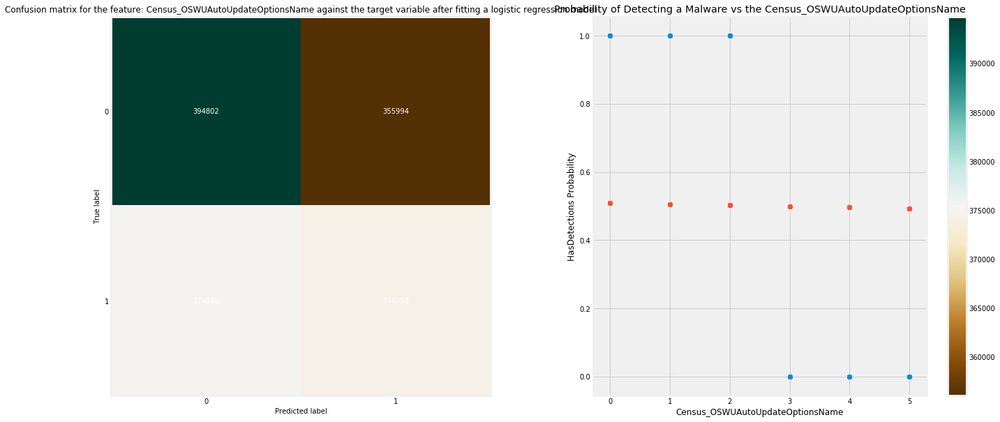

In [44]:
categorical_univariate_and_bivariate_stats(feature="Census_OSWUAutoUpdateOptionsName")
logistic_fit(feature="Census_OSWUAutoUpdateOptionsName")

Top 10 most occurred categories for the categorical feature Census_GenuineStateName
IS_GENUINE         1324628
INVALID_LICENSE     134663
OFFLINE              38405
UNKNOWN               2304
TAMPERED                 0
Name: Census_GenuineStateName, dtype: int64

Fitting a logistic regression model for the feature Census_GenuineStateName against the target variable
              precision    recall  f1-score   support

           0       0.51      0.09      0.15    750796
           1       0.50      0.91      0.65    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.50      0.50      0.40   1500000
weighted avg       0.50      0.50      0.40   1500000


accuracy score: 0.5009273333333333
F1 score: 0.5009273333333333


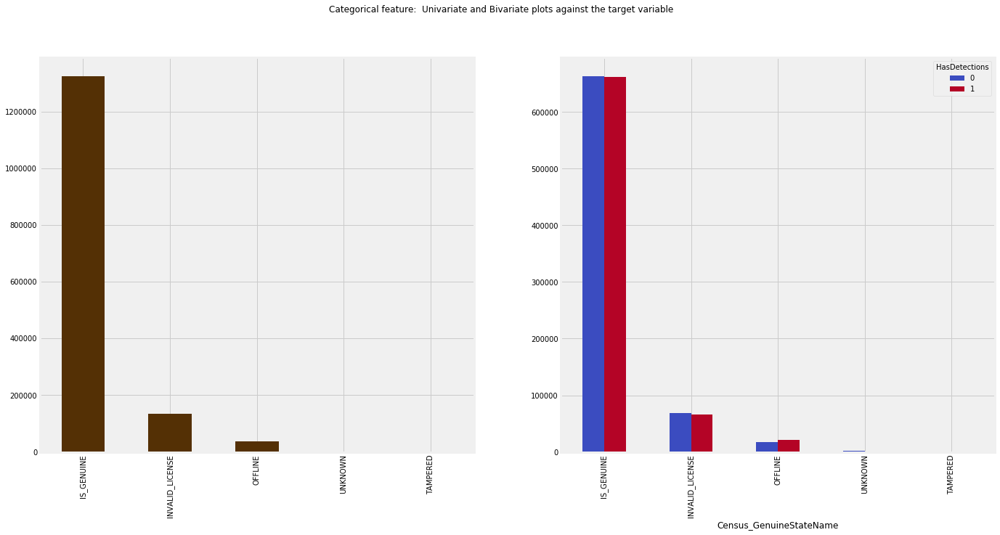

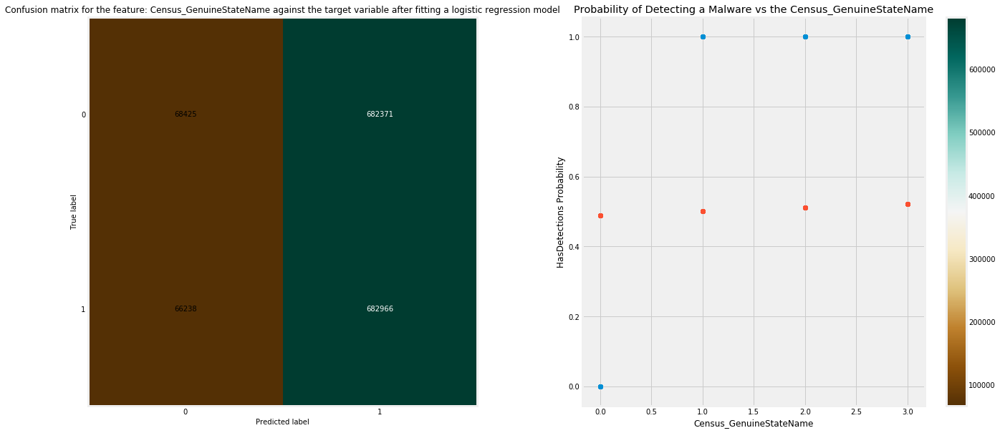

In [45]:
categorical_univariate_and_bivariate_stats(feature="Census_GenuineStateName")
logistic_fit(feature="Census_GenuineStateName")

Top 10 most occurred categories for the categorical feature Census_ActivationChannel
Retail            794507
OEM:DM            574452
Volume:GVLK        75538
OEM:NONSLP         53579
Volume:MAK          1342
Retail:TB:Eval       582
Name: Census_ActivationChannel, dtype: int64

Fitting a logistic regression model for the feature Census_ActivationChannel against the target variable
              precision    recall  f1-score   support

           0       0.50      0.42      0.46    750796
           1       0.50      0.58      0.54    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.50      0.50      0.50   1500000
weighted avg       0.50      0.50      0.50   1500000


accuracy score: 0.50087
F1 score: 0.50087


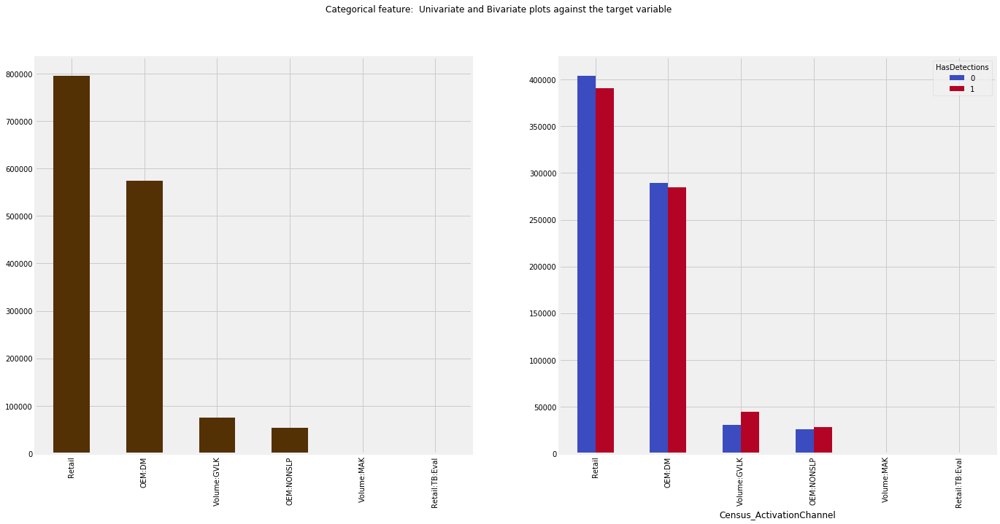

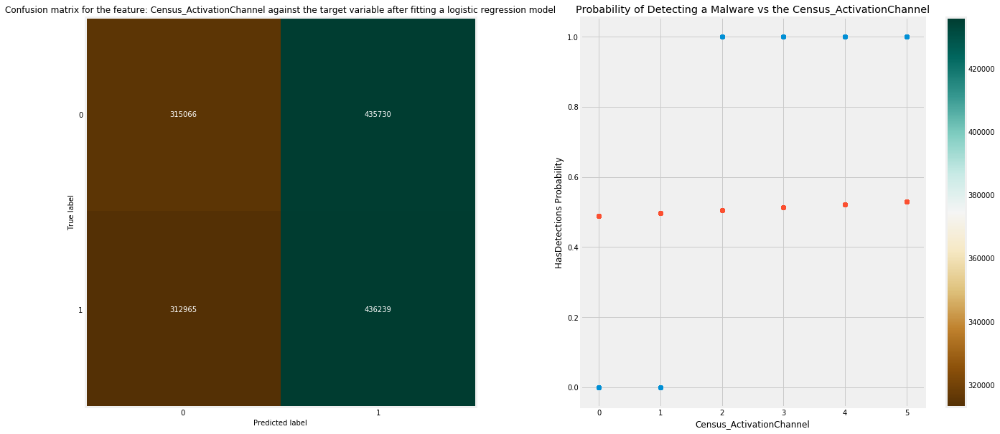

In [46]:
categorical_univariate_and_bivariate_stats(feature="Census_ActivationChannel")
logistic_fit(feature="Census_ActivationChannel")

In [47]:
categorical_univariate_and_bivariate_stats(feature="Census_FlightRing")
logistic_fit(feature="Census_FlightRing")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [48]:
gc.collect()

10574

### Numerical Columns Univariate and Bivariate Plots against the taget variable

#### Inspecting each one of the numerical features from the train set and illustrating the top most occured values against the *HasDetections* target variable. Moreover trying to fit a logistic regression model between the target variable and the inspected feature to identify if the feature is a good predictor.

In [49]:
numerical_and_binary_columns

['AVProductStatesIdentifier',
 'AVProductsInstalled',
 'CountryIdentifier',
 'CityIdentifier',
 'OrganizationIdentifier',
 'GeoNameIdentifier',
 'LocaleEnglishNameIdentifier',
 'OsBuild',
 'OsSuite',
 'IeVerIdentifier',
 'Census_OEMNameIdentifier',
 'Census_OEMModelIdentifier',
 'Census_ProcessorCoreCount',
 'Census_ProcessorManufacturerIdentifier',
 'Census_ProcessorModelIdentifier',
 'Census_PrimaryDiskTotalCapacity',
 'Census_SystemVolumeTotalCapacity',
 'Census_TotalPhysicalRAM',
 'Census_InternalPrimaryDiagonalDisplaySizeInInches',
 'Census_InternalPrimaryDisplayResolutionHorizontal',
 'Census_InternalPrimaryDisplayResolutionVertical',
 'Census_InternalBatteryNumberOfCharges',
 'Census_OSBuildNumber',
 'Census_OSBuildRevision',
 'Census_OSInstallLanguageIdentifier',
 'Census_OSUILocaleIdentifier',
 'Census_ThresholdOptIn',
 'Census_FirmwareManufacturerIdentifier',
 'Census_FirmwareVersionIdentifier',
 'Census_IsWIMBootEnabled',
 'Wdft_IsGamer',
 'Wdft_RegionIdentifier']

In [50]:
def numerical_univariate_and_bivariate_plot(feature, num_of_bins = 40):
    
    import warnings
    warnings.filterwarnings("ignore", category=FutureWarning)
    warnings.filterwarnings("ignore", category=RuntimeWarning)
    
    sns.set_style("darkgrid", {"axes.facecolor": ".9"})
    
    if feature in train_sample.columns:
    
        print("Top 10 Values counts for the numerical feature", feature)
        print(train_sample[feature].value_counts().head(10))
        print("Min value", train_sample[feature].min())
        print("Max value", train_sample[feature].max())
        print("NaN values", train_sample[feature].isnull().sum())
        print("Number of unique values", train_sample[feature].nunique())

        if train[feature].nunique() > 2:
            print("Mean value", train_sample[feature].mean())
            print("Variance value", train_sample[feature].var())

        # for binary features
        if train[feature].nunique() <= 2:

            f, axes = plt.subplots(1, 2, figsize=(21, 10))

            sns.countplot(x=feature, data=train_sample, ax=axes[0])
            sns.countplot(x=feature, hue = "HasDetections", data=train_sample, ax=axes[1], palette=['b','r'])
            
            f.suptitle("Numerical feature: "+feature+" Univariate and Bivariate plots against the target variable")

        # for numeric features
        else:

            f, axes = plt.subplots(1, 3, figsize=(21, 10))

            sns.distplot(train_sample[feature].dropna(), rug=False, kde=False, ax=axes[0], bins = num_of_bins)

            sns.violinplot(x="HasDetections", y = feature, hue="HasDetections", data=train_sample, ax=axes[1], palette=['b','r'])

            if feature == "LocaleEnglishNameIdentifier":
                sns.distplot(train_sample[train_sample["HasDetections"] == 0][feature].dropna().astype("int16"), rug=False, kde=False, color="b", ax=axes[2], bins = num_of_bins)
                sns.distplot(train_sample[train_sample["HasDetections"] == 1][feature].dropna().astype("int16"), rug=False, kde=False, color="r", ax=axes[2], bins = num_of_bins)
            else:
                sns.distplot(train_sample[train_sample["HasDetections"] == 0][feature].dropna(), rug=False, kde=False, color="b", ax=axes[2], bins = num_of_bins)
                sns.distplot(train_sample[train_sample["HasDetections"] == 1][feature].dropna(), rug=False, kde=False, color="r", ax=axes[2], bins = num_of_bins)
            
                f.suptitle("Numerical feature: "+feature+" Univariate and Bivariate plots against the target variable")
    else:
        print("This feature has been removed from dataset due to high NaN rate or highly unbalanced values")




In [51]:
numerical_univariate_and_bivariate_plot(feature = "IsBeta")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [52]:
numerical_univariate_and_bivariate_plot(feature="RtpStateBitfield")
logistic_fit("RtpStateBitfield")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [53]:
numerical_univariate_and_bivariate_plot(feature="IsSxsPassiveMode")
logistic_fit("IsSxsPassiveMode")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature AVProductStatesIdentifier
53447.0    979192
7945.0      80362
47238.0     55084
62773.0     44810
46413.0     19109
49480.0     16968
23657.0     16883
41571.0     16253
29199.0     12589
51954.0     11270
Name: AVProductStatesIdentifier, dtype: int64
Min value 3.0
Max value 70498.0
NaN values 6010
Number of unique values 10434
Mean value 47869.1328125
Variance value 197971680.0

Fitting a logistic regression model for the feature AVProductStatesIdentifier against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00    747103
           1       0.50      1.00      0.67    746887

   micro avg       0.50      0.50      0.50   1493990
   macro avg       0.25      0.50      0.33   1493990
weighted avg       0.25      0.50      0.33   1493990


accuracy score: 0.4999277103595071
F1 score: 0.4999277103595071


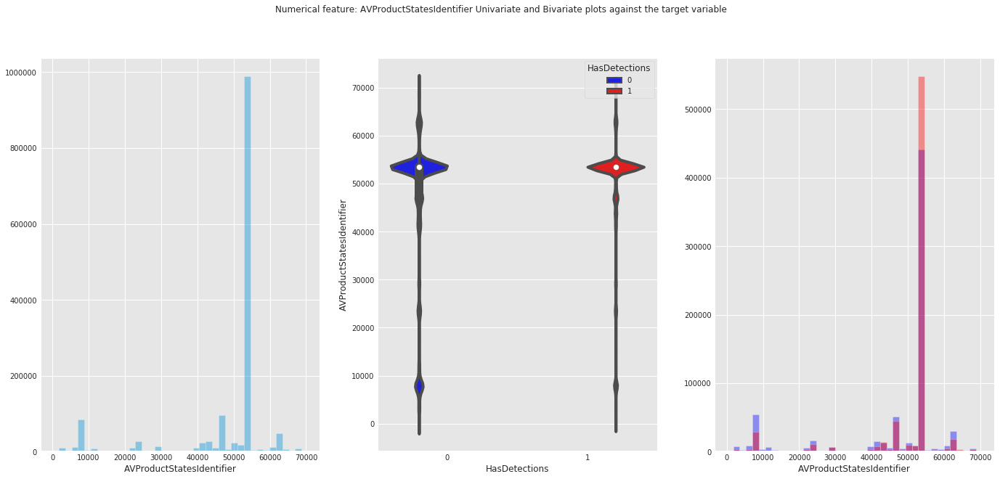

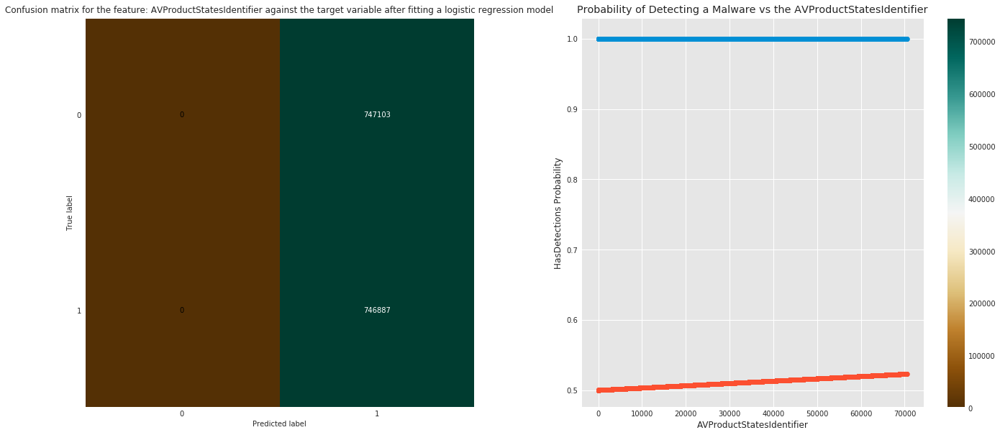

In [54]:
numerical_univariate_and_bivariate_plot(feature="AVProductStatesIdentifier")
logistic_fit("AVProductStatesIdentifier")

Top 10 Values counts for the numerical feature AVProductsInstalled
1.0    1044138
2.0     413380
3.0      34874
4.0       1509
5.0         84
6.0          4
7.0          1
Name: AVProductsInstalled, dtype: int64
Min value 1.0
Max value 7.0
NaN values 6010
Number of unique values 7
Mean value nan
Variance value 0.0

Fitting a logistic regression model for the feature AVProductsInstalled against the target variable
              precision    recall  f1-score   support

           0       0.61      0.37      0.46    747103
           1       0.55      0.77      0.64    746887

   micro avg       0.57      0.57      0.57   1493990
   macro avg       0.58      0.57      0.55   1493990
weighted avg       0.58      0.57      0.55   1493990


accuracy score: 0.567345832301421
F1 score: 0.567345832301421


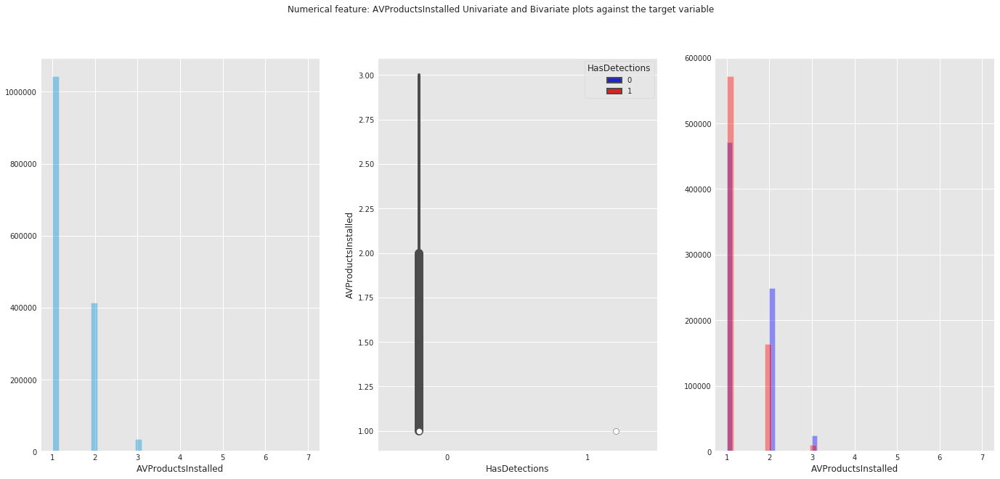

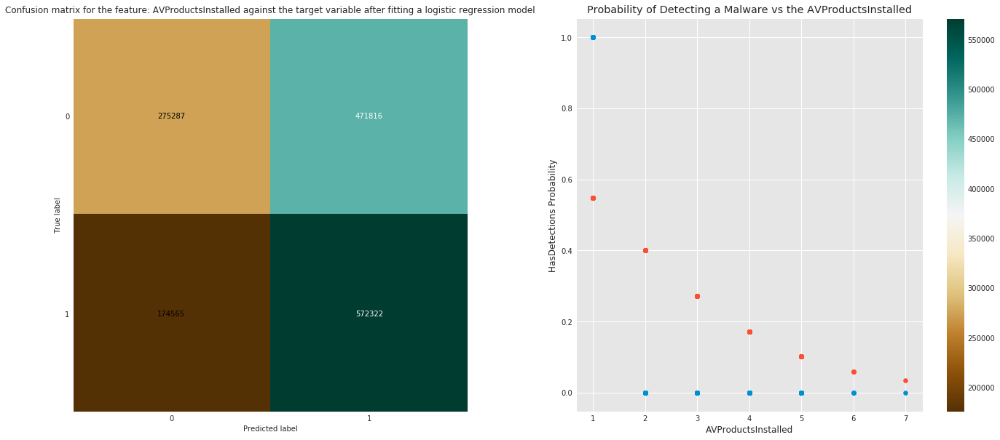

In [55]:
numerical_univariate_and_bivariate_plot(feature="AVProductsInstalled")
logistic_fit("AVProductsInstalled")

In [56]:
numerical_univariate_and_bivariate_plot("HasTpm")
logistic_fit("HasTpm")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature CountryIdentifier
43     66591
29     58304
141    55688
93     48047
171    47411
60     39401
201    37118
207    35549
66     34996
89     33766
Name: CountryIdentifier, dtype: int64
Min value 1
Max value 222
NaN values 0
Number of unique values 222
Mean value 108.041802
Variance value 3974.380969513443

Fitting a logistic regression model for the feature CountryIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.50      0.58      0.54    750796
           1       0.50      0.42      0.46    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.50      0.50      0.50   1500000
weighted avg       0.50      0.50      0.50   1500000


accuracy score: 0.50123
F1 score: 0.50123


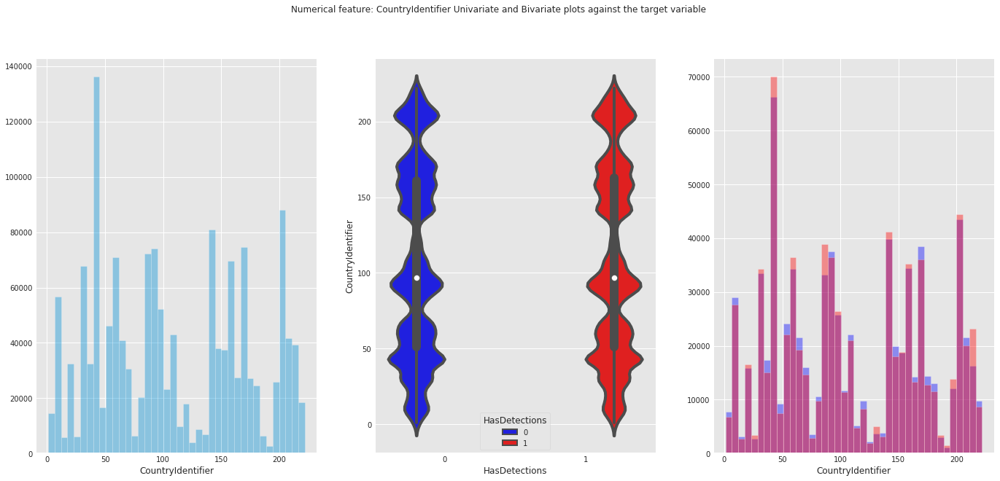

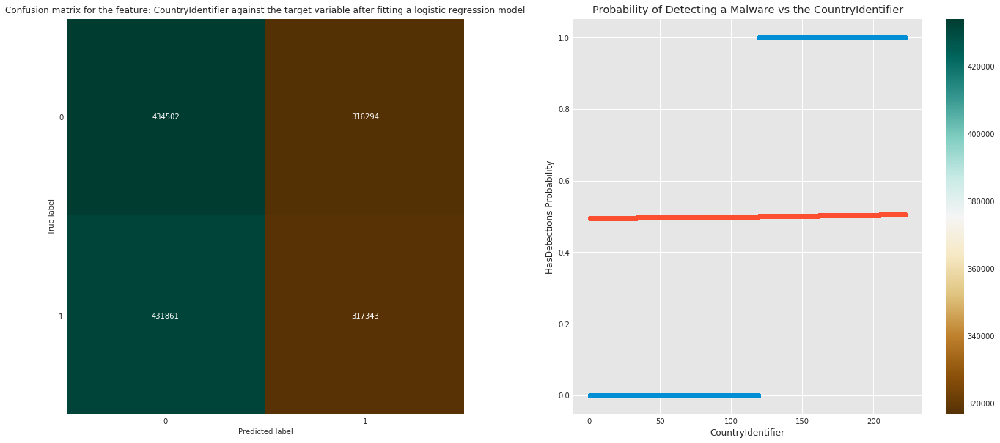

In [57]:
numerical_univariate_and_bivariate_plot("CountryIdentifier")
logistic_fit("CountryIdentifier")

Top 10 Values counts for the numerical feature CityIdentifier
130775.0    15897
16668.0     14316
82373.0     14047
10222.0     12115
61668.0     11061
143782.0    10943
66202.0     10817
58607.0     10297
66953.0      9643
92213.0      9597
Name: CityIdentifier, dtype: int64
Min value 7.0
Max value 167962.0
NaN values 54505
Number of unique values 60129
Mean value 81264.6953125
Variance value 2389908224.0

Fitting a logistic regression model for the feature CityIdentifier against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.50      1.00      0.67    723054
           1       0.00      0.00      0.00    722441

   micro avg       0.50      0.50      0.50   1445495
   macro avg       0.25      0.50      0.33   1445495
weighted avg       0.25      0.50      0.33   1445495


accuracy score: 0.5002120380907579
F1 score: 0.5002120380907579


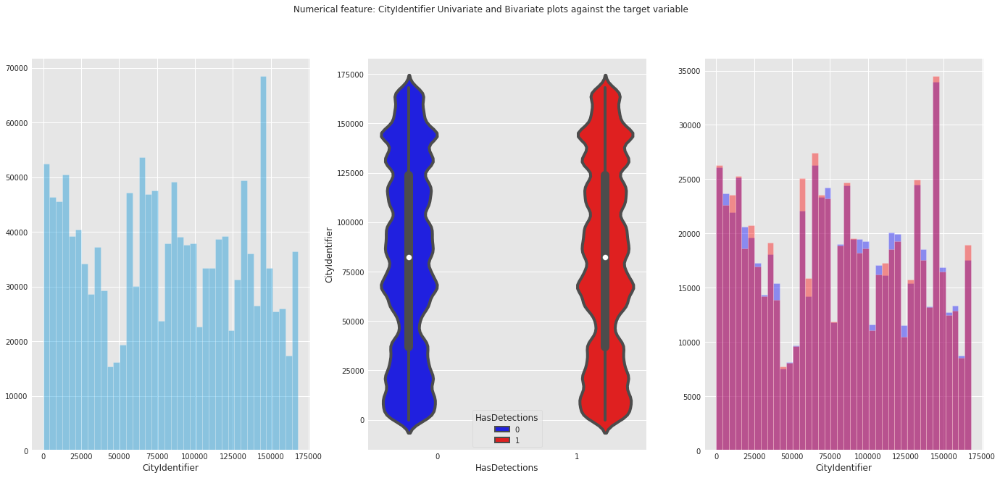

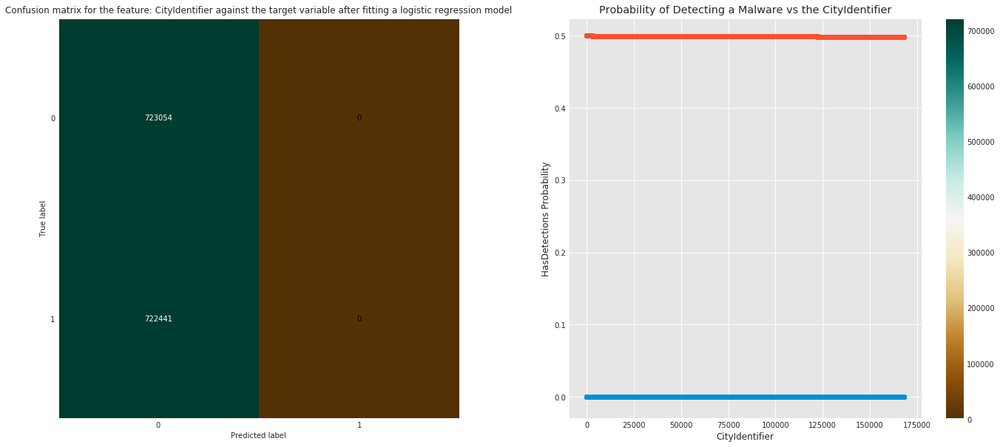

In [58]:
numerical_univariate_and_bivariate_plot("CityIdentifier")
logistic_fit("CityIdentifier")

Top 10 Values counts for the numerical feature OrganizationIdentifier
27.0    704559
18.0    296890
48.0     10805
50.0      7565
37.0      3227
11.0      3224
49.0      2278
46.0      1825
14.0       827
32.0       645
Name: OrganizationIdentifier, dtype: int64
Min value 1.0
Max value 52.0
NaN values 463471
Number of unique values 46
Mean value nan
Variance value 0.0

Fitting a logistic regression model for the feature OrganizationIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.50      0.29      0.37    517446
           1       0.50      0.71      0.58    519083

   micro avg       0.50      0.50      0.50   1036529
   macro avg       0.50      0.50      0.48   1036529
weighted avg       0.50      0.50      0.48   1036529


accuracy score: 0.49823111557901417
F1 score: 0.49823111557901417


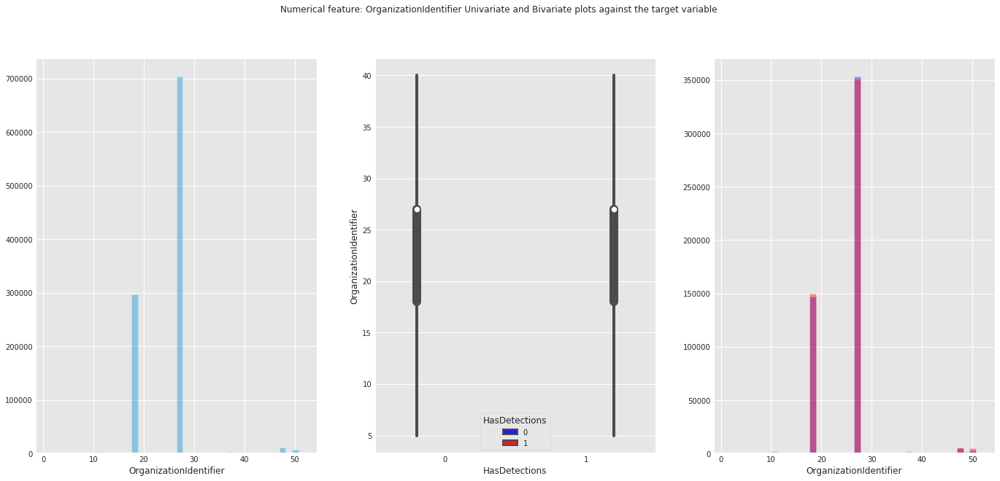

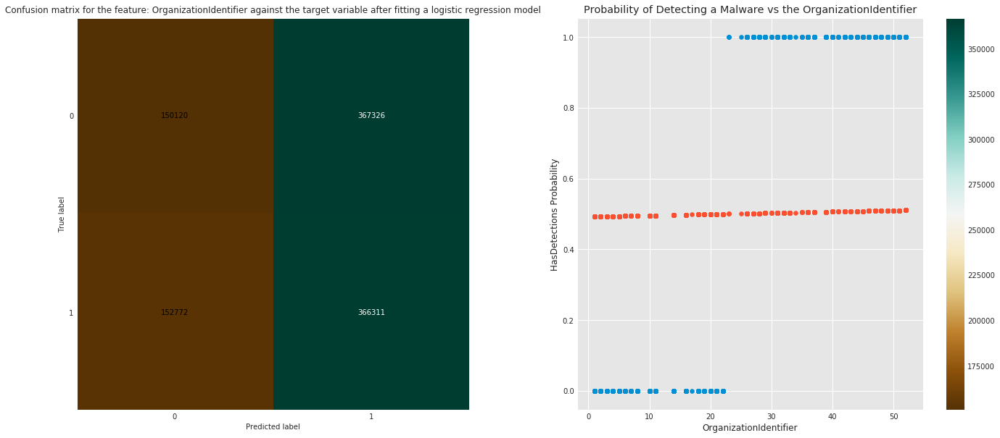

In [59]:
numerical_univariate_and_bivariate_plot("OrganizationIdentifier")
logistic_fit("OrganizationIdentifier")

Top 10 Values counts for the numerical feature GeoNameIdentifier
277.0    257381
211.0     71160
53.0      68487
89.0      60821
240.0     58335
35.0      57904
167.0     56887
276.0     50054
267.0     36293
126.0     33336
Name: GeoNameIdentifier, dtype: int64
Min value 1.0
Max value 296.0
NaN values 36
Number of unique values 278
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature GeoNameIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.50      0.58      0.54    750772
           1       0.50      0.43      0.46    749192

   micro avg       0.50      0.50      0.50   1499964
   macro avg       0.50      0.50      0.50   1499964
weighted avg       0.50      0.50      0.50   1499964


accuracy score: 0.5009033550138536
F1 score: 0.5009033550138536


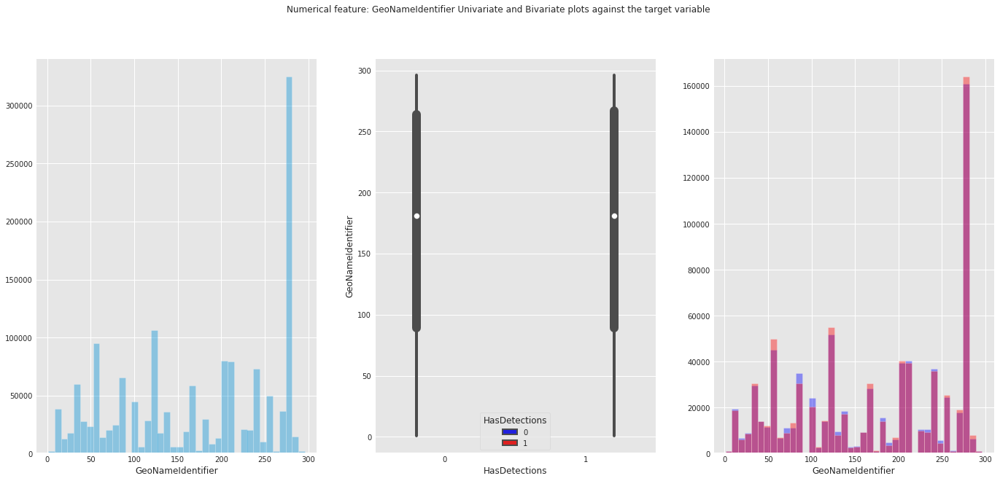

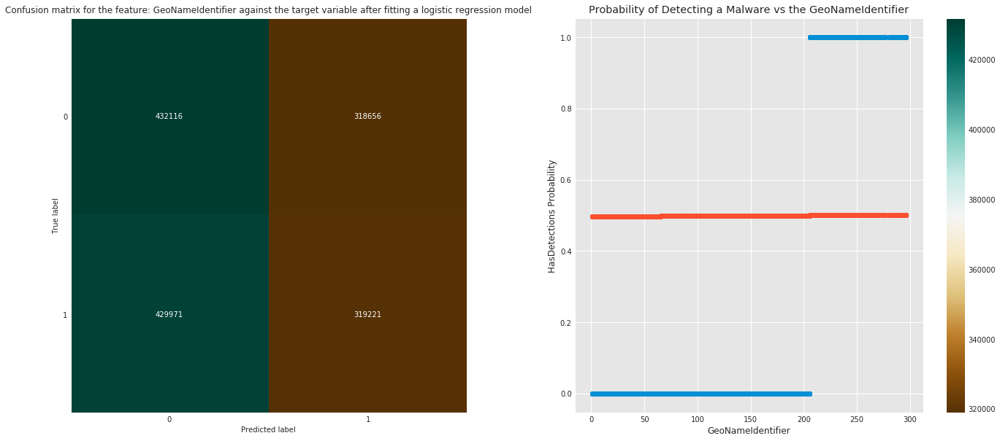

In [60]:
numerical_univariate_and_bivariate_plot("GeoNameIdentifier")
logistic_fit("GeoNameIdentifier")

Top 10 Values counts for the numerical feature LocaleEnglishNameIdentifier
 75     351700
-74      75653
 74      69177
 42      68626
 88      63263
-85      57508
-23      57466
-29      55703
-5       35563
 124     32852
Name: LocaleEnglishNameIdentifier, dtype: int64
Min value -128
Max value 127
NaN values 0
Number of unique values 239
Mean value 27.974848666666666
Variance value 4303.0712421245935

Fitting a logistic regression model for the feature LocaleEnglishNameIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.62      0.56    750796
           1       0.51      0.39      0.44    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.51      0.51      0.50   1500000
weighted avg       0.51      0.51      0.50   1500000


accuracy score: 0.50694
F1 score: 0.50694


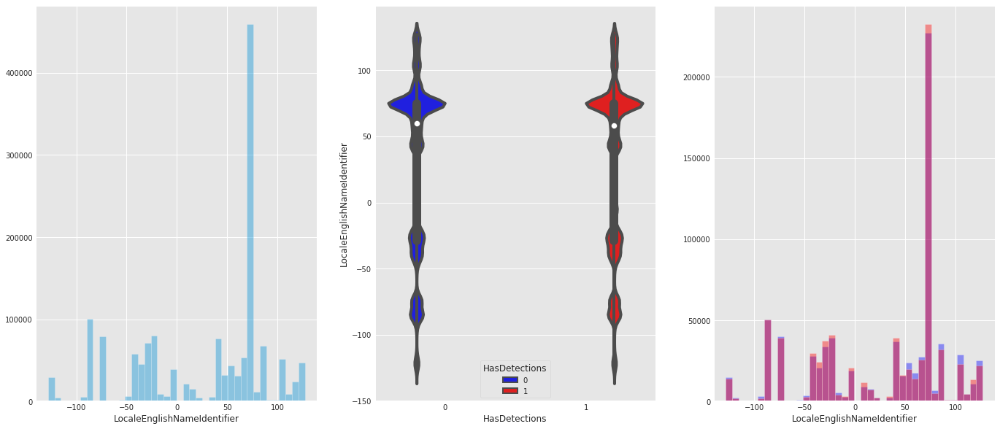

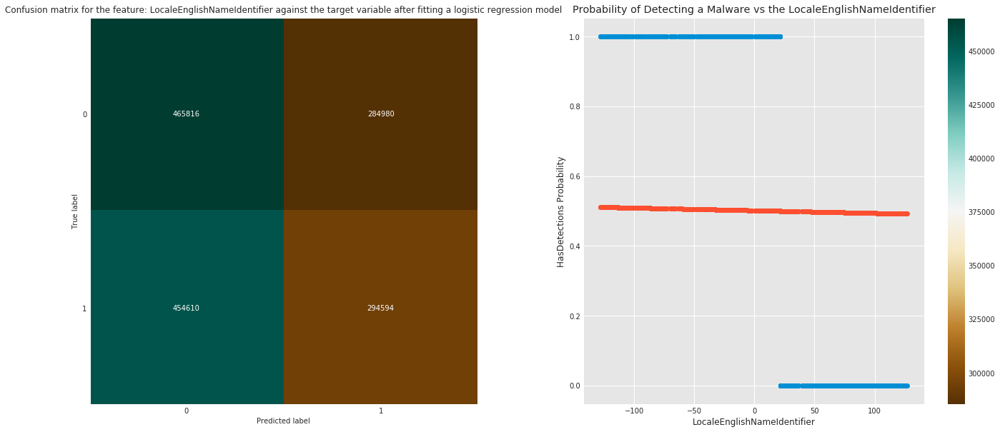

In [61]:
numerical_univariate_and_bivariate_plot("LocaleEnglishNameIdentifier")
logistic_fit("LocaleEnglishNameIdentifier")

Top 10 Values counts for the numerical feature OsBuild
17134    659307
16299    421058
15063    130582
14393    122160
10586     69383
10240     45416
9600      32618
7601      15873
17692       516
17744       408
Name: OsBuild, dtype: int64
Min value 7600
Max value 18242
NaN values 0
Number of unique values 53
Mean value 15720.627447333334
Variance value 4807899.5925089065

Fitting a logistic regression model for the feature OsBuild against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00    750796
           1       0.50      1.00      0.67    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.25      0.50      0.33   1500000
weighted avg       0.25      0.50      0.33   1500000


accuracy score: 0.4994693333333333
F1 score: 0.4994693333333333


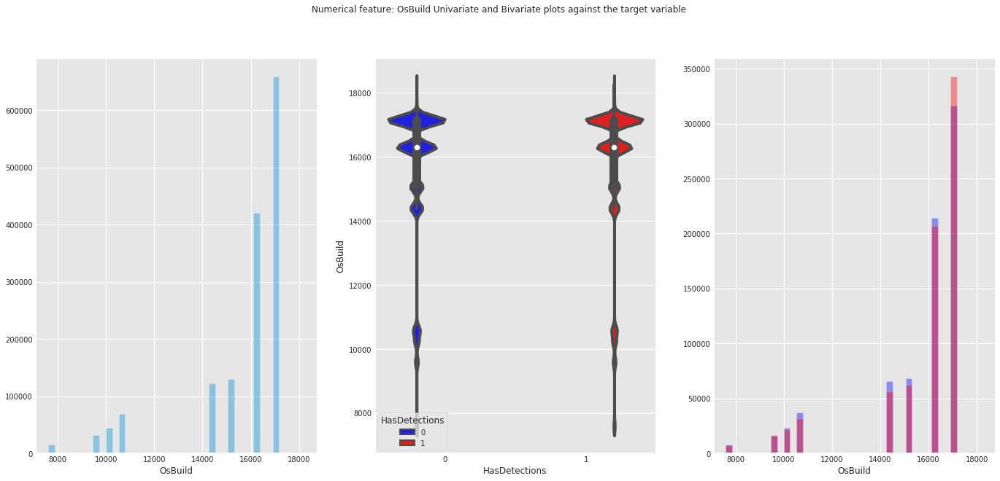

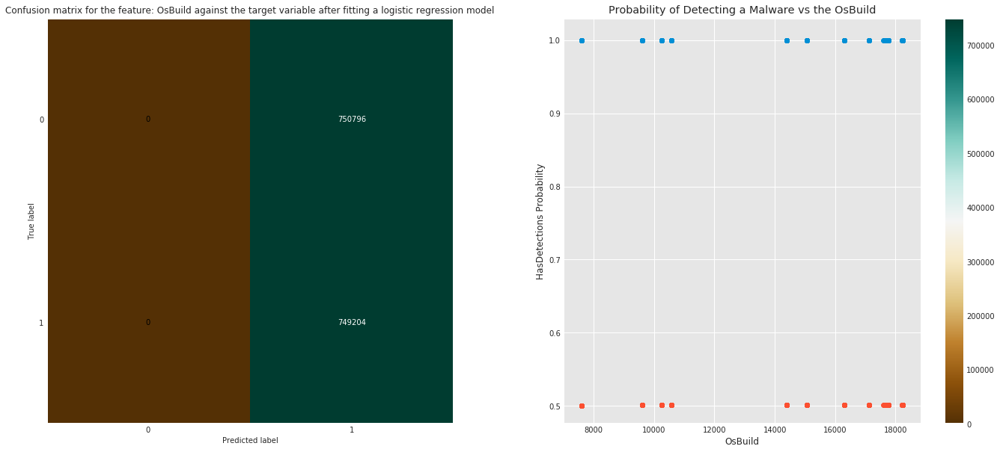

In [62]:
numerical_univariate_and_bivariate_plot("OsBuild")
logistic_fit("OsBuild")

Top 10 Values counts for the numerical feature OsSuite
768    934584
256    562984
272      1988
400       150
16        133
305       114
784        33
274         8
144         3
49          2
Name: OsSuite, dtype: int64
Min value 16
Max value 784
NaN values 0
Number of unique values 11
Mean value 575.0337746666667
Variance value 61561.84124716603

Fitting a logistic regression model for the feature OsSuite against the target variable
              precision    recall  f1-score   support

           0       0.51      0.63      0.56    750796
           1       0.51      0.39      0.44    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.51      0.51      0.50   1500000
weighted avg       0.51      0.51      0.50   1500000


accuracy score: 0.510162
F1 score: 0.510162


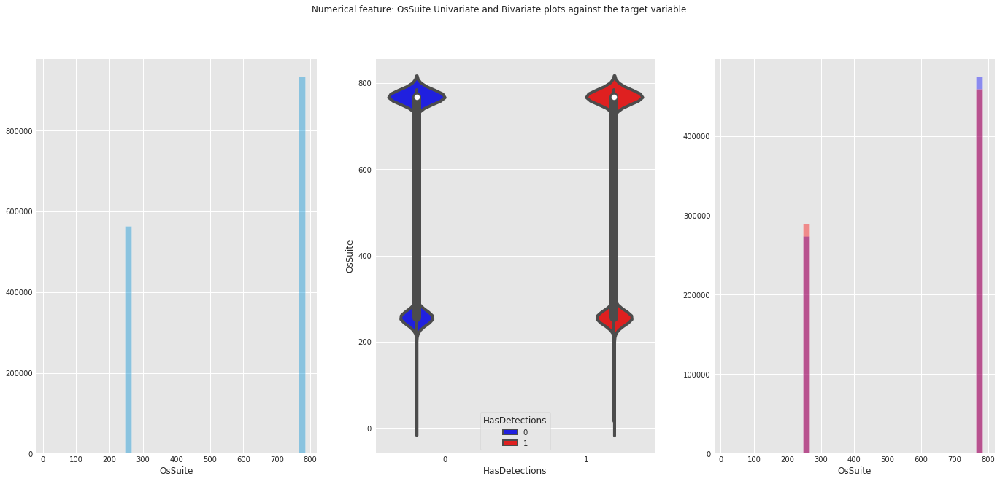

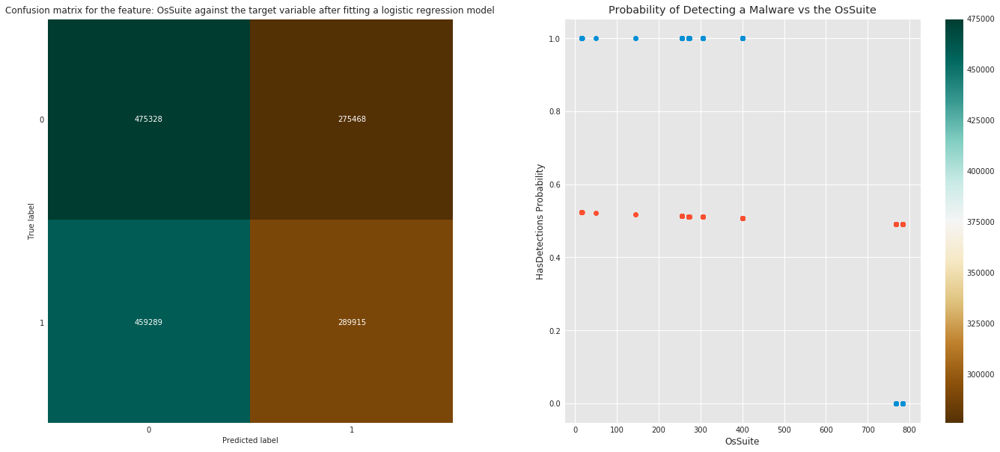

In [63]:
numerical_univariate_and_bivariate_plot("OsSuite")
logistic_fit("OsSuite")

In [64]:
numerical_univariate_and_bivariate_plot("IsProtected")
logistic_fit("IsProtected")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [65]:
numerical_univariate_and_bivariate_plot("AutoSampleOptIn")
logistic_fit("AutoSampleOptIn")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [66]:
numerical_univariate_and_bivariate_plot("SMode")
logistic_fit("SMode")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature IeVerIdentifier
137.0    654228
117.0    296754
108.0     79485
111.0     78904
98.0      58946
135.0     36934
53.0      34425
74.0      34162
94.0      29232
105.0     28993
Name: IeVerIdentifier, dtype: int64
Min value 1.0
Max value 429.0
NaN values 9949
Number of unique values 212
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature IeVerIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.52      0.52      0.52    745842
           1       0.52      0.52      0.52    744209

   micro avg       0.52      0.52      0.52   1490051
   macro avg       0.52      0.52      0.52   1490051
weighted avg       0.52      0.52      0.52   1490051


accuracy score: 0.516828618617752
F1 score: 0.516828618617752


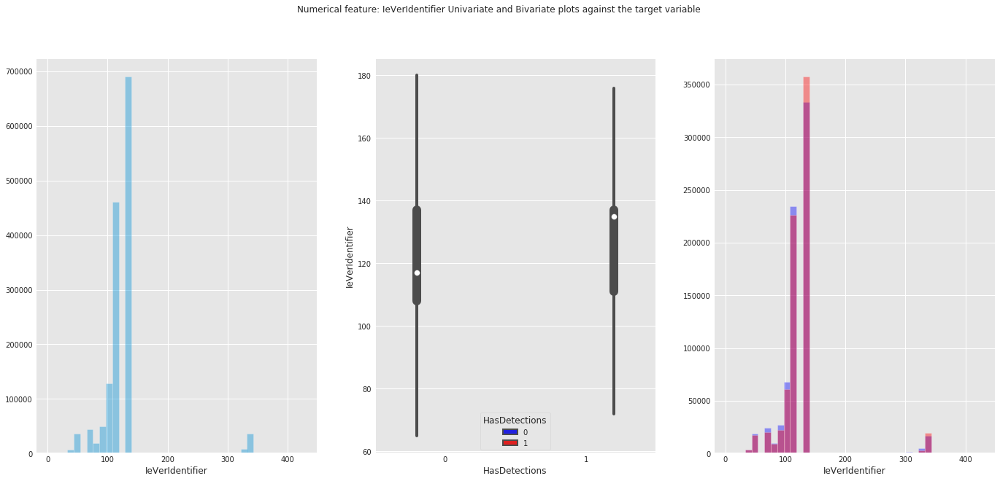

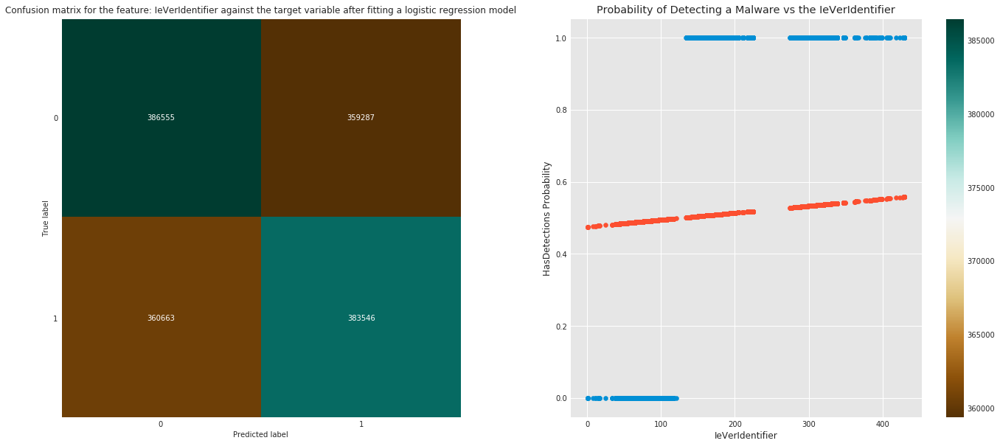

In [67]:
numerical_univariate_and_bivariate_plot("IeVerIdentifier")
logistic_fit("IeVerIdentifier")

In [68]:
numerical_univariate_and_bivariate_plot("Firewall")
logistic_fit("Firewall")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [69]:
numerical_univariate_and_bivariate_plot("UacLuaenable")
logistic_fit("UacLuaenable")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature Census_OEMNameIdentifier
2668.0    216331
2102.0    174141
1443.0    159529
2206.0    155632
585.0     150412
525.0     141896
4588.0     52224
4728.0     51268
1980.0     48197
4144.0     34171
Name: Census_OEMNameIdentifier, dtype: int64
Min value 15.0
Max value 6144.0
NaN values 16072
Number of unique values 1692
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature Census_OEMNameIdentifier against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.50      1.00      0.67    742386
           1       0.00      0.00      0.00    741542

   micro avg       0.50      0.50      0.50   1483928
   macro avg       0.25      0.50      0.33   1483928
weighted avg       0.25      0.50      0.33   1483928


accuracy score: 0.5002843803742499
F1 score: 0.5002843803742499


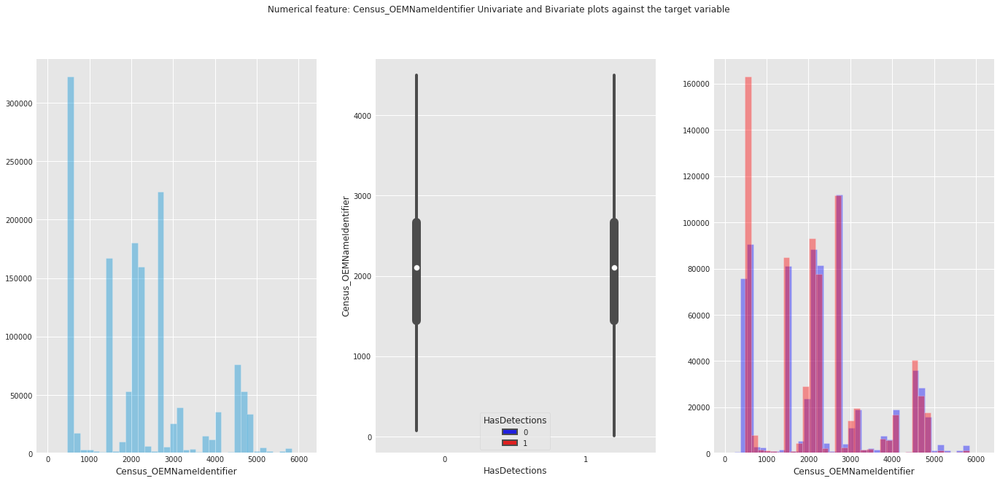

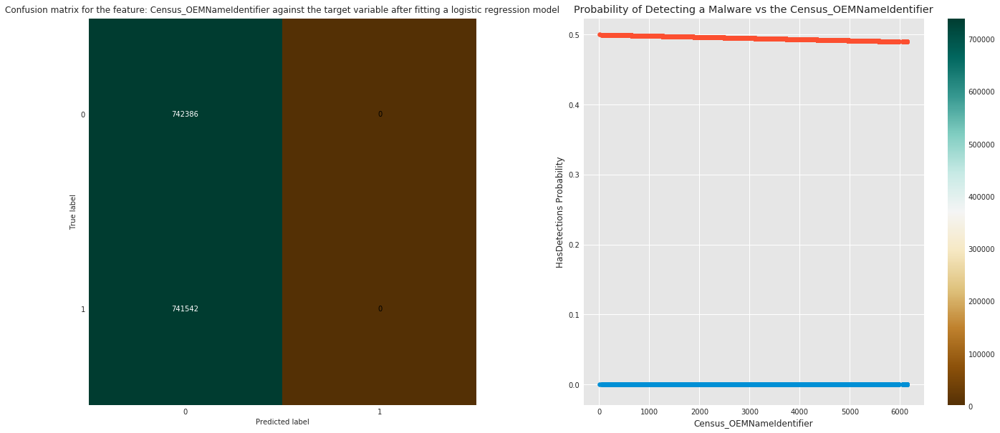

In [70]:
numerical_univariate_and_bivariate_plot("Census_OEMNameIdentifier")
logistic_fit("Census_OEMNameIdentifier")

Top 10 Values counts for the numerical feature Census_OEMModelIdentifier
313586.0    51266
242491.0    44133
317701.0    23222
317708.0    19389
228975.0    13347
188345.0    11925
245824.0    11651
241876.0    11566
244755.0     8305
248045.0     7283
Name: Census_OEMModelIdentifier, dtype: int64
Min value 1.0
Max value 345494.0
NaN values 17211
Number of unique values 74108
Mean value 239224.015625
Variance value 5192636416.0

Fitting a logistic regression model for the feature Census_OEMModelIdentifier against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.50      1.00      0.67    741762
           1       0.00      0.00      0.00    741027

   micro avg       0.50      0.50      0.50   1482789
   macro avg       0.25      0.50      0.33   1482789
weighted avg       0.25      0.50      0.33   1482789


accuracy score: 0.5002478437592941
F1 score: 0.5002478437592941


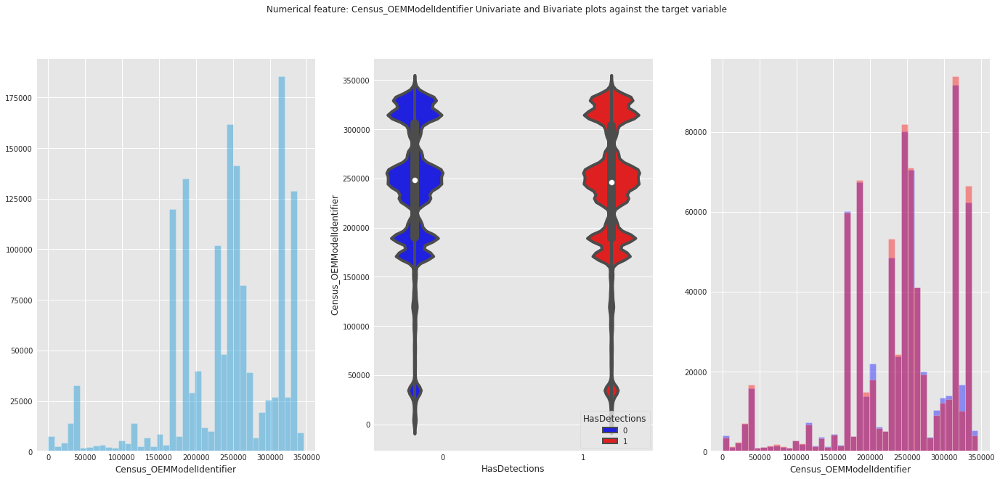

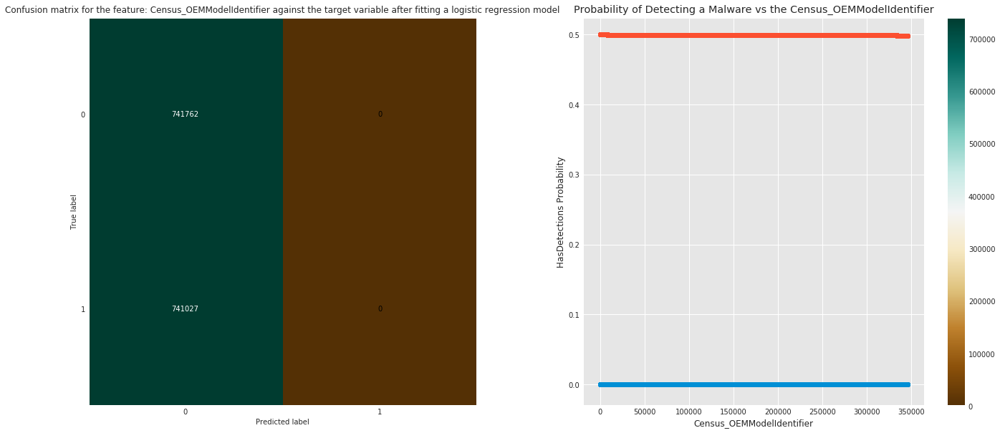

In [71]:
numerical_univariate_and_bivariate_plot("Census_OEMModelIdentifier")
logistic_fit("Census_OEMModelIdentifier")

Top 10 Values counts for the numerical feature Census_ProcessorCoreCount
4.0     912463
2.0     388477
8.0     146011
12.0     15492
1.0      11991
6.0      11902
16.0      3171
3.0       2290
32.0       364
24.0       298
Name: Census_ProcessorCoreCount, dtype: int64
Min value 1.0
Max value 88.0
NaN values 6904
Number of unique values 31
Mean value nan
Variance value 0.0

Fitting a logistic regression model for the feature Census_ProcessorCoreCount against the target variable
              precision    recall  f1-score   support

           0       0.51      0.89      0.65    747701
           1       0.56      0.13      0.21    745395

   micro avg       0.51      0.51      0.51   1493096
   macro avg       0.53      0.51      0.43   1493096
weighted avg       0.53      0.51      0.43   1493096


accuracy score: 0.514364782974437
F1 score: 0.514364782974437


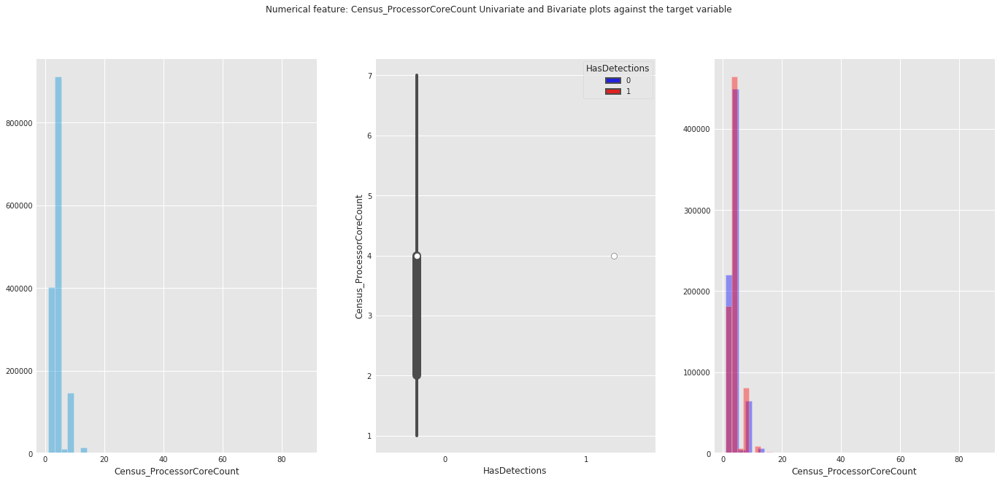

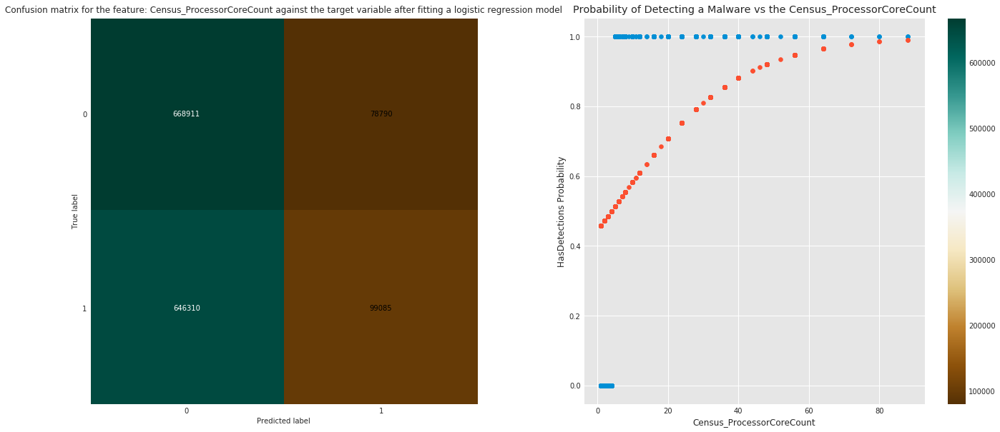

In [72]:
numerical_univariate_and_bivariate_plot("Census_ProcessorCoreCount")
logistic_fit("Census_ProcessorCoreCount")

Top 10 Values counts for the numerical feature Census_ProcessorManufacturerIdentifier
5.0     1318269
1.0      174743
10.0         63
3.0          21
Name: Census_ProcessorManufacturerIdentifier, dtype: int64
Min value 1.0
Max value 10.0
NaN values 6904
Number of unique values 4
Mean value nan
Variance value 0.0

Fitting a logistic regression model for the feature Census_ProcessorManufacturerIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.12      0.19    747701
           1       0.50      0.89      0.64    745395

   micro avg       0.50      0.50      0.50   1493096
   macro avg       0.51      0.50      0.42   1493096
weighted avg       0.51      0.50      0.42   1493096


accuracy score: 0.5018478383171611
F1 score: 0.5018478383171611


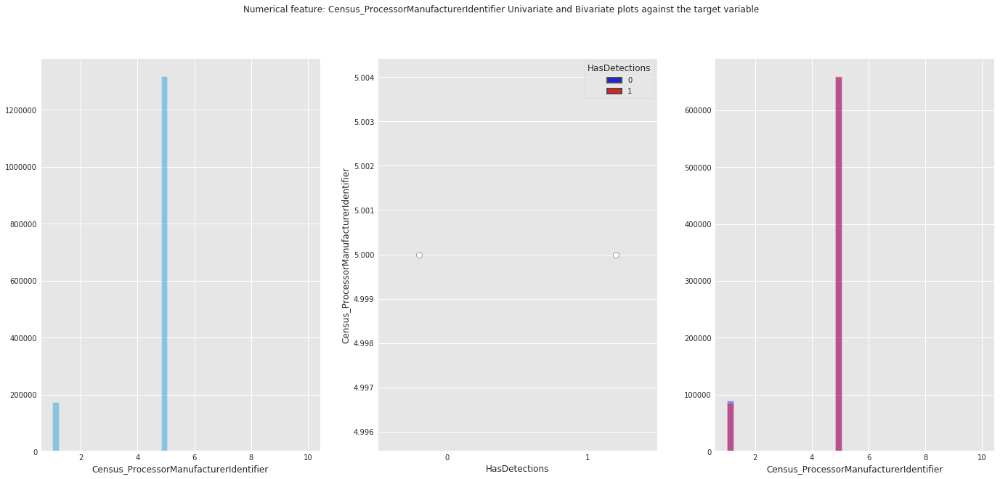

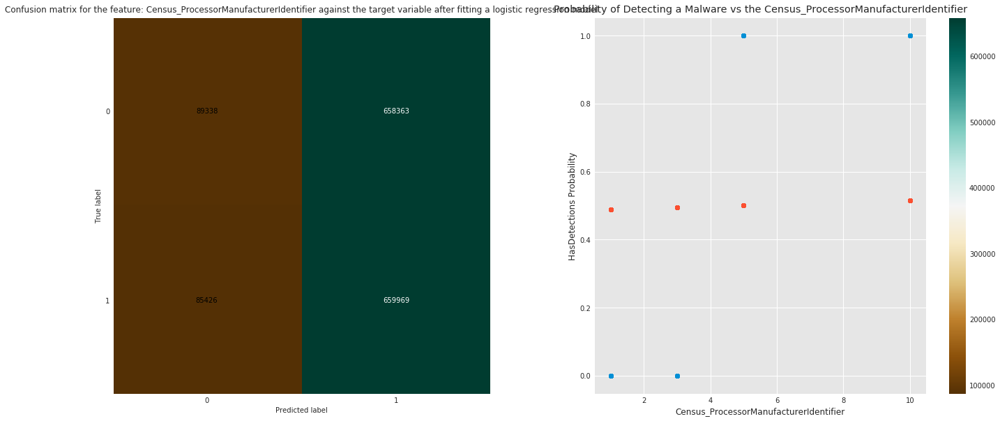

In [73]:
numerical_univariate_and_bivariate_plot("Census_ProcessorManufacturerIdentifier")
logistic_fit("Census_ProcessorManufacturerIdentifier")

Top 10 Values counts for the numerical feature Census_ProcessorModelIdentifier
2696.0    48766
1998.0    44895
2660.0    32939
2372.0    29572
1992.0    28968
2382.0    28558
2640.0    25553
2524.0    23997
1985.0    22871
2096.0    22733
Name: Census_ProcessorModelIdentifier, dtype: int64
Min value 3.0
Max value 4470.0
NaN values 6910
Number of unique values 2060
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature Census_ProcessorModelIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.52      0.49      0.51    747698
           1       0.52      0.55      0.53    745392

   micro avg       0.52      0.52      0.52   1493090
   macro avg       0.52      0.52      0.52   1493090
weighted avg       0.52      0.52      0.52   1493090


accuracy score: 0.5208902343462216
F1 score: 0.5208902343462216


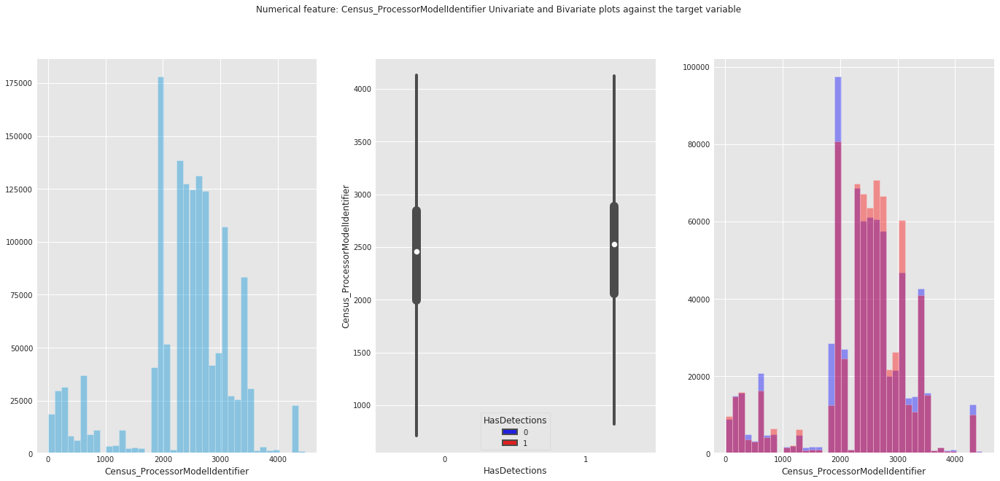

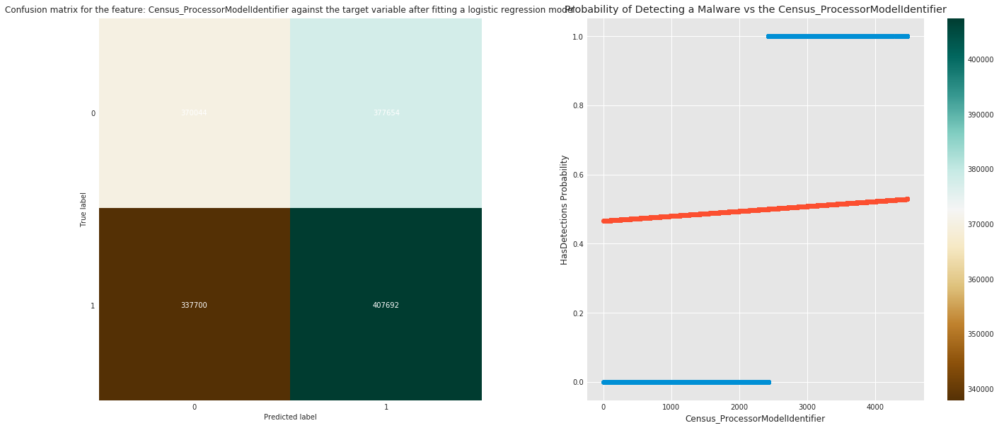

In [74]:
numerical_univariate_and_bivariate_plot("Census_ProcessorModelIdentifier")
logistic_fit("Census_ProcessorModelIdentifier")

Top 10 Values counts for the numerical feature Census_PrimaryDiskTotalCapacity
476940.0    477360
953869.0    365290
305245.0     79943
122104.0     78915
244198.0     75822
238475.0     52593
29820.0      51272
114473.0     43611
715404.0     41569
228936.0     26773
Name: Census_PrimaryDiskTotalCapacity, dtype: int64
Min value 0.0
Max value 47687668.0
NaN values 8855
Number of unique values 2037
Mean value 514555.125
Variance value 131366494208.0

Fitting a logistic regression model for the feature Census_PrimaryDiskTotalCapacity against the target variable
              precision    recall  f1-score   support

           0       0.00      0.00      0.00    746591
           1       0.50      1.00      0.67    744554

   micro avg       0.50      0.50      0.50   1491145
   macro avg       0.25      0.50      0.33   1491145
weighted avg       0.25      0.50      0.33   1491145


accuracy score: 0.49931629720785037
F1 score: 0.49931629720785037


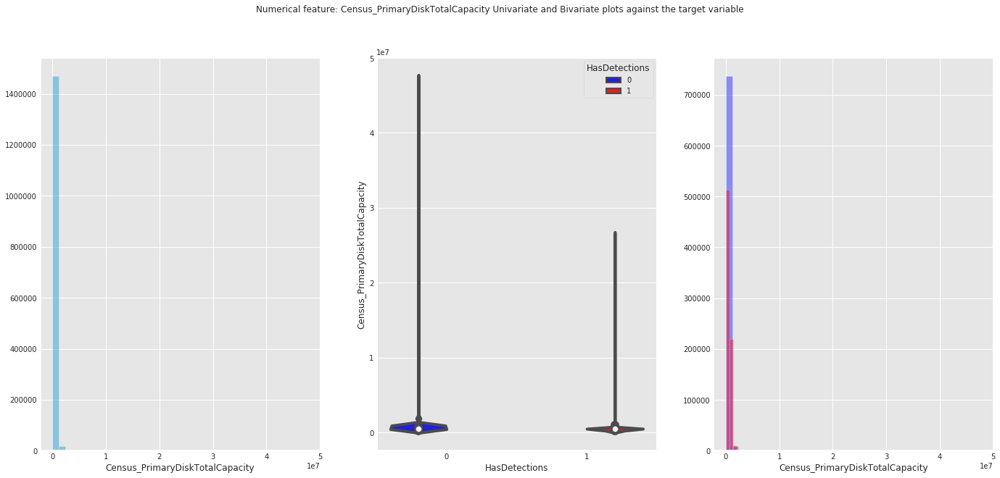

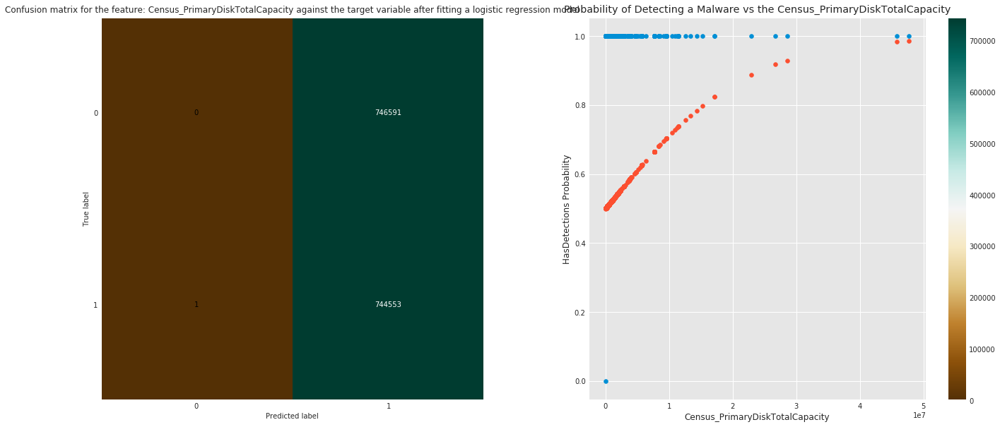

In [75]:
numerical_univariate_and_bivariate_plot("Census_PrimaryDiskTotalCapacity")
logistic_fit("Census_PrimaryDiskTotalCapacity")

Top 10 Values counts for the numerical feature Census_SystemVolumeTotalCapacity
28542.0     8745
926992.0    8582
476389.0    7509
476324.0    6944
102400.0    6900
953253.0    6885
952728.0    6363
476323.0    5926
475799.0    5729
952727.0    5633
Name: Census_SystemVolumeTotalCapacity, dtype: int64
Min value 0.0
Max value 47687100.0
NaN values 8852
Number of unique values 264091
Mean value 378030.46875
Variance value 108509814784.0

Fitting a logistic regression model for the feature Census_SystemVolumeTotalCapacity against the target variable
              precision    recall  f1-score   support

           0       0.00      0.00      0.00    746591
           1       0.50      1.00      0.67    744557

   micro avg       0.50      0.50      0.50   1491148
   macro avg       0.25      0.50      0.33   1491148
weighted avg       0.25      0.50      0.33   1491148


accuracy score: 0.4993166338954953
F1 score: 0.4993166338954953


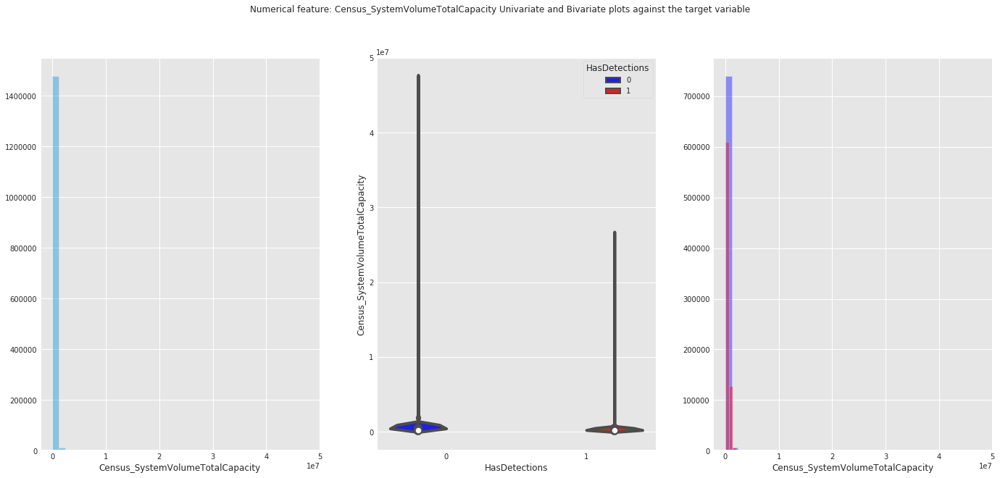

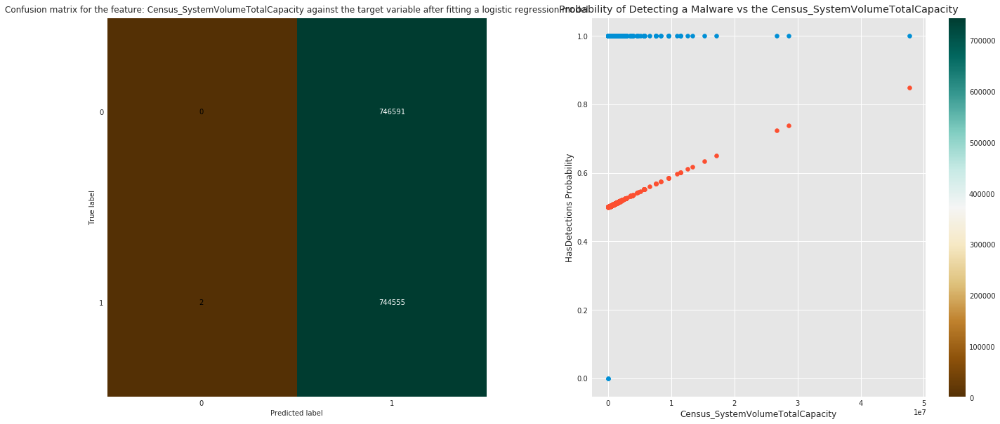

In [76]:
numerical_univariate_and_bivariate_plot("Census_SystemVolumeTotalCapacity")
logistic_fit("Census_SystemVolumeTotalCapacity")

In [77]:
numerical_univariate_and_bivariate_plot("Census_HasOpticalDiskDrive")
logistic_fit("Census_HasOpticalDiskDrive")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature Census_TotalPhysicalRAM
4096.0     687143
8192.0     368782
2048.0     185521
16384.0     89829
6144.0      67046
12288.0     27088
3072.0      25727
1024.0      11081
32768.0      9703
24576.0      2033
Name: Census_TotalPhysicalRAM, dtype: int64
Min value 255.0
Max value 786432.0
NaN values 13589
Number of unique values 1198
Mean value 6116.8349609375
Variance value 25469450.0

Fitting a logistic regression model for the feature Census_TotalPhysicalRAM against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00    743533
           1       0.50      1.00      0.67    742878

   micro avg       0.50      0.50      0.50   1486411
   macro avg       0.25      0.50      0.33   1486411
weighted avg       0.25      0.50      0.33   1486411


accuracy score: 0.4997796706294558
F1 score: 0.4997796706294558


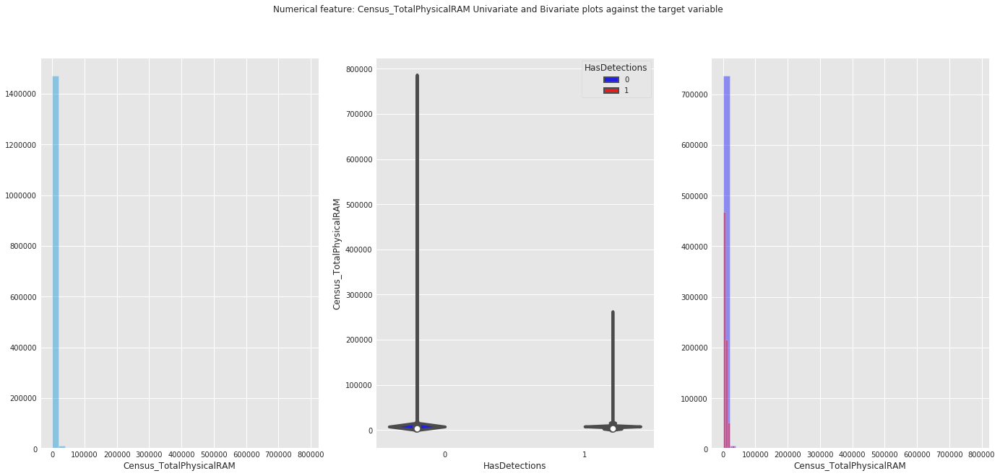

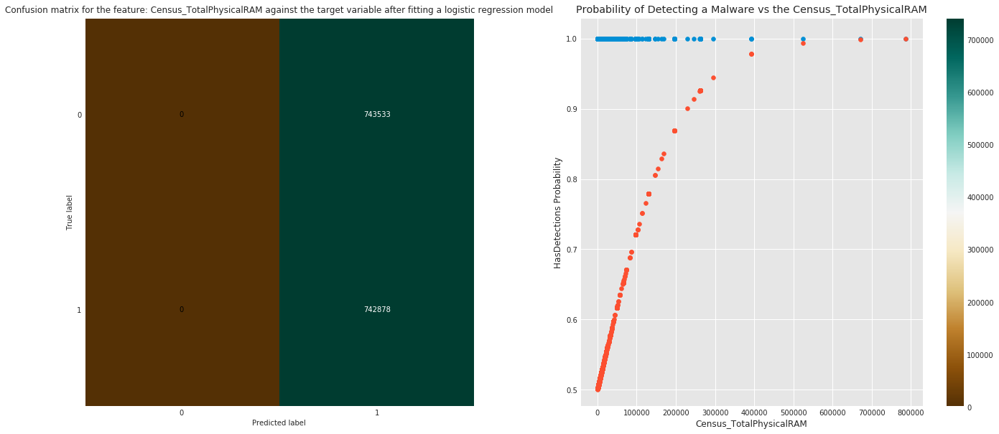

In [78]:
numerical_univariate_and_bivariate_plot("Census_TotalPhysicalRAM")
logistic_fit("Census_TotalPhysicalRAM")

Top 10 Values counts for the numerical feature Census_InternalPrimaryDiagonalDisplaySizeInInches
15.500000    512184
13.898438    160098
14.000000     91520
11.601562     53454
21.500000     46313
13.296875     41072
18.500000     35638
13.203125     34467
23.000000     32083
15.601562     30429
Name: Census_InternalPrimaryDiagonalDisplaySizeInInches, dtype: int64
Min value 3.0
Max value 173.5
NaN values 7895
Number of unique values 626
Mean value nan
Variance value 0.0

Fitting a logistic regression model for the feature Census_InternalPrimaryDiagonalDisplaySizeInInches against the target variable
              precision    recall  f1-score   support

           0       0.51      0.73      0.60    746935
           1       0.52      0.29      0.37    745170

   micro avg       0.51      0.51      0.51   1492105
   macro avg       0.52      0.51      0.49   1492105
weighted avg       0.52      0.51      0.49   1492105


accuracy score: 0.5135757872267702
F1 score: 0.5135757872267702


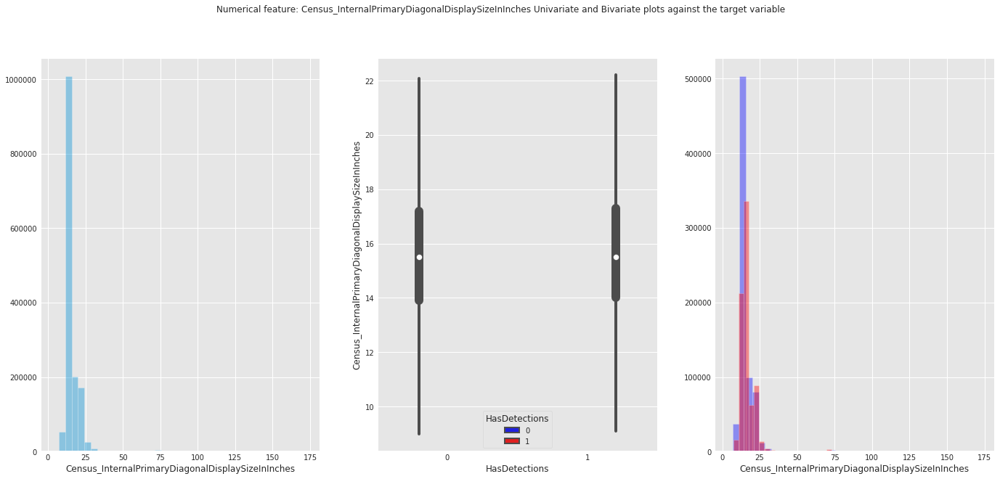

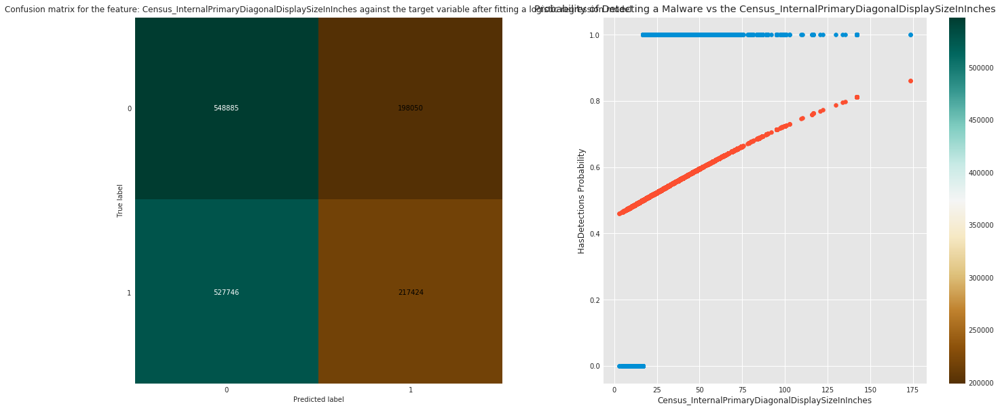

In [79]:
numerical_univariate_and_bivariate_plot("Census_InternalPrimaryDiagonalDisplaySizeInInches")
logistic_fit("Census_InternalPrimaryDiagonalDisplaySizeInInches")

Top 10 Values counts for the numerical feature Census_InternalPrimaryDisplayResolutionHorizontal
1366.0    757727
1920.0    373921
1280.0     89070
1600.0     84531
1024.0     57709
1440.0     28150
1360.0     21221
1680.0     18645
2560.0     11922
2736.0      9690
Name: Census_InternalPrimaryDisplayResolutionHorizontal, dtype: int64
Min value -1.0
Max value 11520.0
NaN values 7876
Number of unique values 970
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature Census_InternalPrimaryDisplayResolutionHorizontal against the target variable
              precision    recall  f1-score   support

           0       0.51      0.66      0.58    746949
           1       0.52      0.37      0.43    745175

   micro avg       0.52      0.52      0.52   1492124
   macro avg       0.52      0.52      0.50   1492124
weighted avg       0.52      0.52      0.50   1492124


accuracy score: 0.5158096780160362
F1 score: 0.5158096780160362


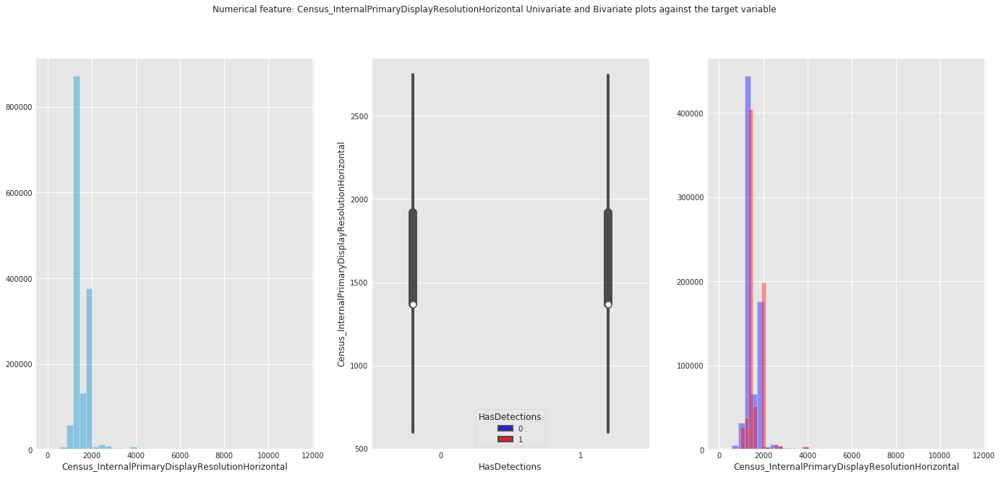

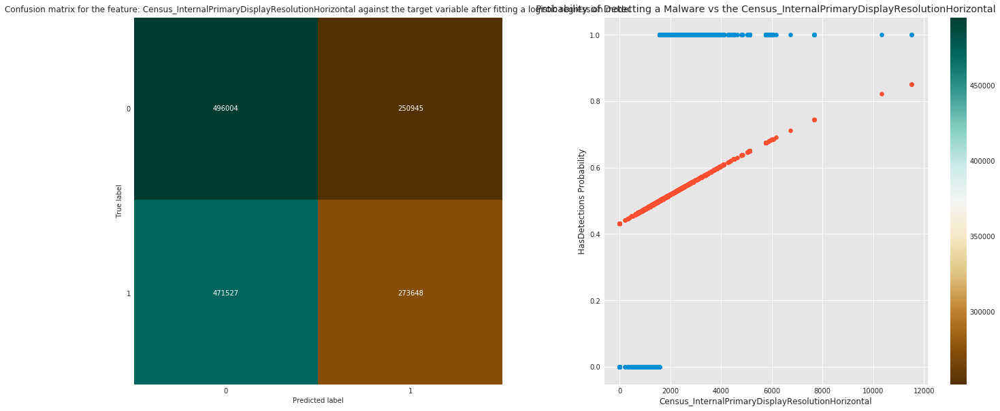

In [80]:
numerical_univariate_and_bivariate_plot("Census_InternalPrimaryDisplayResolutionHorizontal")
logistic_fit("Census_InternalPrimaryDisplayResolutionHorizontal")

Top 10 Values counts for the numerical feature Census_InternalPrimaryDisplayResolutionVertical
768.0     834595
1080.0    361802
900.0     110440
800.0      44222
1024.0     31567
1050.0     19096
1440.0     13637
1200.0     13261
600.0      10763
1824.0      9686
Name: Census_InternalPrimaryDisplayResolutionVertical, dtype: int64
Min value -1.0
Max value 5760.0
NaN values 7876
Number of unique values 875
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature Census_InternalPrimaryDisplayResolutionVertical against the target variable
              precision    recall  f1-score   support

           0       0.71      0.00      0.00    746949
           1       0.50      1.00      0.67    745175

   micro avg       0.50      0.50      0.50   1492124
   macro avg       0.61      0.50      0.33   1492124
weighted avg       0.61      0.50      0.33   1492124


accuracy score: 0.49941157705391775
F1 score: 0.49941157705391775


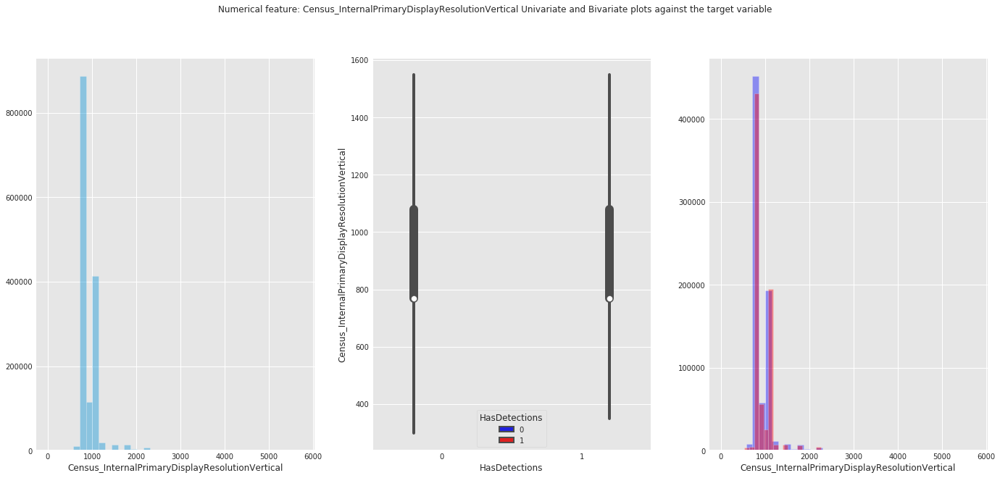

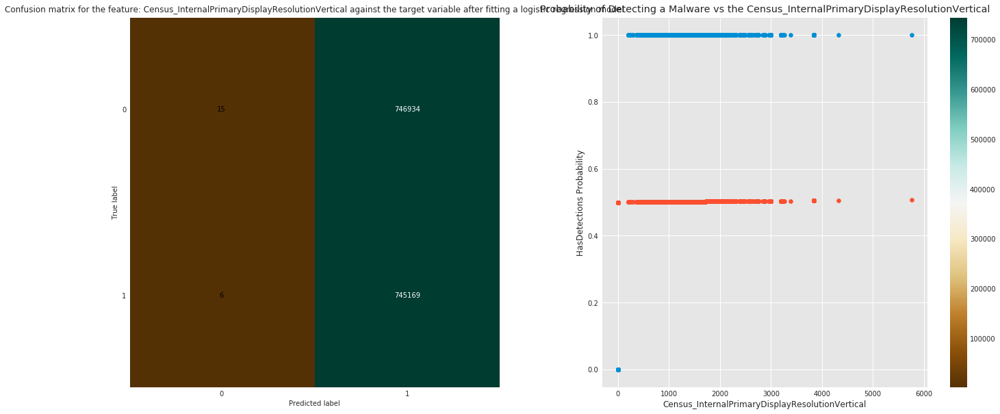

In [81]:
numerical_univariate_and_bivariate_plot("Census_InternalPrimaryDisplayResolutionVertical")
logistic_fit("Census_InternalPrimaryDisplayResolutionVertical")

Top 10 Values counts for the numerical feature Census_InternalBatteryNumberOfCharges
0.000000e+00    849964
4.294967e+09    380040
1.000000e+00      8976
2.000000e+00      4725
1.600000e+01      4685
3.000000e+00      3706
3.300000e+01      3333
4.000000e+00      3050
5.000000e+00      2759
6.000000e+00      2470
Name: Census_InternalBatteryNumberOfCharges, dtype: int64
Min value 0.0
Max value 4294967300.0
NaN values 45209
Number of unique values 12235
Mean value 1121988864.0
Variance value 3.522011171429286e+18

Fitting a logistic regression model for the feature Census_InternalBatteryNumberOfCharges against the target variable
              precision    recall  f1-score   support

           0       0.50      0.59      0.54    729798
           1       0.50      0.42      0.46    724993

   micro avg       0.50      0.50      0.50   1454791
   macro avg       0.50      0.50      0.50   1454791
weighted avg       0.50      0.50      0.50   1454791


accuracy score: 0.5021896616077498


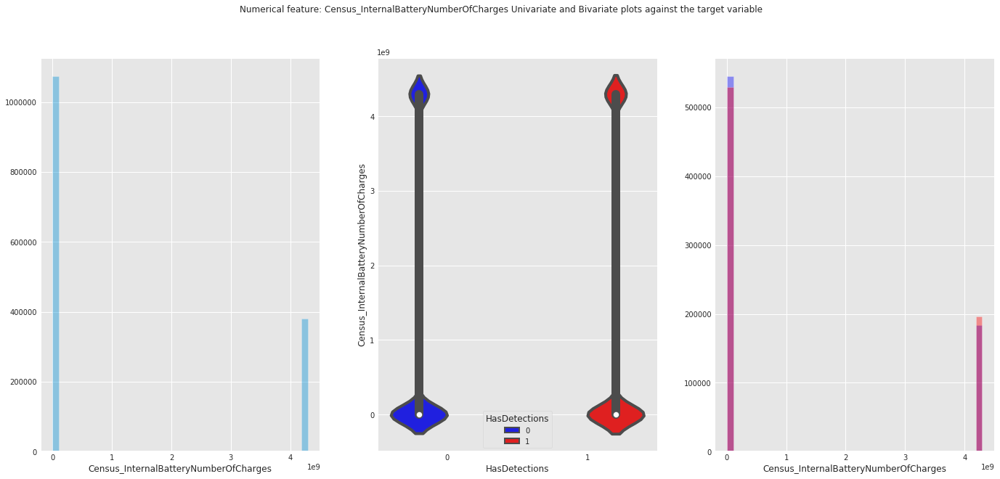

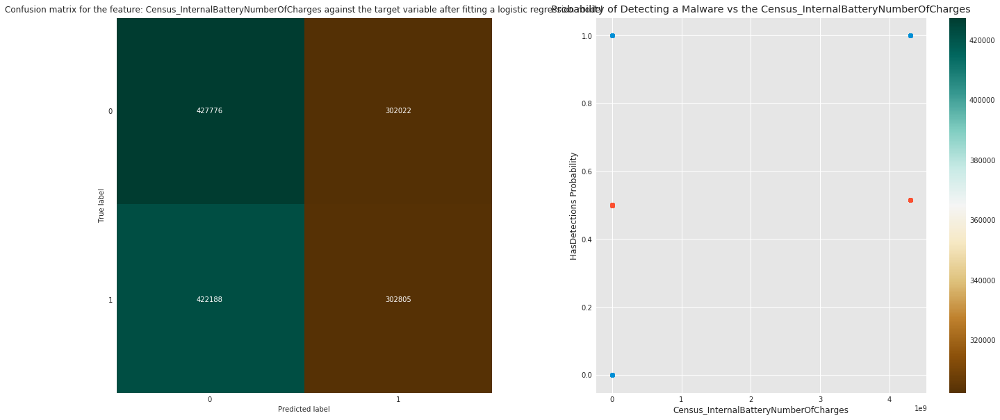

In [82]:
numerical_univariate_and_bivariate_plot("Census_InternalBatteryNumberOfCharges")
logistic_fit("Census_InternalBatteryNumberOfCharges")

Top 10 Values counts for the numerical feature Census_OSBuildNumber
17134    675003
16299    410957
15063    133371
14393    131195
10586    100187
10240     45650
17692       501
17738       476
17744       427
17758       297
Name: Census_OSBuildNumber, dtype: int64
Min value 7601
Max value 18242
NaN values 0
Number of unique values 91
Mean value 15835.530148666667
Variance value 3855006.174988507

Fitting a logistic regression model for the feature Census_OSBuildNumber against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00    750796
           1       0.50      1.00      0.67    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.25      0.50      0.33   1500000
weighted avg       0.25      0.50      0.33   1500000


accuracy score: 0.4994693333333333
F1 score: 0.4994693333333333


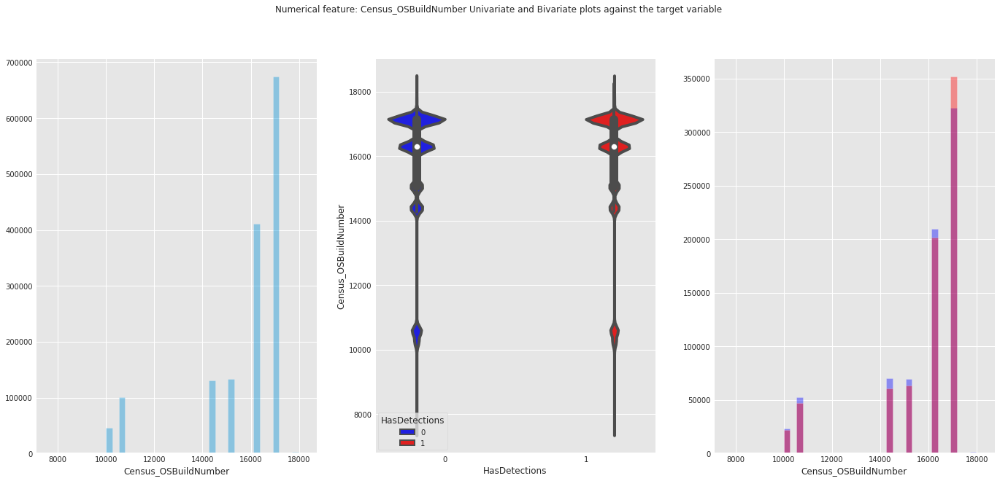

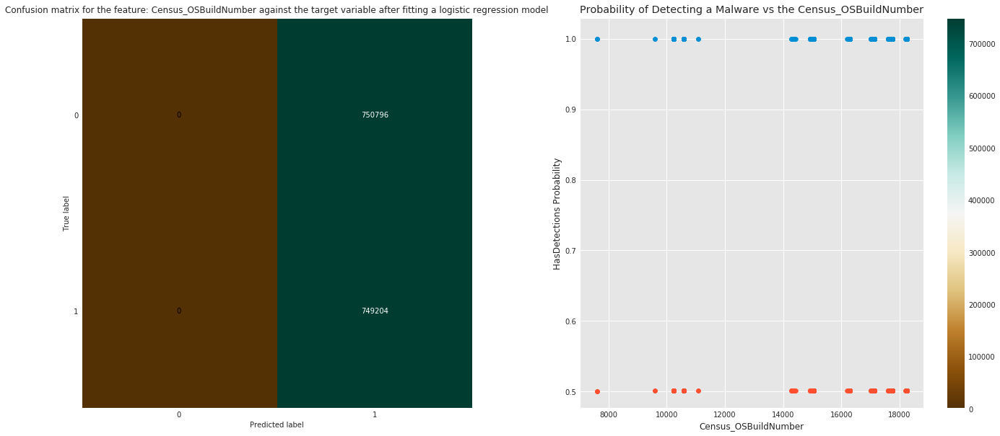

In [83]:
numerical_univariate_and_bivariate_plot("Census_OSBuildNumber")
logistic_fit("Census_OSBuildNumber")

Top 10 Values counts for the numerical feature Census_OSBuildRevision
228     238058
165     151380
431      92192
285      78968
112      58447
547      57707
371      54556
191      38583
2189     37295
611      36764
Name: Census_OSBuildRevision, dtype: int64
Min value 0
Max value 24241
NaN values 0
Number of unique values 251
Mean value 971.632698
Variance value 8593348.625877963

Fitting a logistic regression model for the feature Census_OSBuildRevision against the target variable
              precision    recall  f1-score   support

           0       0.50      0.98      0.66    750796
           1       0.51      0.02      0.04    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.51      0.50      0.35   1500000
weighted avg       0.51      0.50      0.35   1500000


accuracy score: 0.5010033333333334
F1 score: 0.5010033333333334


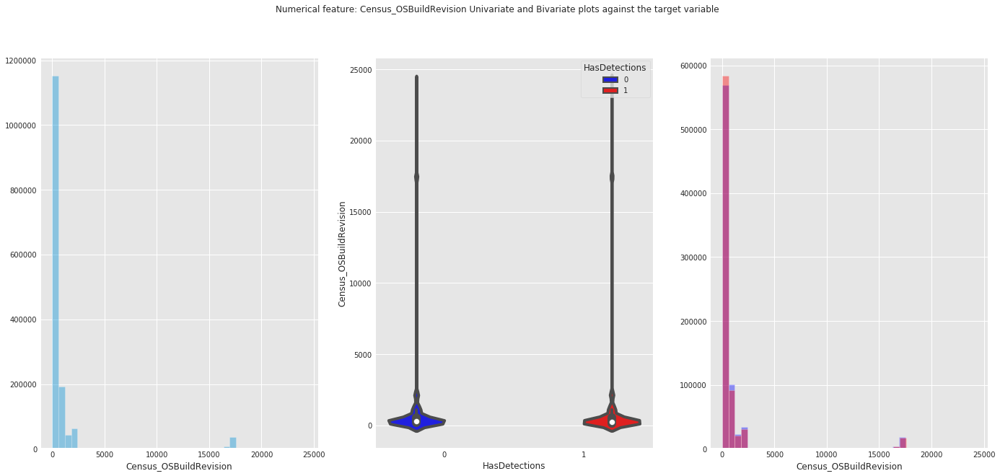

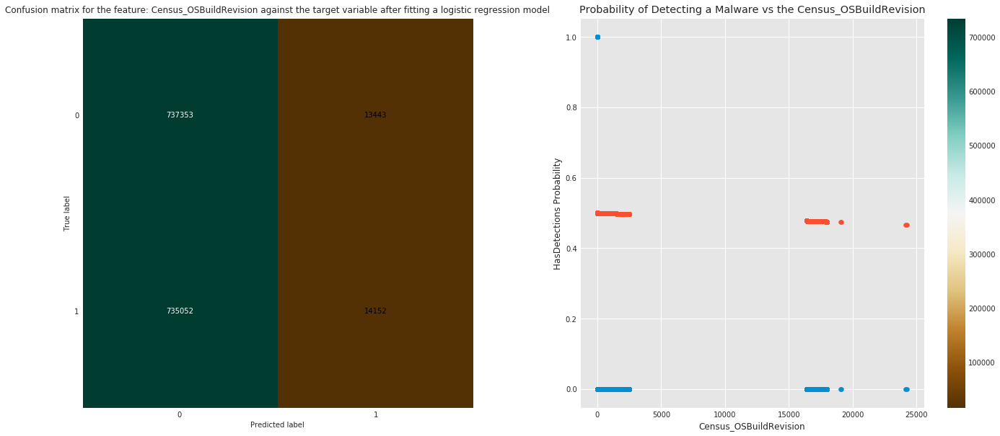

In [84]:
numerical_univariate_and_bivariate_plot("Census_OSBuildRevision")
logistic_fit("Census_OSBuildRevision")

Top 10 Values counts for the numerical feature Census_OSInstallLanguageIdentifier
8.0     534757
9.0     173843
7.0      86241
29.0     82719
14.0     72901
37.0     67593
10.0     61416
26.0     56048
5.0      42452
35.0     34426
Name: Census_OSInstallLanguageIdentifier, dtype: int64
Min value 1.0
Max value 39.0
NaN values 10026
Number of unique values 39
Mean value nan
Variance value 0.0

Fitting a logistic regression model for the feature Census_OSInstallLanguageIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.50      0.73      0.59    745866
           1       0.50      0.27      0.35    744108

   micro avg       0.50      0.50      0.50   1489974
   macro avg       0.50      0.50      0.47   1489974
weighted avg       0.50      0.50      0.47   1489974


accuracy score: 0.5000053692212079
F1 score: 0.5000053692212079


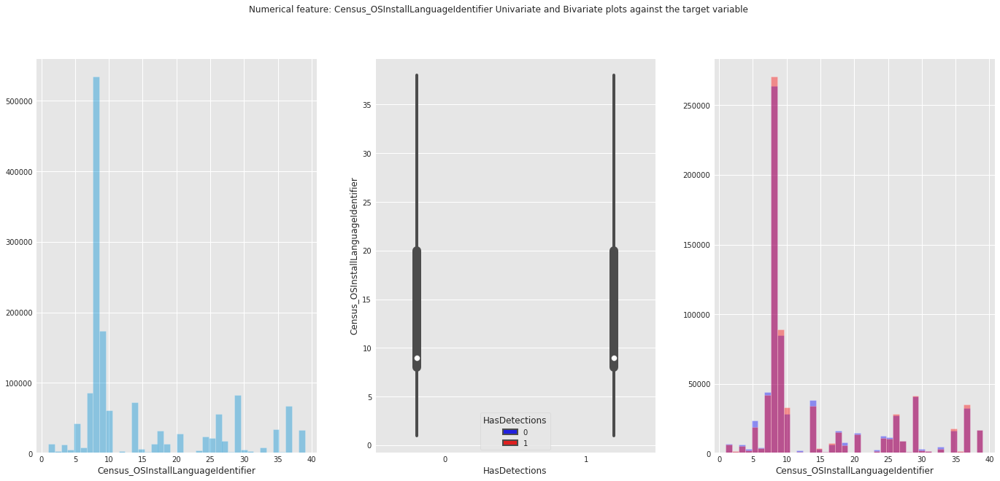

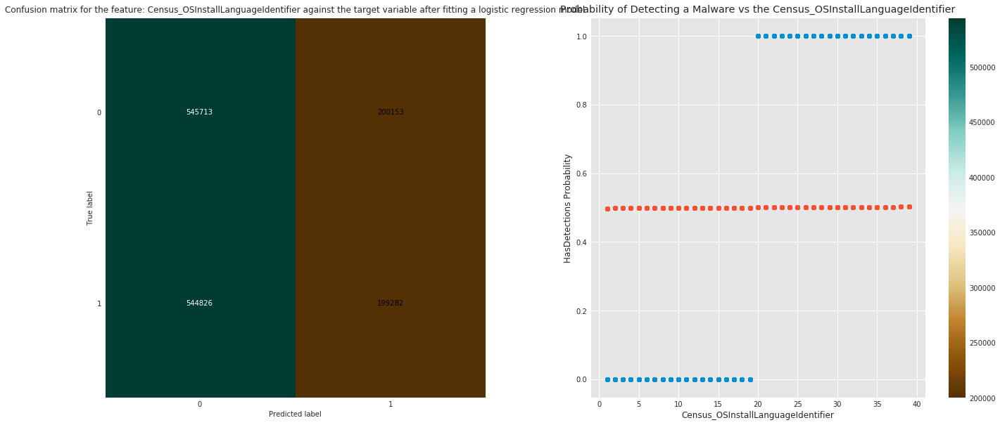

In [85]:
numerical_univariate_and_bivariate_plot("Census_OSInstallLanguageIdentifier")
logistic_fit("Census_OSInstallLanguageIdentifier")

Top 10 Values counts for the numerical feature Census_OSUILocaleIdentifier
31     533335
34     174801
30      86398
125     83764
49      73634
158     68378
35      63237
119     56570
26      42459
148     34753
Name: Census_OSUILocaleIdentifier, dtype: int64
Min value 1
Max value 162
NaN values 0
Number of unique values 107
Mean value 60.44068
Variance value 2022.770280317785

Fitting a logistic regression model for the feature Census_OSUILocaleIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.50      0.75      0.60    750796
           1       0.50      0.25      0.33    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.50      0.50      0.47   1500000
weighted avg       0.50      0.50      0.47   1500000


accuracy score: 0.5008
F1 score: 0.5008


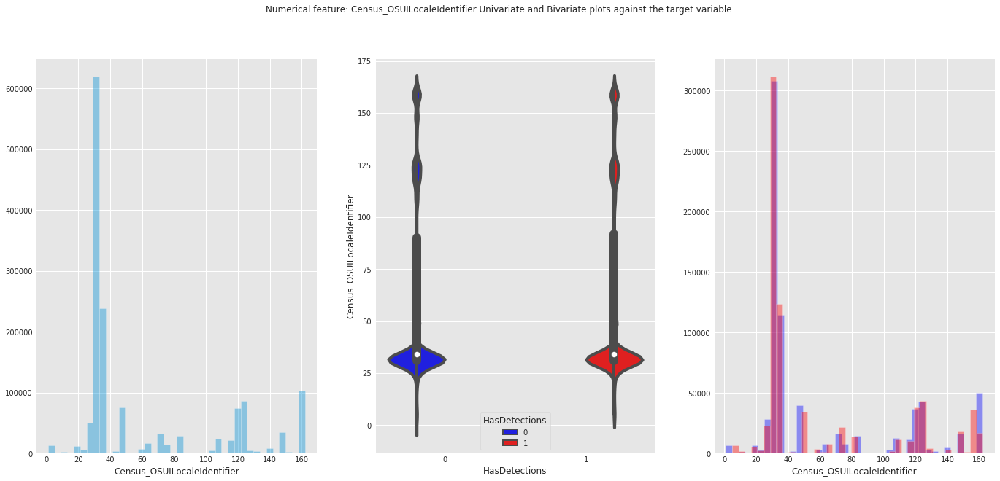

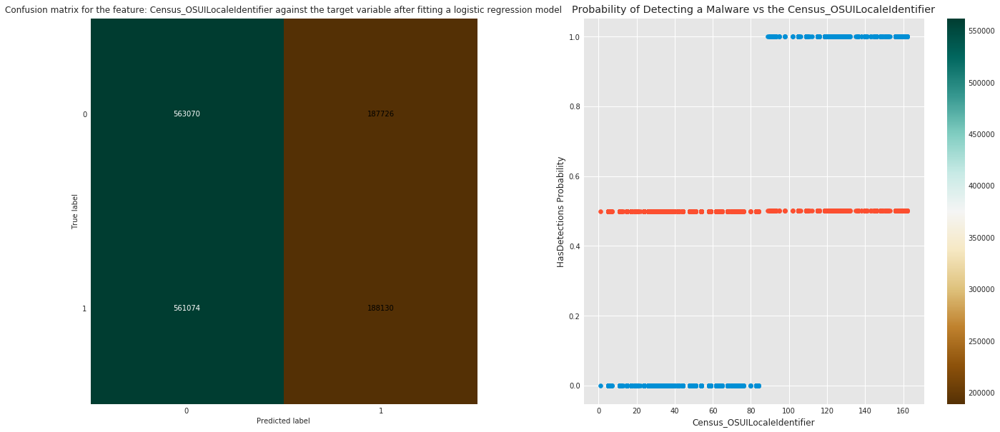

In [86]:
numerical_univariate_and_bivariate_plot("Census_OSUILocaleIdentifier")
logistic_fit("Census_OSUILocaleIdentifier")

In [87]:
numerical_univariate_and_bivariate_plot("Census_IsPortableOperatingSystem")
logistic_fit("Census_IsPortableOperatingSystem")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature Census_IsFlightingInternal
0.0    254369
1.0         4
Name: Census_IsFlightingInternal, dtype: int64
Min value 0.0
Max value 1.0
NaN values 1245627
Number of unique values 2

Fitting a logistic regression model for the feature Census_IsFlightingInternal against the target variable
              precision    recall  f1-score   support

           0       0.51      1.00      0.68    130942
           1       0.75      0.00      0.00    123431

   micro avg       0.51      0.51      0.51    254373
   macro avg       0.63      0.50      0.34    254373
weighted avg       0.63      0.51      0.35    254373


accuracy score: 0.51477161491196
F1 score: 0.51477161491196


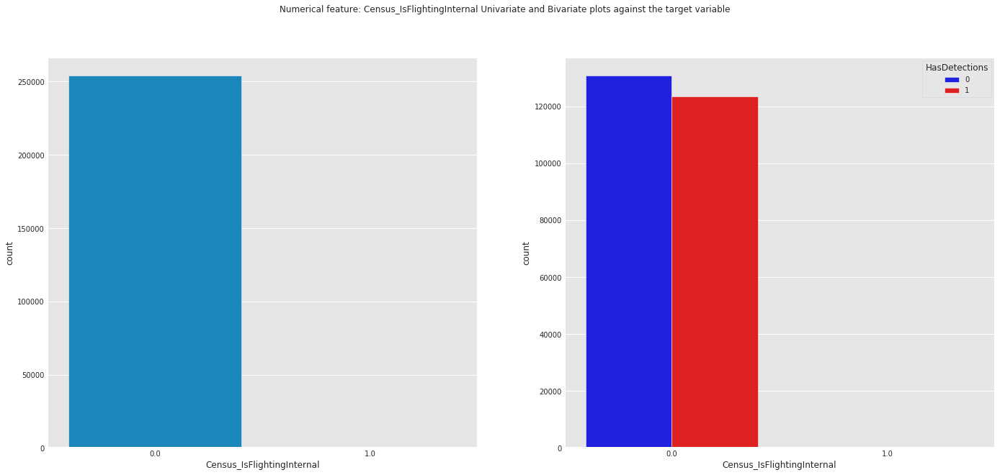

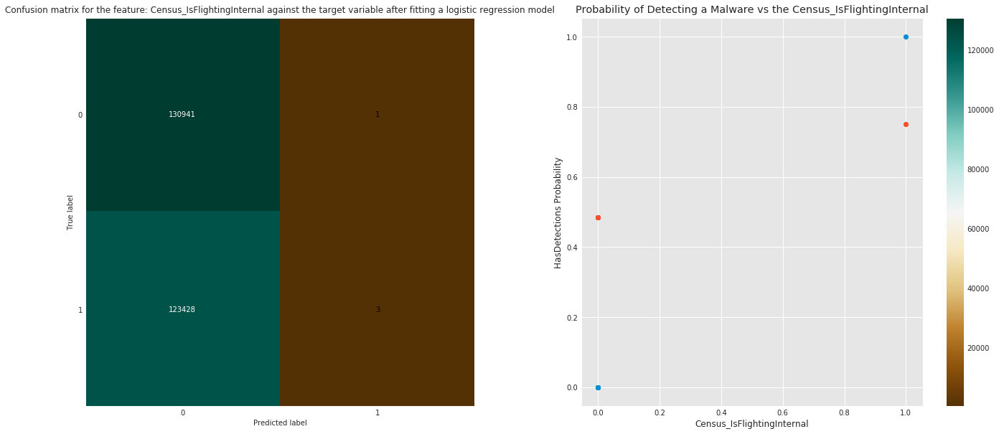

In [88]:
numerical_univariate_and_bivariate_plot("Census_IsFlightingInternal")
logistic_fit("Census_IsFlightingInternal")

In [89]:
numerical_univariate_and_bivariate_plot("Census_IsFlightsDisabled")
logistic_fit("Census_IsFlightsDisabled")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature Census_ThresholdOptIn
0.0    546881
1.0       128
Name: Census_ThresholdOptIn, dtype: int64
Min value 0.0
Max value 1.0
NaN values 952991
Number of unique values 2

Fitting a logistic regression model for the feature Census_ThresholdOptIn against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.51      1.00      0.67    278470
           1       0.00      0.00      0.00    268539

   micro avg       0.51      0.51      0.51    547009
   macro avg       0.25      0.50      0.34    547009
weighted avg       0.26      0.51      0.34    547009


accuracy score: 0.5090775471701563
F1 score: 0.5090775471701563


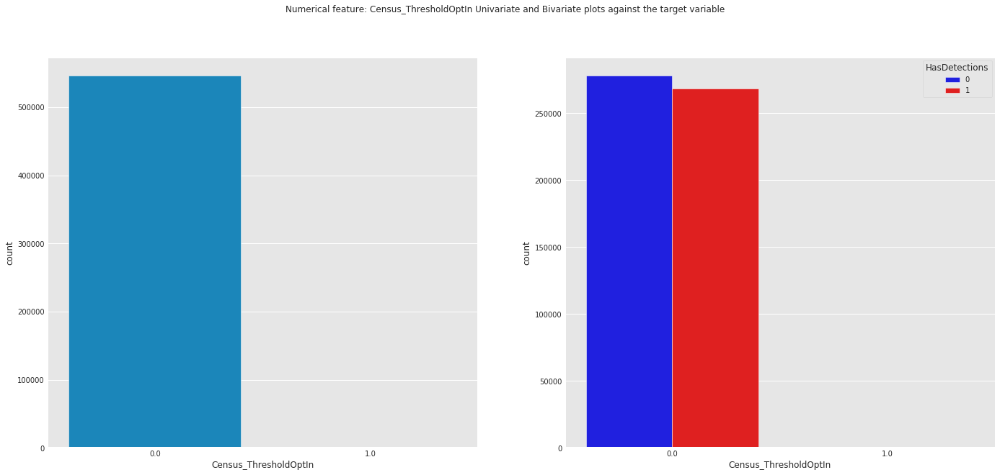

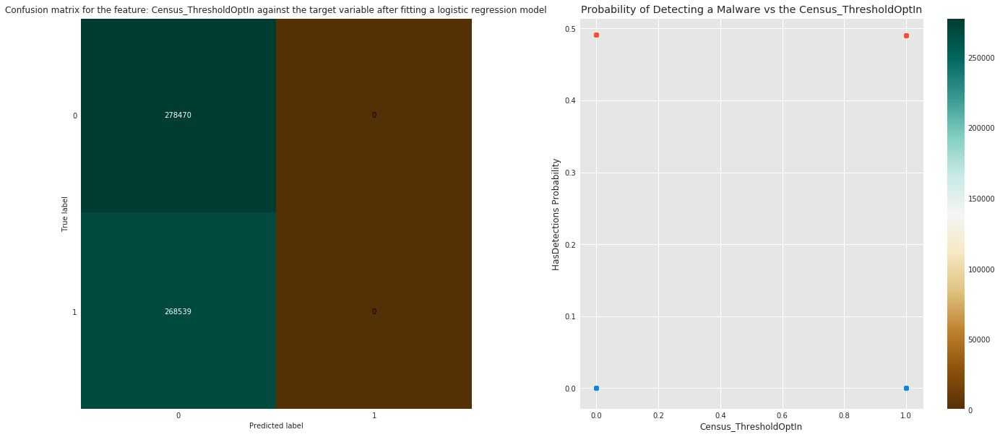

In [90]:
numerical_univariate_and_bivariate_plot("Census_ThresholdOptIn")
logistic_fit("Census_ThresholdOptIn")

Top 10 Values counts for the numerical feature Census_FirmwareManufacturerIdentifier
142.0    453892
628.0    206568
554.0    197203
355.0    158236
556.0    134427
500.0     65246
93.0      31998
807.0     26348
513.0     23994
127.0     20719
Name: Census_FirmwareManufacturerIdentifier, dtype: int64
Min value 9.0
Max value 1084.0
NaN values 30918
Number of unique values 439
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature Census_FirmwareManufacturerIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.54      0.52    732932
           1       0.51      0.48      0.50    736150

   micro avg       0.51      0.51      0.51   1469082
   macro avg       0.51      0.51      0.51   1469082
weighted avg       0.51      0.51      0.51   1469082


accuracy score: 0.5117474722309578
F1 score: 0.5117474722309578


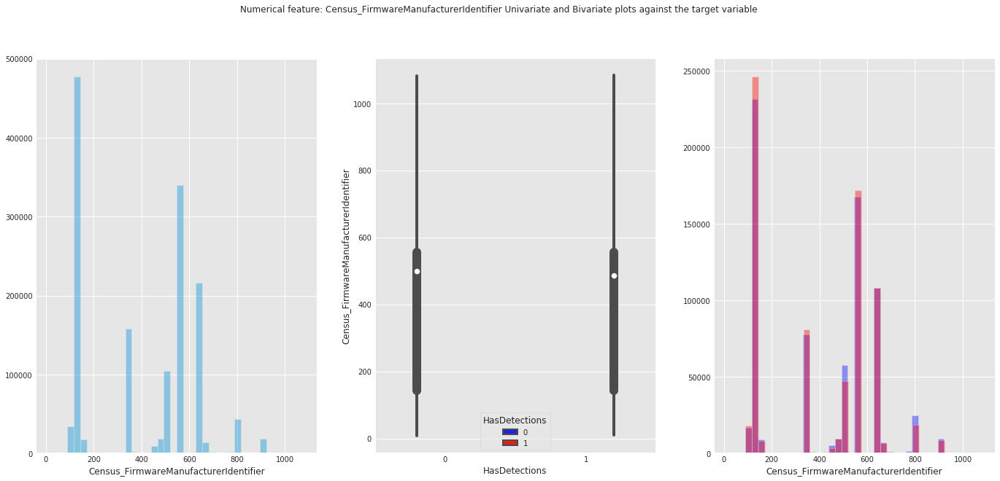

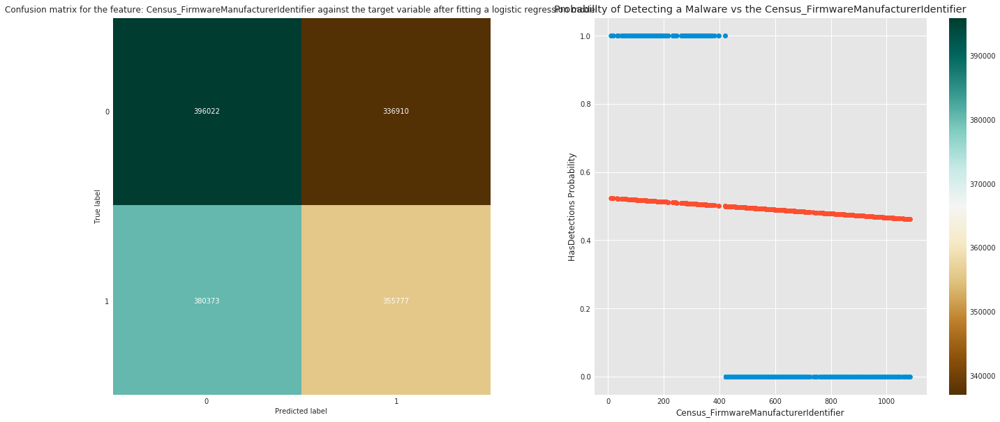

In [91]:
numerical_univariate_and_bivariate_plot("Census_FirmwareManufacturerIdentifier")
logistic_fit("Census_FirmwareManufacturerIdentifier")

Top 10 Values counts for the numerical feature Census_FirmwareManufacturerIdentifier
142.0    453892
628.0    206568
554.0    197203
355.0    158236
556.0    134427
500.0     65246
93.0      31998
807.0     26348
513.0     23994
127.0     20719
Name: Census_FirmwareManufacturerIdentifier, dtype: int64
Min value 9.0
Max value 1084.0
NaN values 30918
Number of unique values 439
Mean value nan
Variance value nan

Fitting a logistic regression model for the feature Census_FirmwareManufacturerIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.54      0.52    732932
           1       0.51      0.48      0.50    736150

   micro avg       0.51      0.51      0.51   1469082
   macro avg       0.51      0.51      0.51   1469082
weighted avg       0.51      0.51      0.51   1469082


accuracy score: 0.5117474722309578
F1 score: 0.5117474722309578


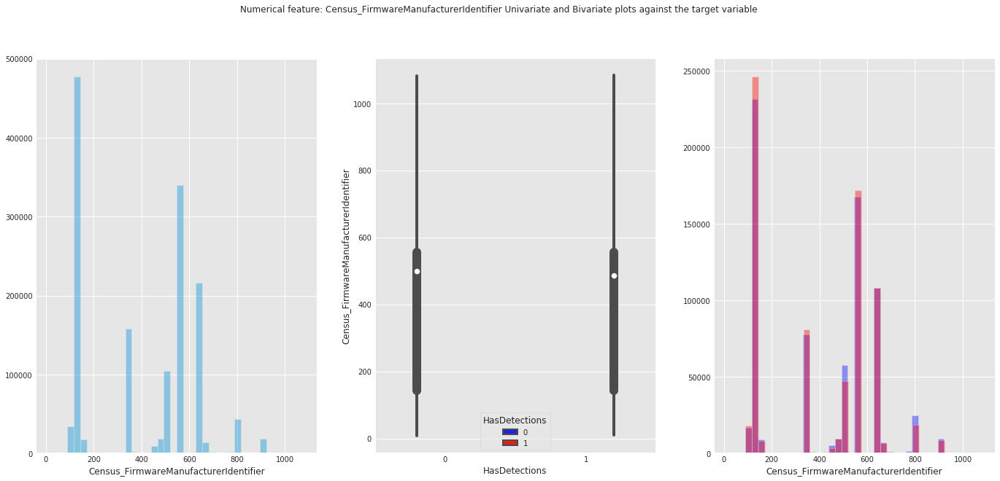

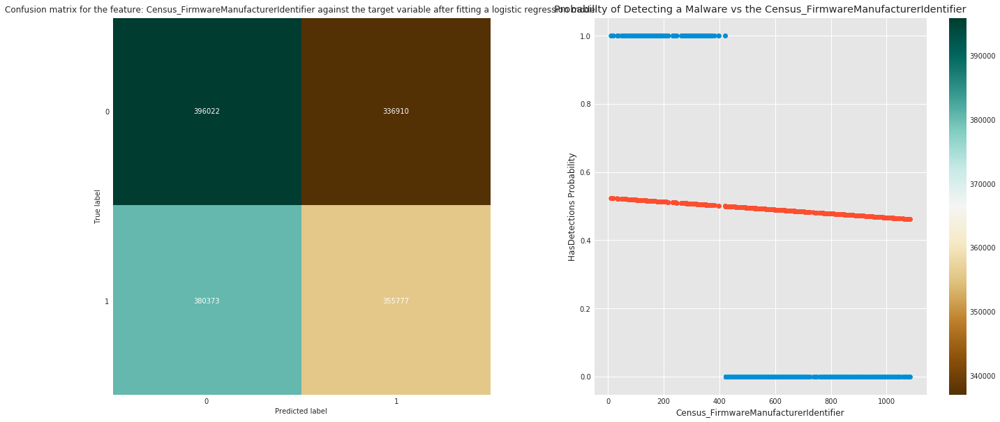

In [92]:
numerical_univariate_and_bivariate_plot("Census_FirmwareManufacturerIdentifier")
logistic_fit("Census_FirmwareManufacturerIdentifier")

Top 10 Values counts for the numerical feature Census_FirmwareVersionIdentifier
33105.0    15011
33111.0    10275
33054.0     9451
33108.0     9357
63175.0     8977
11778.0     8974
33115.0     8449
63155.0     8275
33060.0     8106
19970.0     7796
Name: Census_FirmwareVersionIdentifier, dtype: int64
Min value 5.0
Max value 72102.0
NaN values 26995
Number of unique values 32761
Mean value 33014.046875
Variance value 450429472.0

Fitting a logistic regression model for the feature Census_FirmwareVersionIdentifier against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00    735269
           1       0.50      1.00      0.67    737736

   micro avg       0.50      0.50      0.50   1473005
   macro avg       0.25      0.50      0.33   1473005
weighted avg       0.25      0.50      0.33   1473005


accuracy score: 0.5008374038105777
F1 score: 0.5008374038105777


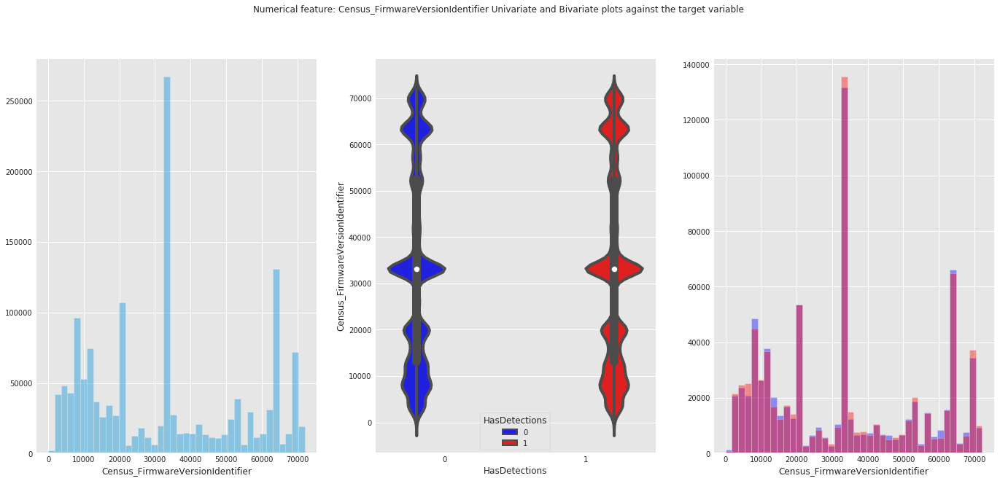

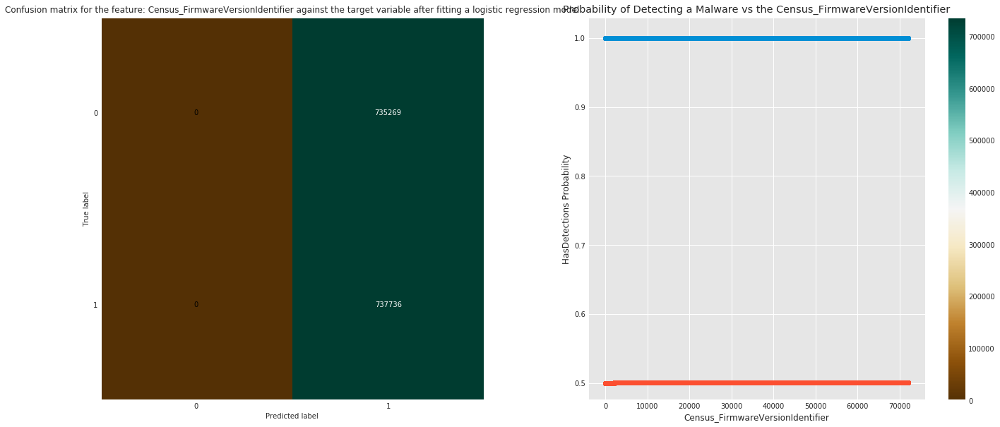

In [93]:
numerical_univariate_and_bivariate_plot("Census_FirmwareVersionIdentifier")
logistic_fit("Census_FirmwareVersionIdentifier")

Top 10 Values counts for the numerical feature Census_IsSecureBootEnabled
0    771298
1    728702
Name: Census_IsSecureBootEnabled, dtype: int64
Min value 0
Max value 1
NaN values 0
Number of unique values 2

Fitting a logistic regression model for the feature Census_IsSecureBootEnabled against the target variable
              precision    recall  f1-score   support

           0       0.50      0.49      0.49    750796
           1       0.50      0.52      0.51    749204

   micro avg       0.50      0.50      0.50   1500000
   macro avg       0.50      0.50      0.50   1500000
weighted avg       0.50      0.50      0.50   1500000


accuracy score: 0.5010653333333334
F1 score: 0.5010653333333334


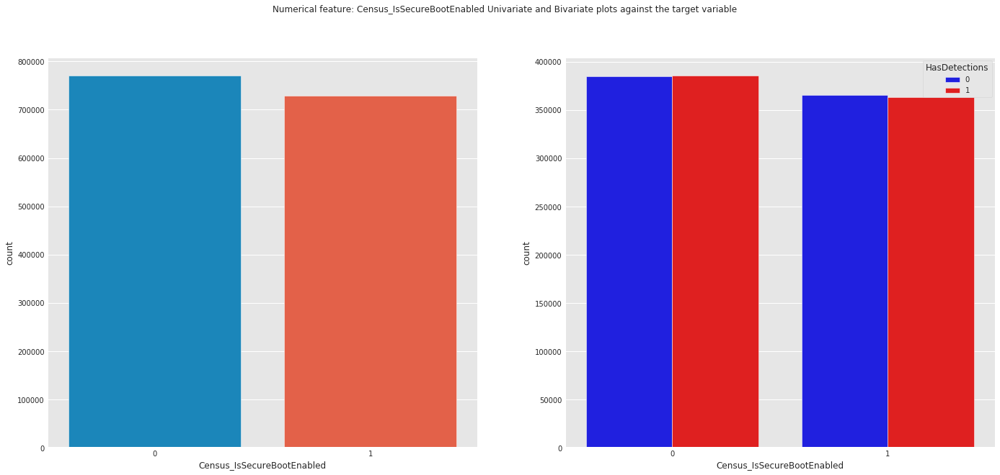

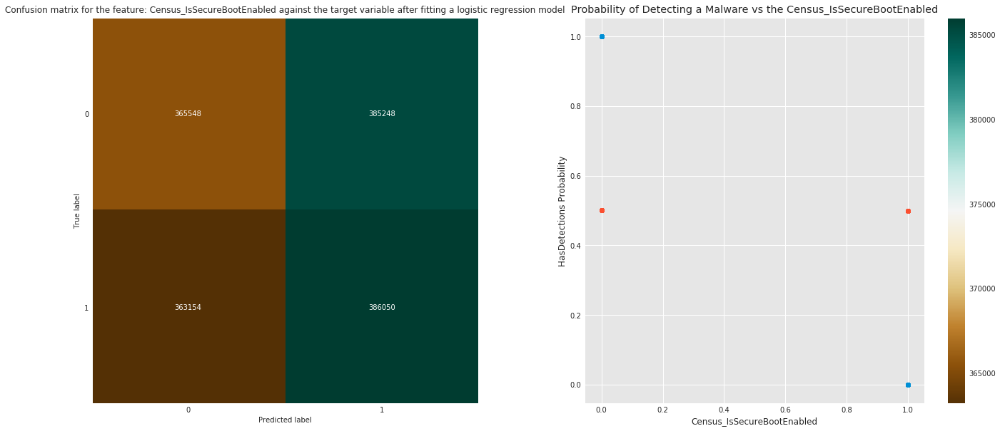

In [94]:
numerical_univariate_and_bivariate_plot("Census_IsSecureBootEnabled")
logistic_fit("Census_IsSecureBootEnabled")

Top 10 Values counts for the numerical feature Census_IsWIMBootEnabled
0.0    548306
1.0         1
Name: Census_IsWIMBootEnabled, dtype: int64
Min value 0.0
Max value 1.0
NaN values 951693
Number of unique values 2

Fitting a logistic regression model for the feature Census_IsWIMBootEnabled against the target variable


/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.51      1.00      0.67    279178
           1       0.00      0.00      0.00    269129

   micro avg       0.51      0.51      0.51    548307
   macro avg       0.25      0.50      0.34    548307
weighted avg       0.26      0.51      0.34    548307


accuracy score: 0.5091636619630974
F1 score: 0.5091636619630974


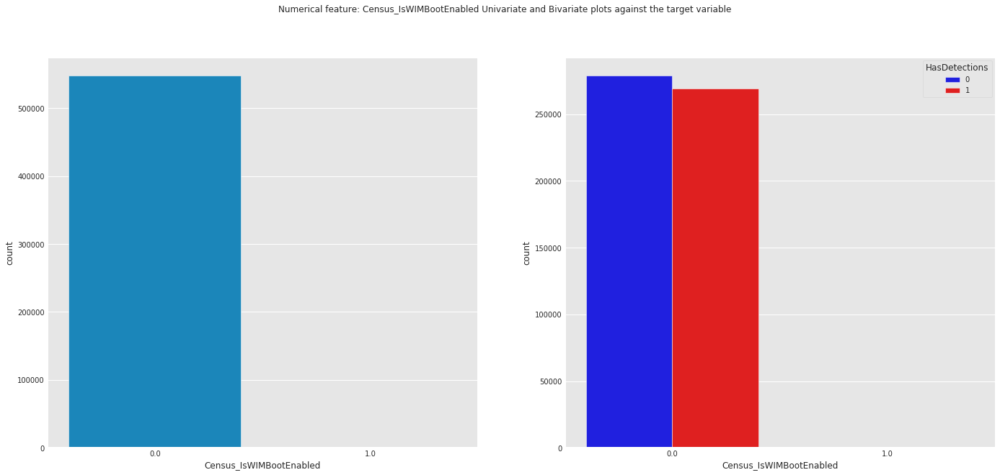

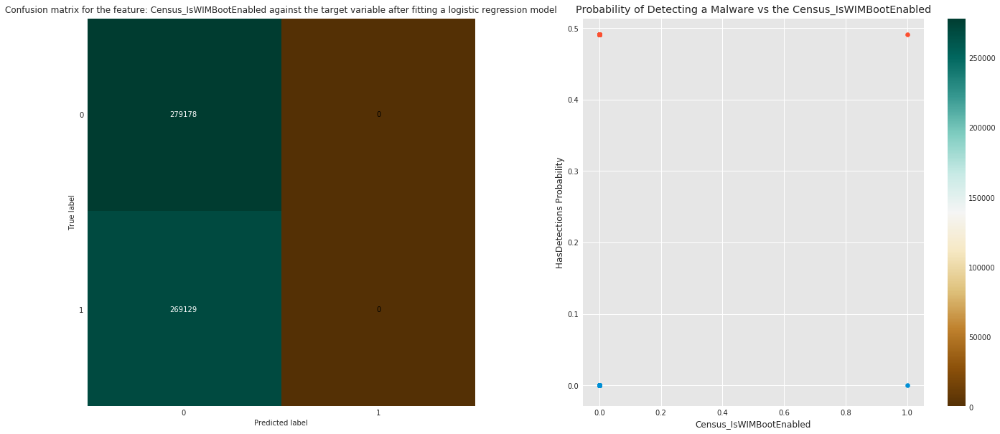

In [95]:
numerical_univariate_and_bivariate_plot("Census_IsWIMBootEnabled")
logistic_fit("Census_IsWIMBootEnabled")

In [96]:
numerical_univariate_and_bivariate_plot("Census_IsVirtualDevice")
logistic_fit("Census_IsVirtualDevice")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature Census_IsTouchEnabled
0    1311296
1     188704
Name: Census_IsTouchEnabled, dtype: int64
Min value 0
Max value 1
NaN values 0
Number of unique values 2

Fitting a logistic regression model for the feature Census_IsTouchEnabled against the target variable
              precision    recall  f1-score   support

           0       0.55      0.14      0.22    750796
           1       0.51      0.89      0.65    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.53      0.51      0.43   1500000
weighted avg       0.53      0.51      0.43   1500000


accuracy score: 0.5129573333333334
F1 score: 0.5129573333333334


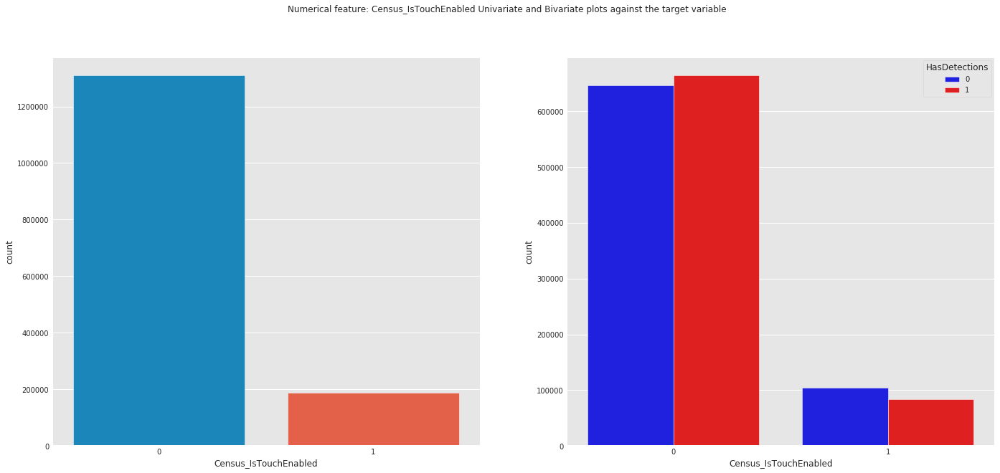

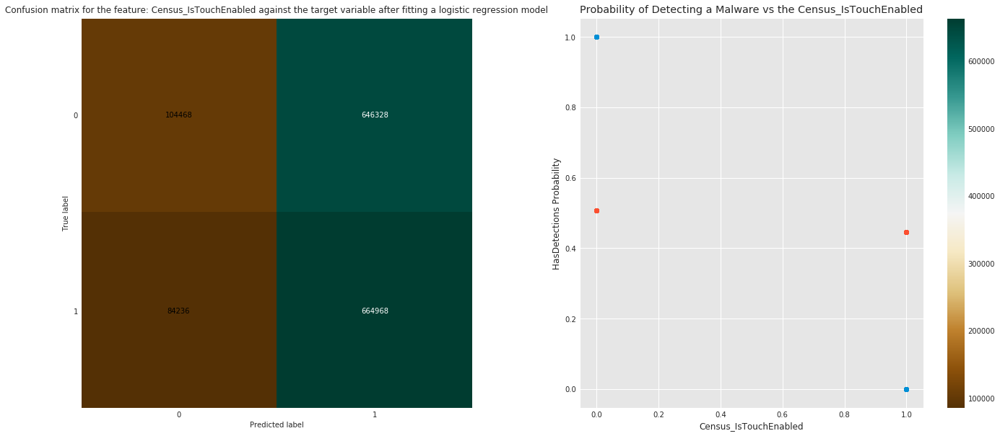

In [97]:
numerical_univariate_and_bivariate_plot("Census_IsTouchEnabled")
logistic_fit("Census_IsTouchEnabled")

In [98]:
numerical_univariate_and_bivariate_plot("Census_IsPenCapable")
logistic_fit("Census_IsPenCapable")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


In [99]:
numerical_univariate_and_bivariate_plot("Census_IsAlwaysOnAlwaysConnectedCapable")
logistic_fit("Census_IsAlwaysOnAlwaysConnectedCapable")

This feature has been removed from dataset due to high NaN rate or highly unbalanced values
This feature has been removed from dataset due to high NaN rate or highly unbalanced values


Top 10 Values counts for the numerical feature Wdft_IsGamer
0.0    1038268
1.0     410729
Name: Wdft_IsGamer, dtype: int64
Min value 0.0
Max value 1.0
NaN values 51003
Number of unique values 2

Fitting a logistic regression model for the feature Wdft_IsGamer against the target variable
              precision    recall  f1-score   support

           0       0.52      0.74      0.61    726260
           1       0.54      0.31      0.39    722737

   micro avg       0.53      0.53      0.53   1448997
   macro avg       0.53      0.53      0.50   1448997
weighted avg       0.53      0.53      0.50   1448997


accuracy score: 0.525633248378016
F1 score: 0.525633248378016


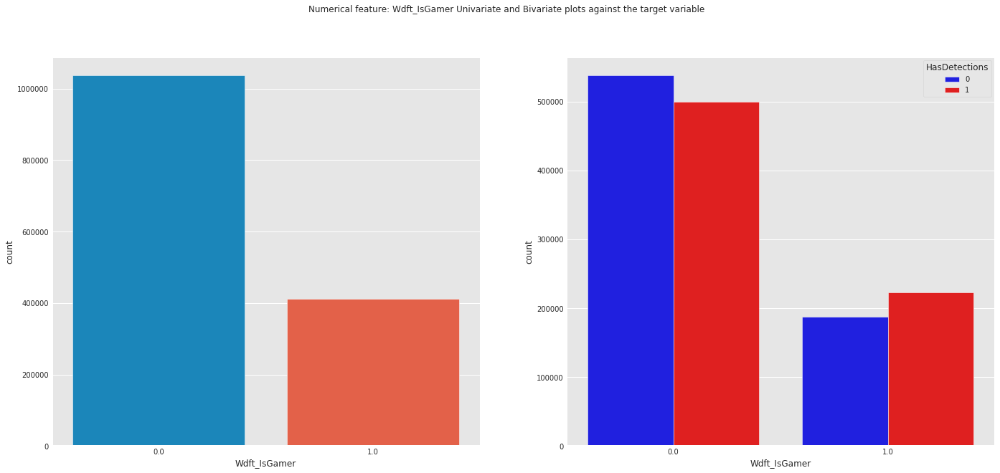

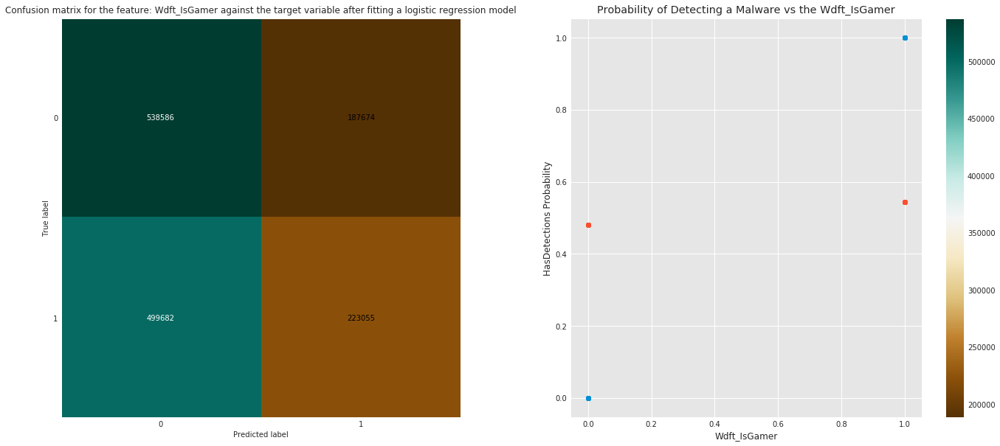

In [100]:
numerical_univariate_and_bivariate_plot("Wdft_IsGamer")
logistic_fit("Wdft_IsGamer")

Top 10 Values counts for the numerical feature Wdft_RegionIdentifier
10.0    302082
11.0    226821
3.0     218114
1.0     206753
15.0    171373
7.0     100118
8.0      46763
13.0     37814
5.0      34560
12.0     27605
Name: Wdft_RegionIdentifier, dtype: int64
Min value 1.0
Max value 15.0
NaN values 51003
Number of unique values 15
Mean value nan
Variance value 0.0

Fitting a logistic regression model for the feature Wdft_RegionIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.58      0.54    726260
           1       0.50      0.43      0.47    722737

   micro avg       0.51      0.51      0.51   1448997
   macro avg       0.51      0.51      0.50   1448997
weighted avg       0.51      0.51      0.50   1448997


accuracy score: 0.5054254770713811
F1 score: 0.5054254770713811


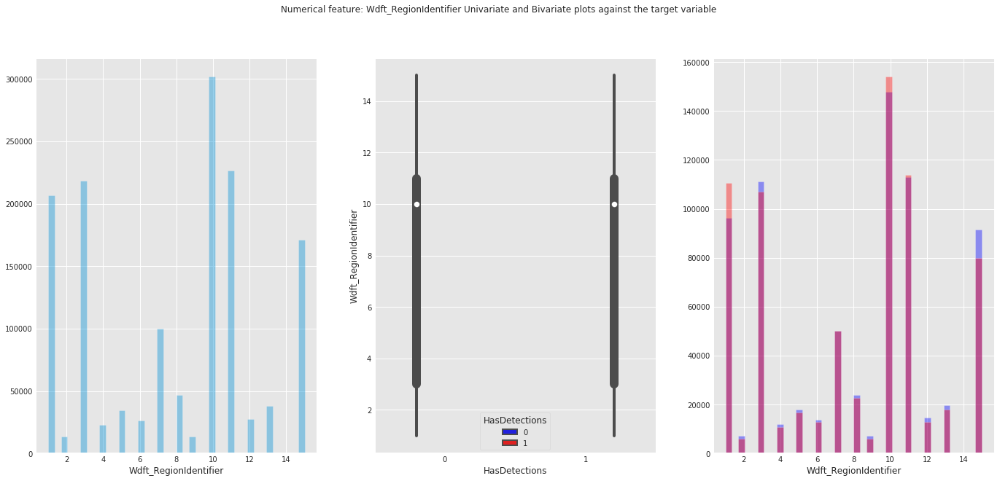

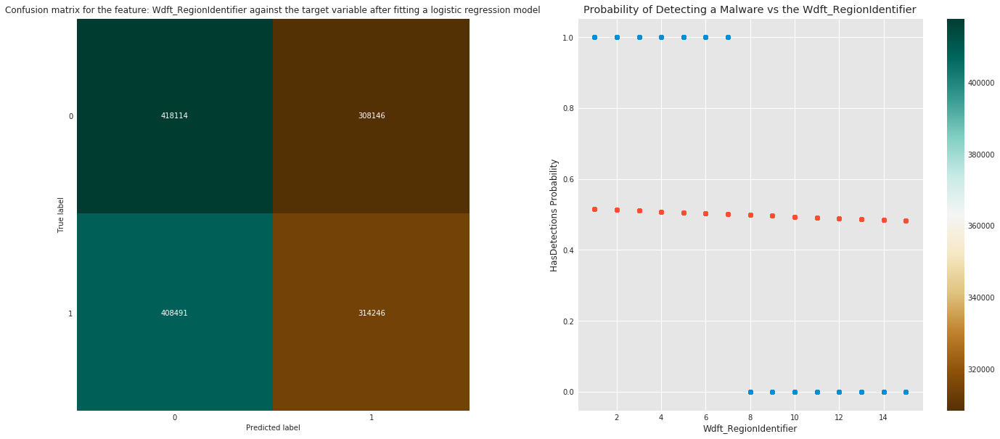

In [101]:
numerical_univariate_and_bivariate_plot("Wdft_RegionIdentifier")
logistic_fit("Wdft_RegionIdentifier")

In [102]:
gc.collect()

18059

### Correlations in Numerical Features
Trying to find corellations between numerical features

elapsed time: 33.65764284133911 seconds


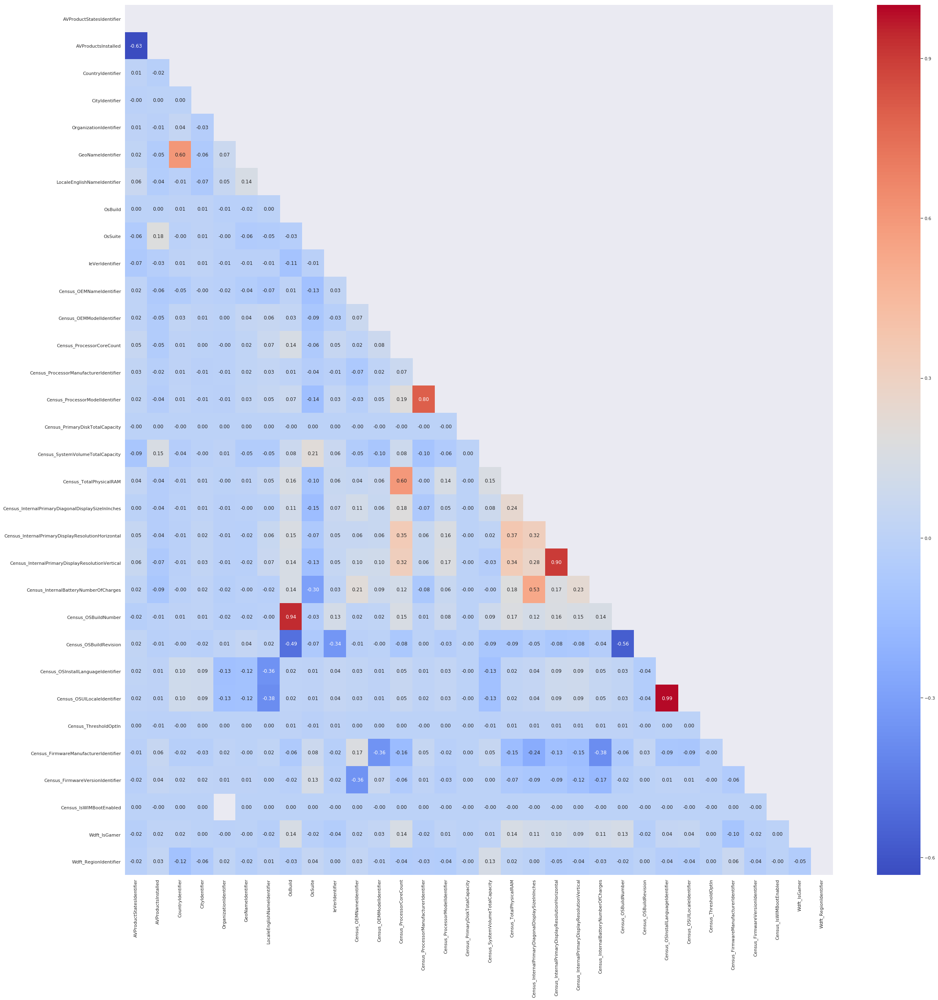

In [103]:
start_time = time.time()

sns.set(rc={'figure.figsize':(34.7,39.27)})

# Compute the correlation matrix
corr = train[numerical_and_binary_columns].corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='coolwarm')

print("elapsed time:", time.time() - start_time, "seconds")

Data correlation is the way in which one set of data may correspond to another set. In ML, think of how your features correspond with your output.

### Most correlated features

In [104]:
s = corr.unstack().drop_duplicates()
so = s.sort_values(kind="quicksort")

print("Top most highly megative correlated features:")
print(so[(so<-0.4)])
print()

print("Top most highly positive correlated features:")
print(so[(so<1) & (so>0.5)].sort_values(ascending=False))

Top most highly megative correlated features:
AVProductStatesIdentifier  AVProductsInstalled      -0.632899
Census_OSBuildNumber       Census_OSBuildRevision   -0.564208
OsBuild                    Census_OSBuildRevision   -0.493248
dtype: float64

Top most highly positive correlated features:
Census_OSInstallLanguageIdentifier                 Census_OSUILocaleIdentifier                        0.988468
OsBuild                                            Census_OSBuildNumber                               0.937893
Census_InternalPrimaryDisplayResolutionHorizontal  Census_InternalPrimaryDisplayResolutionVertical    0.901547
Census_ProcessorManufacturerIdentifier             Census_ProcessorModelIdentifier                    0.798425
CountryIdentifier                                  GeoNameIdentifier                                  0.598511
Census_ProcessorCoreCount                          Census_TotalPhysicalRAM                            0.597854
Census_InternalPrimaryDiagonalDisplaySiz

### Delete Variables

In [105]:
del corr
del mask
del s
del so
gc.collect()

23517

### Multivariate - Trivariate Analysis between highly correlated features and against the target variable; "HasDetections".
#### Inspecting the relationship between highly correlated features. Moreover trying to fit a logistic regression model between the target variable and the inspected features to identify if the features are good predictors.

In [106]:
%%time
def multivariate_plot(feature1, feature2):
    
    import warnings
    warnings.filterwarnings("ignore", category=FutureWarning)
    
    sns.set_style("darkgrid", {"axes.facecolor": ".9"})
    
    # check if one of the two features exists in train_sample columns
    if (feature1 not in train_sample.columns) | (feature2 not in train_sample.columns):
        if (feature1 not in train_sample.columns):
            print(feature1, "has been removed due to high NA rate or highly unbalanced values")
        elif (feature2 not in train_sample.columns):
            print(feature2, "has been removed due to high NA rate or higlhy unbalanced values")
        print()
            
    else:
        
        f, axes = plt.subplots(1, 2, figsize=(21, 10))
        
        # Due to overflow error I have to convert some columns into a bigger data type
        if (feature1 == "LocaleEnglishNameIdentifier") & (feature2 == "Census_OSUILocaleIdentifier"):
            g1 = sns.scatterplot(x=train_sample["LocaleEnglishNameIdentifier"].astype('int16'), y=train_sample["Census_OSUILocaleIdentifier"], hue = train_sample["HasDetections"], ax = axes[0])
            #g1 = sns.jointplot(x=train_sample["LocaleEnglishNameIdentifier"].astype('int16'), y=train_sample["Census_OSUILocaleIdentifier"], height=9, data = train)
            
            plt.title('Scatterplot Between: '+feature1+" and "+feature2, y=1.3, fontsize = 9)
            
        elif (feature1 == "LocaleEnglishNameIdentifier") & (feature2 == "Census_OSInstallLanguageIdentifier"):
            g1 = sns.scatterplot(x=train_sample["LocaleEnglishNameIdentifier"].astype('float16'), y=train_sample["Census_OSInstallLanguageIdentifier"], hue = train_sample["HasDetections"], ax = axes[0])
            #g1 = sns.jointplot(x=train_sample["LocaleEnglishNameIdentifier"].astype('float16'), y=train_sample["Census_OSInstallLanguageIdentifier"], height=9, data = train)
            
            plt.title('Scatterplot Between: '+feature1+" and "+feature2, y=1.3, fontsize = 9)
        else:    
            g1 = sns.scatterplot(x=train_sample[feature1], y=train_sample[feature2], hue = train_sample["HasDetections"], ax = axes[0])
            
            axes[0].set_title('Scatterplot Between: '+feature1+" and "+feature2)

        #g2 = sns.lmplot(x=feature1, y=feature2, hue="HasDetections", n_boot=1, data = train_sample, height=9, markers=["o", "x"], palette=["b", "r"])
        #g2 = sns.jointplot(x=feature1, y=feature2, data = train_sample, hue = "HasDetections", height=9)
        #g2 = sns.scatterplot(x=feature1, y=feature2, data = train_sample, hue = "HasDetections")
        
        #plt.title('Scatterplot Between: '+feature1+" and "+feature2+" against the target variable: 'HasDetections'", y=1.1, fontsize = 16)
        
        
        # fitting a logistic regression model with the 2 features
        
        # test if there is a logistic relationship between the feature1 and the target.
        
        from sklearn.metrics import accuracy_score
        from sklearn.metrics import precision_score
        from sklearn.metrics import recall_score
        from sklearn.metrics import f1_score
        from sklearn.metrics import r2_score
        
        from sklearn.linear_model import LogisticRegression
        
        print()
        print("Fitting a logistic regression model for the features", feature1,"and",feature2,"against the target variable")
        
        mask = ~train_sample[feature1].isnull() & ~train_sample[feature2].isnull() & ~train_sample["HasDetections"].isnull()

        logmodel = LogisticRegression()
        
        logmodel.fit(train_sample[[feature1, feature2]][mask].values, train_sample["HasDetections"][mask])
        predictions = logmodel.predict(train_sample[[feature1, feature2]][mask].values)

        from sklearn.metrics import classification_report
        print(classification_report(train_sample["HasDetections"][mask], predictions))
        print("")
        print("accuracy score:", accuracy_score(train_sample["HasDetections"][mask], predictions))
        print("F1 score:", accuracy_score(train_sample["HasDetections"][mask], predictions))
        #print("R^2 score:", r2_score(train_sample["HasDetections"][mask], predictions))
        
        
        g2 = sns.scatterplot(x=train_sample[feature1][mask].values, y=train_sample[feature2][mask].values, hue = predictions, ax=axes[1])
        axes[1].set_title('Logistic Predictions Between: '+feature1+" and "+feature2)

        import scikitplot as skplt
        skplt.metrics.plot_confusion_matrix(train_sample["HasDetections"][mask], predictions, normalize=False,
                                            title = "Confusion matrix for two features: "+feature1+" and "+feature2+" against the target variable after fitting a logistic regression model",
                                           figsize=(10,8), text_fontsize='large', cmap="BrBG")
        

        #### my mistake, how can I fit a linear model for binary classification, I have to use here logistic regression as before :D
        
        # old code in comments
        '''
        ### test if a linear model will fit the 2 correlated feature against the target variable
        # my thanks to: https://www.datasciencecentral.com/profiles/blogs/linear-regression-in-python-use-of-numpy-scipy-and-statsmodels
        # this link helped me a lot https://stackoverflow.com/questions/13643363/linear-regression-of-arrays-containing-nans-in-python-numpy
        
        
        # test if there is a linear relationship between the feature1 and the target.
        from scipy import stats
        mask = ~np.isnan(train_sample[feature1]) & ~np.isnan(train_sample["HasDetections"])
        slope, intercept, r_value, p_value, std_err = stats.linregress(train_sample[feature1][mask], train_sample["HasDetections"][mask])

        sign='+'
        if slope<0:
            sign = ''
        
        lm_1 = "linear regression function #1: y = "+str(np.round(intercept,5))+" "+sign +" "+str(np.round(slope,5))+" * "+feature1
        lm_1 = lm_1+"\n"+" p-value: "+str(p_value)+"\n"+" R^2: "+str(r_value)
        #print(lm_1)
        #print(feature1, "p-value",p_value)
        #print("R^2:", r_value)

        #print()

        # test if there is a linear relationship between the feature2 and the target.
        mask = ~np.isnan(train_sample[feature2]) & ~np.isnan(train_sample["HasDetections"])
        slope, intercept, r_value, p_value, std_err = stats.linregress(train_sample[feature2][mask], train_sample["HasDetections"][mask])

        sign='+'
        if slope<0:
            sign=''
        
        lm_2 = "linear regression function #2: y = "+str(np.round(intercept,5))+" "+sign +" "+str(np.round(slope,5))+" * "+feature2
        lm_2 = lm_2+"\n"+" p-value: "+str(p_value)+"\n"+" R^2: "+str(r_value)
        #print(lm_2)
        #print(feature2, "p-value",p_value)
        #print("R^2:", 100* r_value)
        
        plt.figure(figsize=(8, 9))
        ax = plt.subplot(121)
    
        # plotting text with matplotlib:
        # https://matplotlib.org/api/_as_gen/matplotlib.pyplot.text.html
        plt.text(0.5, 0.9, lm_1, size=15, ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1., 0.8, 0.8),
                   )
         )
        
        
        plt.text(0.5, 0.6, lm_2, size=15, ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1., 0.8, 0.8),
                   )
         )

        plt.axis('off')
        plt.show()
        '''

    

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 9.78 µs


In [107]:
%%time
multivariate_plot("RtpStateBitfield", "IsSxsPassiveMode")
gc.collect()

RtpStateBitfield has been removed due to high NA rate or highly unbalanced values

CPU times: user 96 ms, sys: 4 ms, total: 100 ms
Wall time: 95.3 ms



Fitting a logistic regression model for the features AVProductStatesIdentifier and AVProductsInstalled against the target variable
              precision    recall  f1-score   support

           0       0.61      0.38      0.46    747103
           1       0.55      0.76      0.64    746887

   micro avg       0.57      0.57      0.57   1493990
   macro avg       0.58      0.57      0.55   1493990
weighted avg       0.58      0.57      0.55   1493990


accuracy score: 0.5671470357900655
F1 score: 0.5671470357900655
CPU times: user 18.2 s, sys: 756 ms, total: 18.9 s
Wall time: 18.1 s


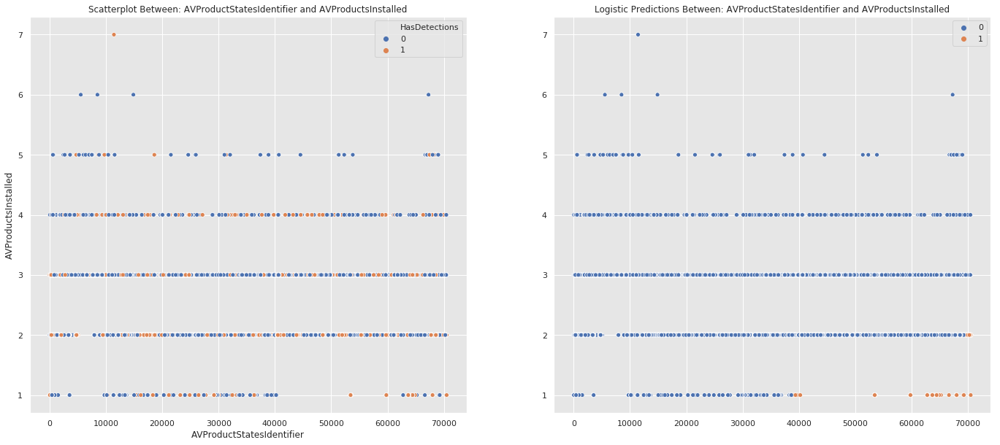

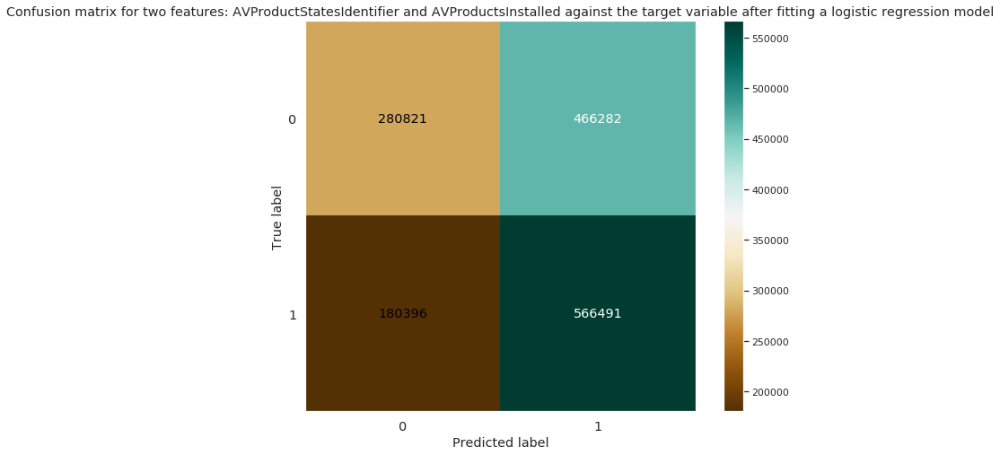

In [108]:
%%time
multivariate_plot("AVProductStatesIdentifier", "AVProductsInstalled")
gc.collect()


Fitting a logistic regression model for the features Census_OSBuildNumber and Census_OSBuildRevision against the target variable
              precision    recall  f1-score   support

           0       0.53      0.29      0.37    750796
           1       0.51      0.74      0.60    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.52      0.51      0.49   1500000
weighted avg       0.52      0.51      0.49   1500000


accuracy score: 0.5140733333333334
F1 score: 0.5140733333333334
CPU times: user 18.9 s, sys: 856 ms, total: 19.8 s
Wall time: 19 s


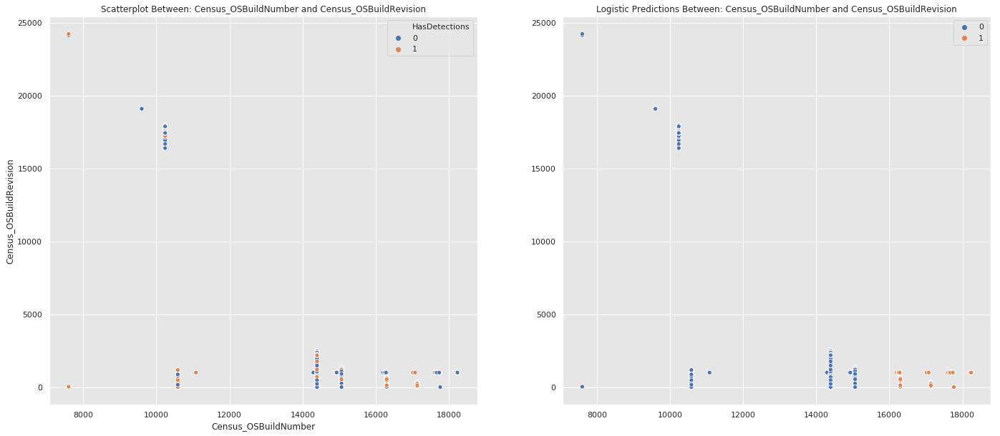

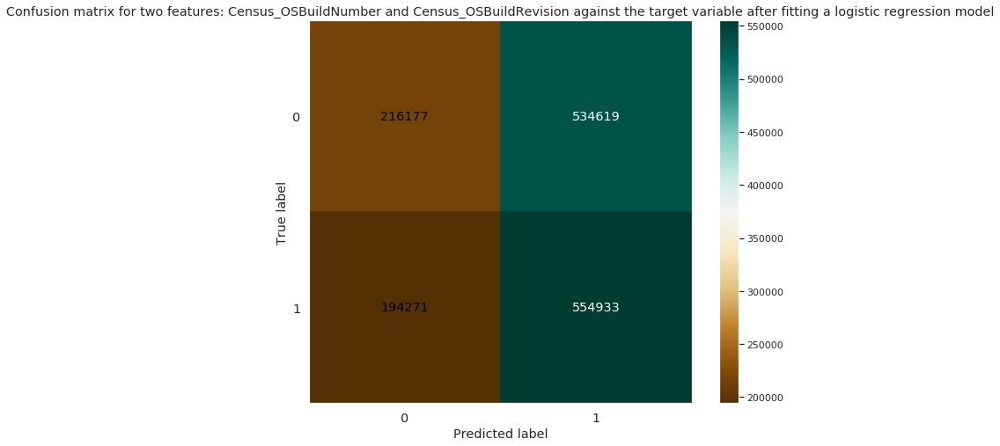

In [109]:
%%time
multivariate_plot("Census_OSBuildNumber", "Census_OSBuildRevision")
gc.collect()


Fitting a logistic regression model for the features OsBuild and Census_OSBuildRevision against the target variable
              precision    recall  f1-score   support

           0       0.53      0.29      0.37    750796
           1       0.51      0.74      0.60    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.52      0.51      0.49   1500000
weighted avg       0.52      0.51      0.49   1500000


accuracy score: 0.5134633333333334
F1 score: 0.5134633333333334
CPU times: user 19.2 s, sys: 756 ms, total: 20 s
Wall time: 19.1 s


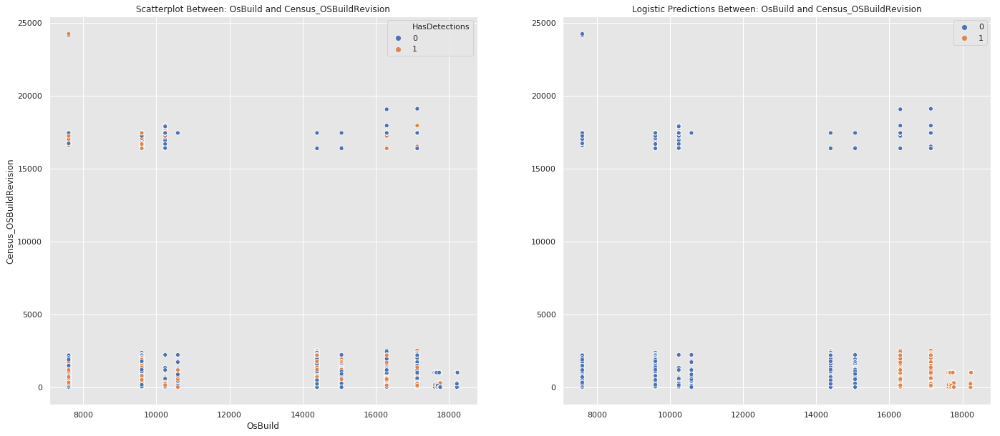

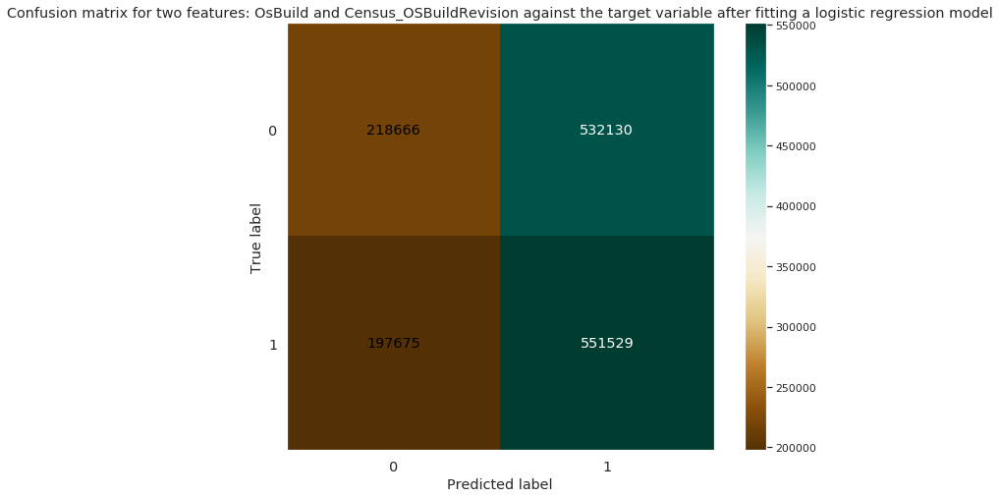

In [110]:
%%time
multivariate_plot("OsBuild", "Census_OSBuildRevision")
gc.collect()

In [111]:
%%time
multivariate_plot("HasTpm", "IeVerIdentifier")
gc.collect()

HasTpm has been removed due to high NA rate or highly unbalanced values

CPU times: user 116 ms, sys: 100 ms, total: 216 ms
Wall time: 113 ms



Fitting a logistic regression model for the features LocaleEnglishNameIdentifier and Census_OSUILocaleIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.64      0.57    750796
           1       0.51      0.37      0.43    749204

   micro avg       0.51      0.51      0.51   1500000
   macro avg       0.51      0.51      0.50   1500000
weighted avg       0.51      0.51      0.50   1500000


accuracy score: 0.506016
F1 score: 0.506016
CPU times: user 18.5 s, sys: 708 ms, total: 19.2 s
Wall time: 18.4 s


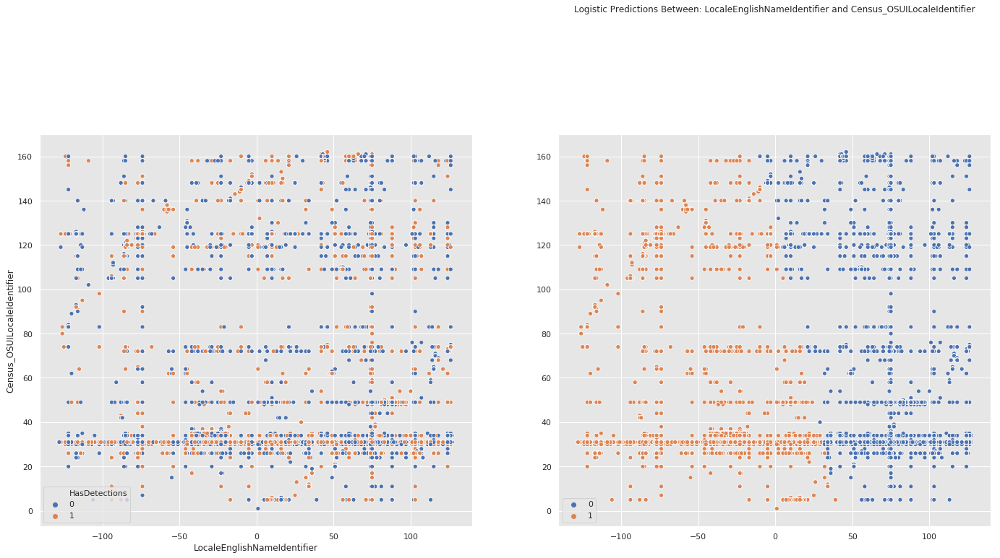

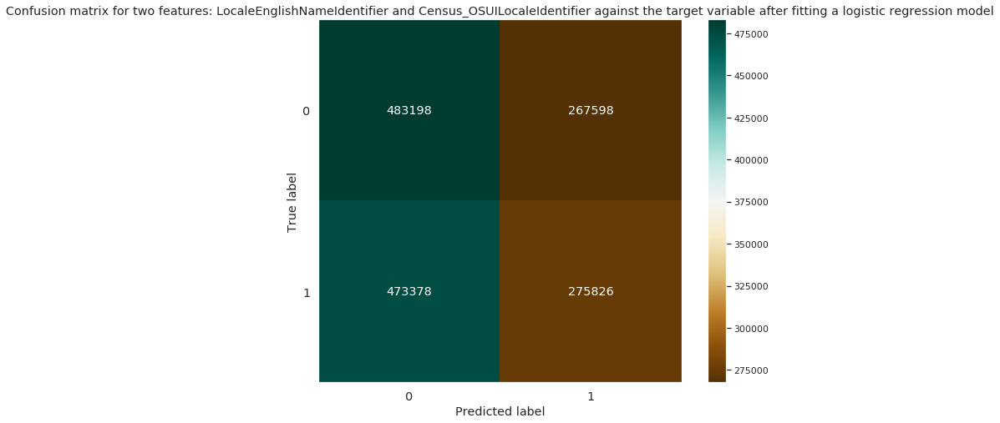

In [112]:
%%time
multivariate_plot("LocaleEnglishNameIdentifier", "Census_OSUILocaleIdentifier")
gc.collect()


Fitting a logistic regression model for the features Census_InternalBatteryNumberOfCharges and Census_FirmwareManufacturerIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.50      0.59      0.54    716460
           1       0.50      0.42      0.46    716870

   micro avg       0.50      0.50      0.50   1433330
   macro avg       0.50      0.50      0.50   1433330
weighted avg       0.50      0.50      0.50   1433330


accuracy score: 0.5025011686073688
F1 score: 0.5025011686073688
CPU times: user 14.4 s, sys: 812 ms, total: 15.2 s
Wall time: 14.3 s


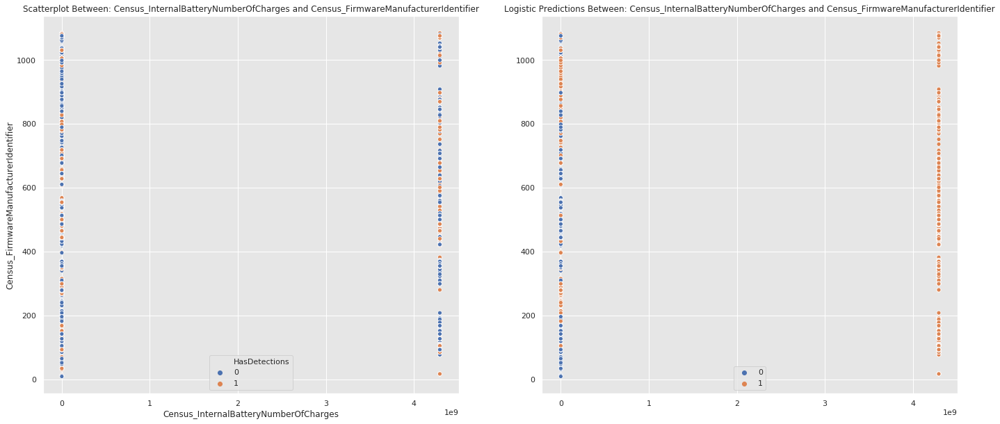

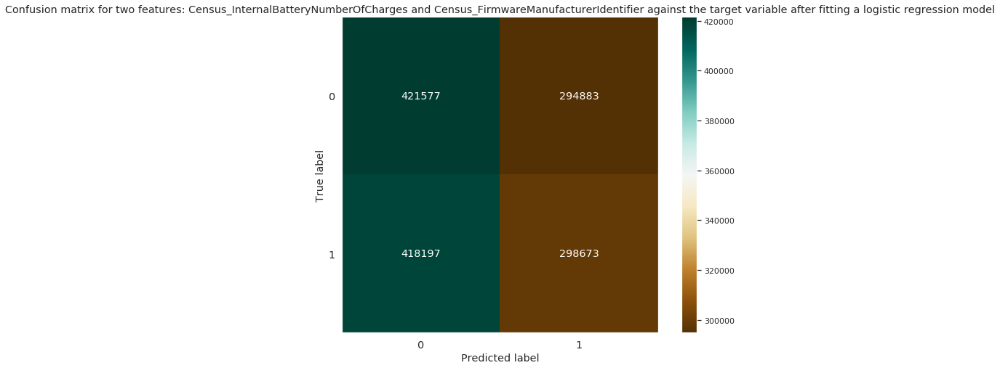

In [113]:
%%time
multivariate_plot("Census_InternalBatteryNumberOfCharges", "Census_FirmwareManufacturerIdentifier")
gc.collect()


Fitting a logistic regression model for the features LocaleEnglishNameIdentifier and Census_OSInstallLanguageIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.62      0.56    745866
           1       0.51      0.39      0.44    744108

   micro avg       0.51      0.51      0.51   1489974
   macro avg       0.51      0.51      0.50   1489974
weighted avg       0.51      0.51      0.50   1489974


accuracy score: 0.5068625358563303
F1 score: 0.5068625358563303
CPU times: user 17.7 s, sys: 776 ms, total: 18.5 s
Wall time: 17.7 s


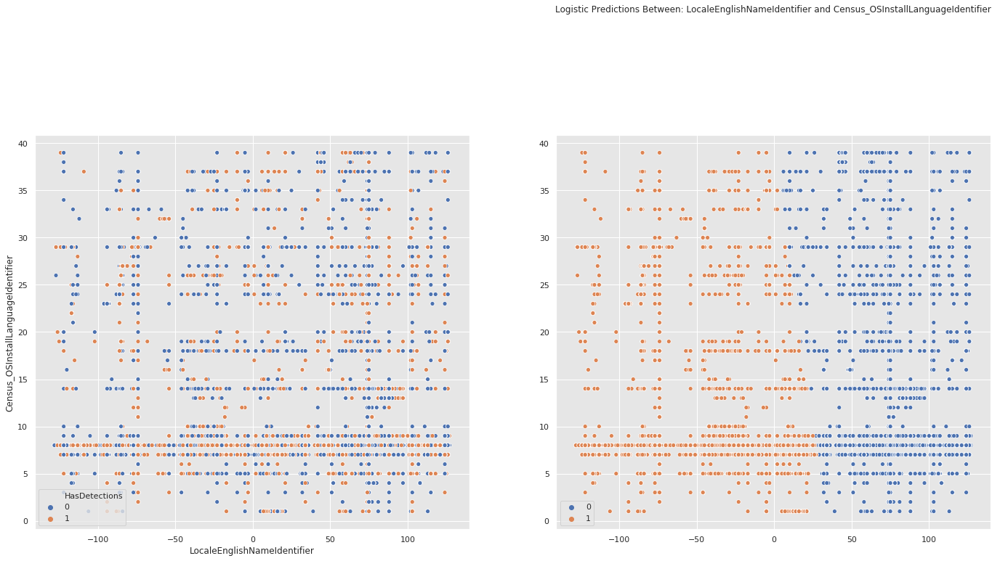

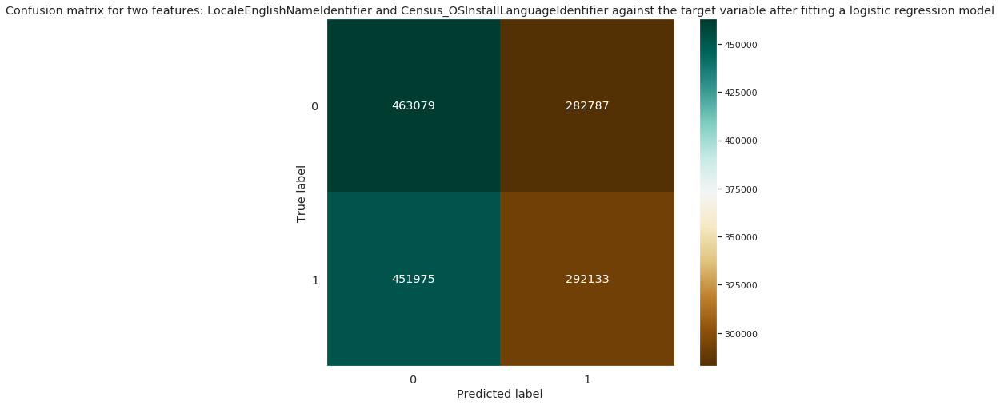

In [114]:
%%time
multivariate_plot("LocaleEnglishNameIdentifier", "Census_OSInstallLanguageIdentifier")
gc.collect()


Fitting a logistic regression model for the features Census_OEMModelIdentifier and Census_FirmwareManufacturerIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.54      0.52    728506
           1       0.51      0.48      0.50    732193

   micro avg       0.51      0.51      0.51   1460699
   macro avg       0.51      0.51      0.51   1460699
weighted avg       0.51      0.51      0.51   1460699


accuracy score: 0.5108143429960588
F1 score: 0.5108143429960588
CPU times: user 16.7 s, sys: 700 ms, total: 17.4 s
Wall time: 16.6 s


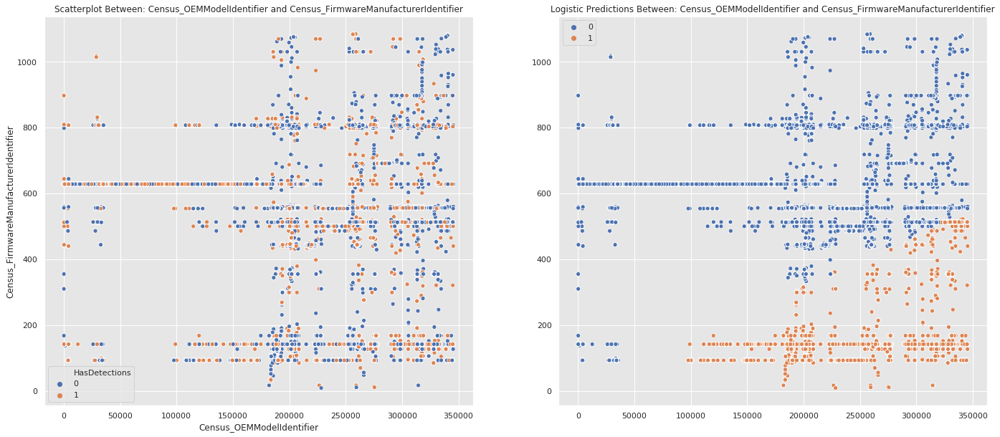

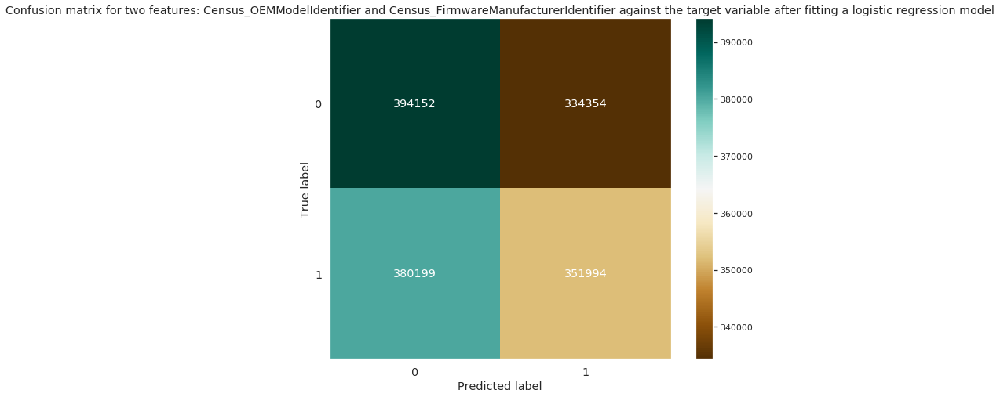

In [115]:
%%time
multivariate_plot("Census_OEMModelIdentifier", "Census_FirmwareManufacturerIdentifier")
gc.collect()


Fitting a logistic regression model for the features Census_OEMNameIdentifier and Census_FirmwareVersionIdentifier against the target variable
              precision    recall  f1-score   support

           0       0.51      0.31      0.39    731459
           1       0.50      0.70      0.59    734282

   micro avg       0.51      0.51      0.51   1465741
   macro avg       0.51      0.51      0.49   1465741
weighted avg       0.51      0.51      0.49   1465741


accuracy score: 0.5055408834166473
F1 score: 0.5055408834166473
CPU times: user 18.1 s, sys: 808 ms, total: 18.9 s
Wall time: 18 s


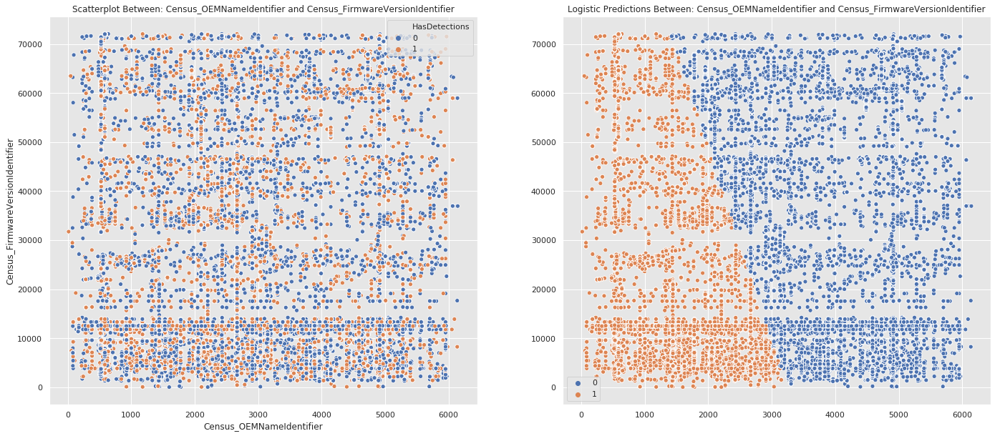

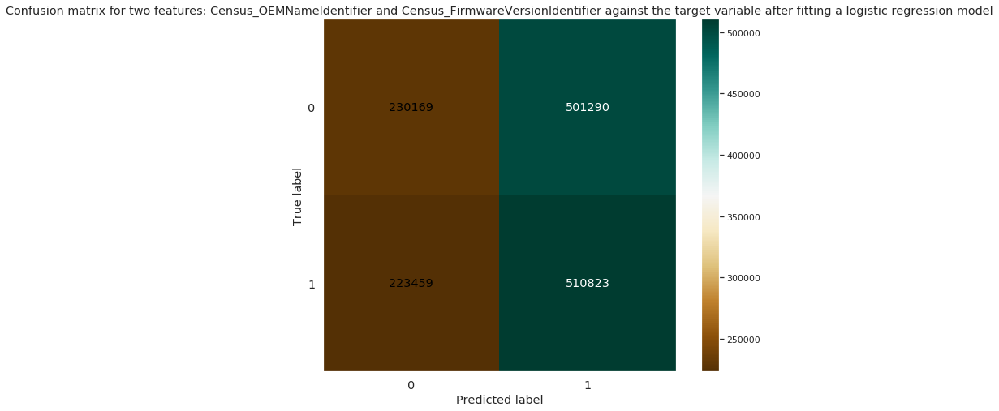

In [116]:
%%time
multivariate_plot("Census_OEMNameIdentifier", "Census_FirmwareVersionIdentifier")
gc.collect()

<a id="ML"></a>
## Machine Learning modeling

![](https://cmci.colorado.edu/classes/INFO-4604/fa17/wordcloud.png)

As we saw, linear relationships are really weak, thus Classification Trees will find patterns of relations between the target variable with the features.

### Delete Train set, to free up memory space.

In [117]:
del train
gc.collect()

8147

### Reading the test data

In [118]:
test_dtypes = {k: v for k, v in dtypes.items() if k in good_cols}

# get all columns except
test = pd.read_csv('../input/test.csv', dtype=test_dtypes, usecols=good_cols[:-1])

#test = reduce_mem_usage(test)

In [119]:
test.head()

,MachineIdentifier,EngineVersion,AppVersion,AvSigVersion,AVProductStatesIdentifier,AVProductsInstalled,CountryIdentifier,CityIdentifier,OrganizationIdentifier,GeoNameIdentifier,LocaleEnglishNameIdentifier,OsBuild,OsSuite,OsPlatformSubRelease,OsBuildLab,SkuEdition,IeVerIdentifier,SmartScreen,Census_MDC2FormFactor,Census_OEMNameIdentifier,Census_OEMModelIdentifier,Census_ProcessorCoreCount,Census_ProcessorManufacturerIdentifier,Census_ProcessorModelIdentifier,Census_PrimaryDiskTotalCapacity,Census_PrimaryDiskTypeName,Census_SystemVolumeTotalCapacity,Census_TotalPhysicalRAM,Census_ChassisTypeName,Census_InternalPrimaryDiagonalDisplaySizeInInches,Census_InternalPrimaryDisplayResolutionHorizontal,Census_InternalPrimaryDisplayResolutionVertical,Census_PowerPlatformRoleName,Census_InternalBatteryType,Census_InternalBatteryNumberOfCharges,Census_OSVersion,Census_OSBranch,Census_OSBuildNumber,Census_OSBuildRevision,Census_OSEdition,Census_OSSkuName,Census_OSInstallTypeName,Census_OSInstallLanguageIdentifier,Census_OSUILocaleIdentifier,Census_OSWUAutoUpdateOptionsName,Census_GenuineStateName,Census_ActivationChannel,Census_IsFlightingInternal,Census_ThresholdOptIn,Census_FirmwareManufacturerIdentifier,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsTouchEnabled,Wdft_IsGamer,Wdft_RegionIdentifier
0,0000010489e3af074adeac69c53e555e,1.1.15400.5,4.18.1810.5,1.281.501.0,53447.0,1.0,43,58552.0,18.0,53.0,42,15063,768,rs2,15063.0.amd64fre.rs2_release.170317-1834,Home,108.0,NaN,Notebook,2688.0,30661.0,4.0,5.0,3064.0,488386.0,SSD,123179.0,8192.0,Notebook,15.500000,1920.0,1080.0,Mobile,NaN,8.0,10.0.15063.1387,rs2_release,15063,1387,Core,CORE,Reset,37.0,158,AutoInstallAndRebootAtMaintenanceTime,IS_GENUINE,OEM:DM,NaN,NaN,807.0,8554.0,1,NaN,0,0.0,7.0
1,00000176ac758d54827acd545b6315a5,1.1.15400.4,4.18.1809.2,1.279.301.0,53447.0,1.0,68,71395.0,NaN,276.0,74,16299,768,rs3,16299.431.amd64fre.rs3_release_svc_escrow.1805...,Home,117.0,RequireAdmin,Notebook,2206.0,242491.0,4.0,5.0,3410.0,1907729.0,HDD,1882352.0,8192.0,Notebook,15.500000,1366.0,768.0,Mobile,NaN,0.0,10.0.16299.611,rs3_release_svc_escrow,16299,611,Core,CORE,UUPUpgrade,7.0,30,AutoInstallAndRebootAtMaintenanceTime,IS_GENUINE,Retail,NaN,NaN,554.0,33105.0,1,NaN,0,1.0,12.0
2,0000019dcefc128c2d4387c1273dae1d,1.1.15300.6,4.18.1809.2,1.277.230.0,49480.0,2.0,201,66202.0,NaN,267.0,-5,14393,768,rs1,14393.2189.amd64fre.rs1_release.180329-1711,Home,98.0,RequireAdmin,Notebook,585.0,189533.0,2.0,5.0,2096.0,29820.0,SSD,28678.0,4096.0,Notebook,13.898438,1280.0,720.0,Mobile,NaN,0.0,10.0.14393.2189,rs1_release,14393,2189,CoreSingleLanguage,CORE_SINGLELANGUAGE,Other,35.0,148,UNKNOWN,IS_GENUINE,OEM:DM,NaN,NaN,556.0,63396.0,1,NaN,0,1.0,11.0
3,0000055553dc51b1295785415f1a224d,1.1.15400.5,4.18.1810.5,1.281.664.0,42160.0,2.0,29,120917.0,NaN,35.0,-85,16299,768,rs3,16299.15.amd64fre.rs3_release.170928-1534,Home,117.0,RequireAdmin,Notebook,2668.0,171228.0,2.0,5.0,1985.0,476940.0,HDD,439345.0,4096.0,Notebook,14.000000,1366.0,768.0,Mobile,li-i,0.0,10.0.16299.371,rs3_release,16299,371,CoreSingleLanguage,CORE_SINGLELANGUAGE,Upgrade,26.0,119,Notify,IS_GENUINE,OEM:DM,NaN,0.0,628.0,26320.0,1,0.0,0,0.0,10.0
4,00000574cefffeca83ec8adf9285b2bf,1.1.15400.4,4.18.1809.2,1.279.236.0,53447.0,1.0,171,124736.0,18.0,211.0,-74,16299,768,rs3,16299.15.amd64fre.rs3_release.170928-1534,Home,117.0,RequireAdmin,Notebook,585.0,189538.0,4.0,5.0,3394.0,476940.0,HDD,461506.0,2048.0,Notebook,15.500000,1366.0,768.0,Mobile,NaN,0.0,10.0.16299.371,rs3_release,16299,371,CoreSingleLanguage,CORE_SINGLELANGUAGE,Update,29.0,125,UNKNOWN,IS_GENUINE,Retail,NaN,NaN,556.0,63269.0,1,NaN,0,1.0,3.0


In [120]:
test.shape

(7853253, 56)

### Feature Engineering

In [121]:
new = train_sample["OsBuildLab"].str.split(".", expand = True)
train_sample["OsBuildLab_1"] = new[2]

new = test["OsBuildLab"].str.split(".", expand = True)
test["OsBuildLab_1"] = new[2]


categorical_columns.append("OsBuildLab_1")
del new

#special thanks to https://www.kaggle.com/delayedkarma/let-s-add-some-new-features-lb-0-674

#train_sample['new_num_1'] = train_sample['Census_TotalPhysicalRAM'] * train_sample['Census_InternalPrimaryDiagonalDisplaySizeInInches']
#test['new_num_1'] = test['Census_TotalPhysicalRAM'] * test['Census_InternalPrimaryDiagonalDisplaySizeInInches']

#train_sample['new_num_2'] = train_sample['Census_ProcessorCoreCount'] * train_sample['Census_InternalPrimaryDiagonalDisplaySizeInInches']
#test['new_num_2'] = test['Census_ProcessorCoreCount'] * test['Census_InternalPrimaryDiagonalDisplaySizeInInches']

#train_sample['new_num_3'] = train_sample['Census_ProcessorCoreCount'] * train_sample['Census_TotalPhysicalRAM']
#test['new_num_3'] = test['Census_ProcessorCoreCount'] * test['Census_TotalPhysicalRAM']

#train_sample['new_num_4'] = train_sample['Census_PrimaryDiskTotalCapacity'] * train_sample['Census_TotalPhysicalRAM']
#test['new_num_4'] = test['Census_PrimaryDiskTotalCapacity'] * test['Census_TotalPhysicalRAM']

#train_sample['new_num_5'] = train_sample['Census_SystemVolumeTotalCapacity'] * train_sample['Census_InternalPrimaryDiagonalDisplaySizeInInches']
#test['new_num_5'] = test['Census_SystemVolumeTotalCapacity'] * test['Census_InternalPrimaryDiagonalDisplaySizeInInches']

### Drop the unique "MachineIdentifier" Identifiers

In [122]:
train_sample = train_sample.drop(['MachineIdentifier'], axis=1)
test = test.drop(['MachineIdentifier'], axis=1)

In [123]:
train_sample = train_sample.reset_index(drop=True)

### Filling NA values with the statistical Mode

In [124]:
modes = train_sample.mode()

for col in train_sample.columns:
    train_sample[col] = np.where(train_sample[col].isnull(), modes[col], train_sample[col])

del modes

In [125]:
modes_test = test.mode()

for col in test.columns:
    test[col] = np.where(test[col].isnull(), modes_test[col], test[col])

#train_sample.shape
del modes_test

### Concatenate both train_sample and test sets before label encoding

In [126]:
train_shape = train_sample.shape
test_shape = test.shape

train_and_test = pd.concat([train_sample,test], axis="rows", sort=False)

del train_sample
del test
gc.collect()

140858

In [127]:
train_and_test.head()

,EngineVersion,AppVersion,AvSigVersion,AVProductStatesIdentifier,AVProductsInstalled,CountryIdentifier,CityIdentifier,OrganizationIdentifier,GeoNameIdentifier,LocaleEnglishNameIdentifier,OsBuild,OsSuite,OsPlatformSubRelease,OsBuildLab,SkuEdition,IeVerIdentifier,SmartScreen,Census_MDC2FormFactor,Census_OEMNameIdentifier,Census_OEMModelIdentifier,Census_ProcessorCoreCount,Census_ProcessorManufacturerIdentifier,Census_ProcessorModelIdentifier,Census_PrimaryDiskTotalCapacity,Census_PrimaryDiskTypeName,Census_SystemVolumeTotalCapacity,Census_TotalPhysicalRAM,Census_ChassisTypeName,Census_InternalPrimaryDiagonalDisplaySizeInInches,Census_InternalPrimaryDisplayResolutionHorizontal,Census_InternalPrimaryDisplayResolutionVertical,Census_PowerPlatformRoleName,Census_InternalBatteryType,Census_InternalBatteryNumberOfCharges,Census_OSVersion,Census_OSBranch,Census_OSBuildNumber,Census_OSBuildRevision,Census_OSEdition,Census_OSSkuName,Census_OSInstallTypeName,Census_OSInstallLanguageIdentifier,Census_OSUILocaleIdentifier,Census_OSWUAutoUpdateOptionsName,Census_GenuineStateName,Census_ActivationChannel,Census_IsFlightingInternal,Census_ThresholdOptIn,Census_FirmwareManufacturerIdentifier,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsTouchEnabled,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections,OsBuildLab_1
0,1.1.15100.1,4.18.1807.18075,1.273.1234.0,53447.0,1.0,8,85219.0,27.0,205.0,-84,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,137.0,RequireAdmin,Desktop,1443.0,275891.0,4.0,5.0,2272.0,953869.0,HDD,952838.0,8192.0,AllinOne,23.000000,1920.0,1080.0,Desktop,lion,4.294967e+09,10.0.17134.165,rs4_release,17134,165,Professional,PROFESSIONAL,UUPUpgrade,27.0,120,FullAuto,IS_GENUINE,OEM:DM,0.0,0.0,355.0,19951.0,0,0.0,0,0.0,11.0,1.0,amd64fre
1,1.1.15100.1,4.18.1807.18075,1.273.1282.0,53447.0,1.0,129,54198.0,27.0,126.0,124,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,137.0,RequireAdmin,Notebook,2102.0,248850.0,4.0,5.0,2660.0,476940.0,HDD,457600.0,8192.0,Notebook,13.203125,1280.0,720.0,Mobile,lion,0.000000e+00,10.0.17134.165,rs4_release,17134,165,Professional,PROFESSIONAL,UUPUpgrade,18.0,72,FullAuto,IS_GENUINE,OEM:DM,0.0,0.0,486.0,48753.0,0,0.0,0,1.0,3.0,0.0,amd64fre
2,1.1.15100.1,4.9.10586.1106,1.273.781.0,46781.0,2.0,149,122689.0,27.0,181.0,56,10586,768,th2,10586.1176.amd64fre.th2_release_sec.170913-1848,Home,74.0,RequireAdmin,Convertible,2206.0,238234.0,4.0,5.0,2998.0,244198.0,SSD,221251.0,8192.0,Notebook,15.500000,1920.0,1080.0,Mobile,lion,0.000000e+00,10.0.10586.1176,th2_release_sec,10586,1176,Core,CORE,Update,24.0,109,Notify,IS_GENUINE,Retail,0.0,0.0,554.0,33111.0,1,0.0,1,0.0,15.0,0.0,amd64fre
3,1.1.15200.1,4.18.1807.18075,1.275.1639.0,53447.0,1.0,164,114587.0,27.0,205.0,-84,17134,768,rs4,17134.1.amd64fre.rs4_release.180410-1804,Home,137.0,RequireAdmin,Notebook,525.0,265410.0,8.0,5.0,2880.0,228936.0,SSD,228321.0,8192.0,Notebook,15.500000,1920.0,1080.0,Mobile,lion,5.770000e+02,10.0.17134.286,rs4_release,17134,286,Core,CORE,IBSClean,27.0,120,FullAuto,IS_GENUINE,Retail,0.0,0.0,142.0,48473.0,1,0.0,0,0.0,15.0,1.0,amd64fre
4,1.1.15200.1,4.18.1807.18075,1.275.511.0,47238.0,2.0,207,72421.0,27.0,277.0,75,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,137.0,RequireAdmin,Notebook,1443.0,256478.0,4.0,1.0,198.0,476940.0,HDD,464374.0,4096.0,Portable,15.500000,1366.0,768.0,Mobile,lion,0.000000e+00,10.0.17134.228,rs4_release,17134,228,Professional,PROFESSIONAL,Update,8.0,31,FullAuto,IS_GENUINE,OEM:DM,0.0,0.0,355.0,4343.0,1,0.0,1,1.0,13.0,1.0,amd64fre


In [128]:
train_and_test.tail()

,EngineVersion,AppVersion,AvSigVersion,AVProductStatesIdentifier,AVProductsInstalled,CountryIdentifier,CityIdentifier,OrganizationIdentifier,GeoNameIdentifier,LocaleEnglishNameIdentifier,OsBuild,OsSuite,OsPlatformSubRelease,OsBuildLab,SkuEdition,IeVerIdentifier,SmartScreen,Census_MDC2FormFactor,Census_OEMNameIdentifier,Census_OEMModelIdentifier,Census_ProcessorCoreCount,Census_ProcessorManufacturerIdentifier,Census_ProcessorModelIdentifier,Census_PrimaryDiskTotalCapacity,Census_PrimaryDiskTypeName,Census_SystemVolumeTotalCapacity,Census_TotalPhysicalRAM,Census_ChassisTypeName,Census_InternalPrimaryDiagonalDisplaySizeInInches,Census_InternalPrimaryDisplayResolutionHorizontal,Census_InternalPrimaryDisplayResolutionVertical,Census_PowerPlatformRoleName,Census_InternalBatteryType,Census_InternalBatteryNumberOfCharges,Census_OSVersion,Census_OSBranch,Census_OSBuildNumber,Census_OSBuildRevision,Census_OSEdition,Census_OSSkuName,Census_OSInstallTypeName,Census_OSInstallLanguageIdentifier,Census_OSUILocaleIdentifier,Census_OSWUAutoUpdateOptionsName,Census_GenuineStateName,Census_ActivationChannel,Census_IsFlightingInternal,Census_ThresholdOptIn,Census_FirmwareManufacturerIdentifier,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsTouchEnabled,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections,OsBuildLab_1
7853248,1.1.15400.5,4.18.1810.5,1.281.261.0,53447.0,1.0,29,157045.0,27.0,35.0,-85,16299,768,rs3,16299.637.amd64fre.rs3_release_svc.180808-1748,Home,117.0,RequireAdmin,Notebook,2206.0,229758.0,4.0,5.0,2296.0,476940.0,HDD,476938.0,4096.0,Notebook,13.898438,1366.0,768.0,Mobile,lion,0.0,10.0.16299.15,rs3_release,16299,15,CoreSingleLanguage,CORE_SINGLELANGUAGE,IBSClean,26.0,119,UNKNOWN,IS_GENUINE,Retail,0.0,0.0,554.0,33060.0,0,0.0,0,0.0,10.0,NaN,amd64fre
7853249,1.1.15400.5,4.18.1810.5,1.281.382.0,53447.0,1.0,95,145168.0,18.0,121.0,75,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,137.0,RequireAdmin,Notebook,530.0,257648.0,4.0,5.0,2498.0,715404.0,HDD,49900.0,4096.0,Laptop,15.500000,1366.0,768.0,Mobile,lion,0.0,10.0.17134.407,rs4_release,17134,407,Professional,PROFESSIONAL,IBSClean,8.0,31,FullAuto,IS_GENUINE,Volume:GVLK,0.0,0.0,142.0,42119.0,0,0.0,0,0.0,11.0,NaN,amd64fre
7853250,1.1.15400.5,4.18.1810.5,1.281.261.0,68585.0,2.0,43,163420.0,18.0,53.0,42,17134,768,rs4,17134.1.amd64fre.rs4_release.180410-1804,Home,137.0,RequireAdmin,Notebook,666.0,264574.0,8.0,5.0,2742.0,239372.0,SSD,141797.0,8192.0,Laptop,13.296875,2560.0,1600.0,Mobile,lion,0.0,10.0.17134.345,rs4_release,17134,345,CoreSingleLanguage,CORE_SINGLELANGUAGE,IBSClean,37.0,158,FullAuto,IS_GENUINE,Volume:GVLK,0.0,0.0,152.0,8391.0,1,0.0,0,1.0,7.0,NaN,amd64fre
7853251,1.1.15400.4,4.8.10240.17443,1.279.1433.0,53447.0,1.0,159,56722.0,18.0,277.0,75,10240,256,th1,10240.17443.x86fre.th1.170602-2340,Pro,53.0,RequireAdmin,Notebook,4728.0,314846.0,4.0,5.0,2528.0,476940.0,HDD,49899.0,4096.0,Notebook,15.500000,1366.0,768.0,Mobile,li-i,0.0,10.0.10240.17443,th1,10240,17443,Professional,PROFESSIONAL,IBSClean,8.0,31,UNKNOWN,INVALID_LICENSE,Volume:GVLK,0.0,0.0,897.0,67854.0,0,0.0,0,0.0,11.0,NaN,x86fre
7853252,1.1.15400.5,4.18.1810.5,1.281.796.0,53447.0,1.0,29,68856.0,27.0,35.0,-85,14393,768,rs1,14393.0.amd64fre.rs1_release.160715-1616,Home,94.0,RequireAdmin,Notebook,3890.0,227605.0,2.0,5.0,1979.0,476940.0,HDD,460396.0,2048.0,Notebook,15.601562,1280.0,768.0,Mobile,lion,0.0,10.0.14393.0,rs1_release,14393,0,CoreSingleLanguage,CORE_SINGLELANGUAGE,Refresh,26.0,119,FullAuto,IS_GENUINE,Retail,0.0,0.0,142.0,4966.0,1,0.0,0,0.0,10.0,NaN,amd64fre


### Encode the Categorical features before machine learning modeling

In [129]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

def MultiLabelEncoder(columnlist,dataframe):
    for i in columnlist:
        #print(i)
        labelencoder_X=LabelEncoder()
        dataframe[i]=labelencoder_X.fit_transform(dataframe[i])

MultiLabelEncoder(categorical_columns, train_and_test)

In [130]:
gc.collect()

14

### Auto Feature Engineering ** (requires a lot of memory.... :( ) **

In [131]:
#import featuretools as ft

# creating and entity set 'es'
#es = ft.EntitySet(id = 'es_id')

# adding a dataframe 
#es.entity_from_dataframe(entity_id = 'train_and_test_id', dataframe = train_and_test[numerical_columns[0:5]], index = 'id')

#feature_matrix, feature_names = ft.dfs(entityset=es, target_entity = 'train_and_test_id', chunk_size=.001, max_depth=2, verbose = 1, n_jobs = 3)

In [132]:
#feature_matrix.columns

In [133]:
#feature_matrix.head()

### Back to train and test set after Label Encoding

In [134]:
train_sample = train_and_test[0:train_shape[0]]
test = train_and_test[(train_shape[0]):(train_and_test.shape[0]+1)]

In [135]:
del train_and_test

### Remove the HasDetections columns from test set, it has been added during dataframe concatenation.

In [136]:
test = test.drop(["HasDetections"], axis = 1)

In [137]:
y = train_sample['HasDetections']
X = train_sample.drop(['HasDetections'], axis=1)

In [138]:
del train_sample
gc.collect()

0

### XGBoost Tuned model with 70 / 30 train-valid split

In [139]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
import time

# create a 70/30 split of the data 
xtrain, xvalid, ytrain, yvalid = train_test_split(X, y, random_state=42, test_size=0.3)

import xgboost as xgb

start_time = time.time()

# special thanks to https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
# these parameters have been found via xgboost tuning, you can see my tries in the commented tuning python snippets below:
# unfortunately it takes so much time to tune and to produce the final optimal classifier due to 9h time limit in Kaggle kernels.
clf_xgb = xgb.XGBClassifier(learning_rate=0.03, 
                            n_estimators=3000, 
                            max_depth=11,
                            min_child_weight=9,
                            gamma=0.2,
                            subsample=1,
                            colsample_bytree=0.4,
                            objective= 'binary:logistic',
                            nthread=-1,
                            scale_pos_weight=1,
                            reg_alpha = 0.6,
                            reg_lambda = 3,
                            seed=42)

clf_xgb.fit(xtrain, ytrain, eval_set=[(xtrain, ytrain), (xvalid, yvalid)], 
            early_stopping_rounds=100, eval_metric='auc', verbose=100)

predictions = clf_xgb.predict(xvalid)

print()
print(classification_report(yvalid, predictions))

print()
print("accuracy_score", accuracy_score(yvalid, predictions))

print()
predictions_probas = clf_xgb.predict_proba(xvalid)
print("roc-auc score for the class 1, from target 'HasDetections' ", roc_auc_score(yvalid, predictions_probas[:,1]))

print()
print("elapsed time in seconds: ", time.time() - start_time)

print()
gc.collect()

[0]	validation_0-auc:0.657192	validation_1-auc:0.648066
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 100 rounds.
[100]	validation_0-auc:0.738224	validation_1-auc:0.715771
[200]	validation_0-auc:0.754519	validation_1-auc:0.721744
[300]	validation_0-auc:0.766023	validation_1-auc:0.724665
[400]	validation_0-auc:0.774599	validation_1-auc:0.726484
[500]	validation_0-auc:0.78106	validation_1-auc:0.727591
[600]	validation_0-auc:0.786722	validation_1-auc:0.728226
[700]	validation_0-auc:0.791825	validation_1-auc:0.728687
[800]	validation_0-auc:0.796704	validation_1-auc:0.729074
[900]	validation_0-auc:0.801284	validation_1-auc:0.729423
[1000]	validation_0-auc:0.805813	validation_1-auc:0.729667
[1100]	validation_0-auc:0.809612	validation_1-auc:0.729843
[1200]	validation_0-auc:0.813595	validation_1-auc:0.729974
[1300]	validation_0-auc:0.816901	validation_1-auc:0.730066
[1400]	validation_0-auc:0.820

79

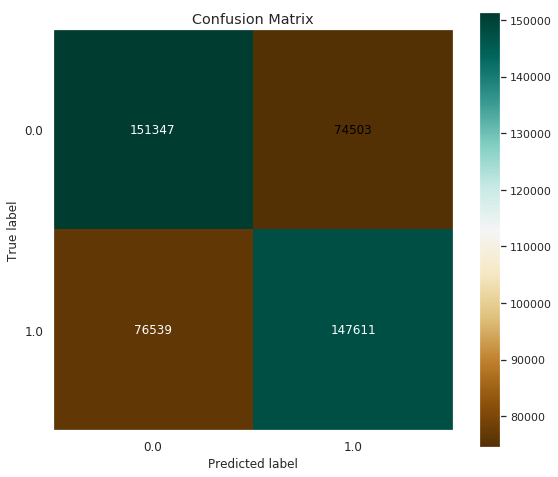

In [140]:
from sklearn.metrics import confusion_matrix
import scikitplot as skplt

sns.set(rc={'figure.figsize':(8,8)})
skplt.metrics.plot_confusion_matrix(yvalid, predictions, cmap="BrBG")

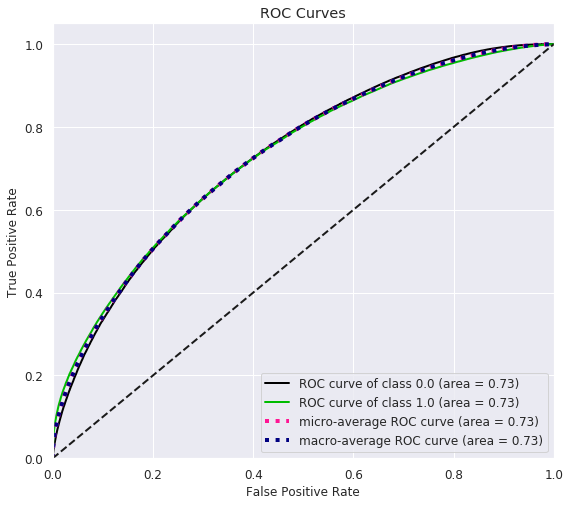

In [141]:
sns.set(rc={'figure.figsize':(8,8)})
skplt.metrics.plot_roc(yvalid, predictions_probas)

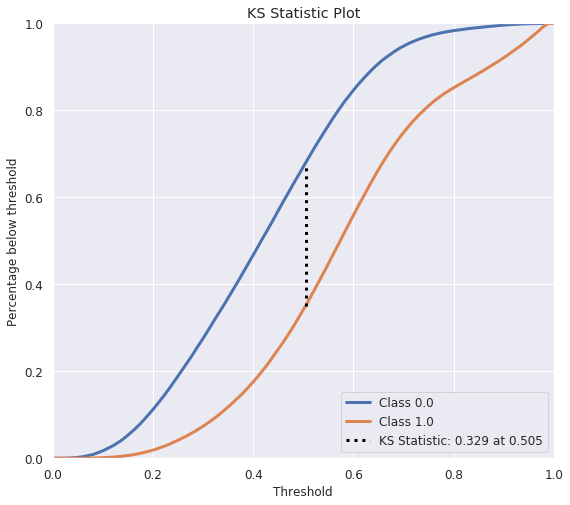

In [142]:
sns.set(rc={'figure.figsize':(8,8)})
skplt.metrics.plot_ks_statistic(yvalid, predictions_probas)

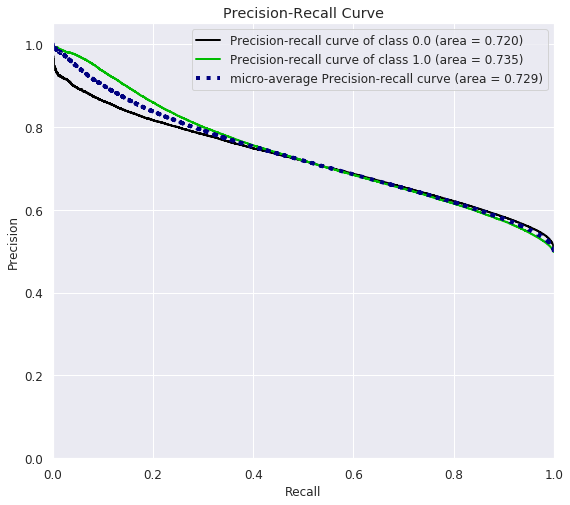

In [143]:
sns.set(rc={'figure.figsize':(8,8)})
skplt.metrics.plot_precision_recall(yvalid, predictions_probas)

/opt/conda/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


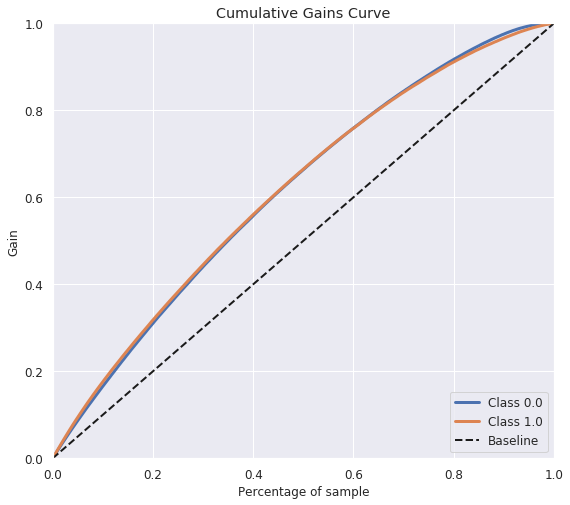

In [144]:
sns.set(rc={'figure.figsize':(8,8)})
skplt.metrics.plot_cumulative_gain(yvalid, predictions_probas)

/opt/conda/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


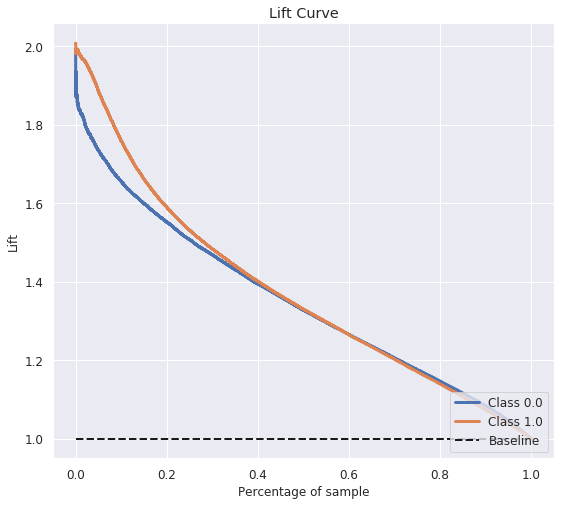

In [145]:
sns.set(rc={'figure.figsize':(8,8)})
skplt.metrics.plot_lift_curve(yvalid, predictions_probas)

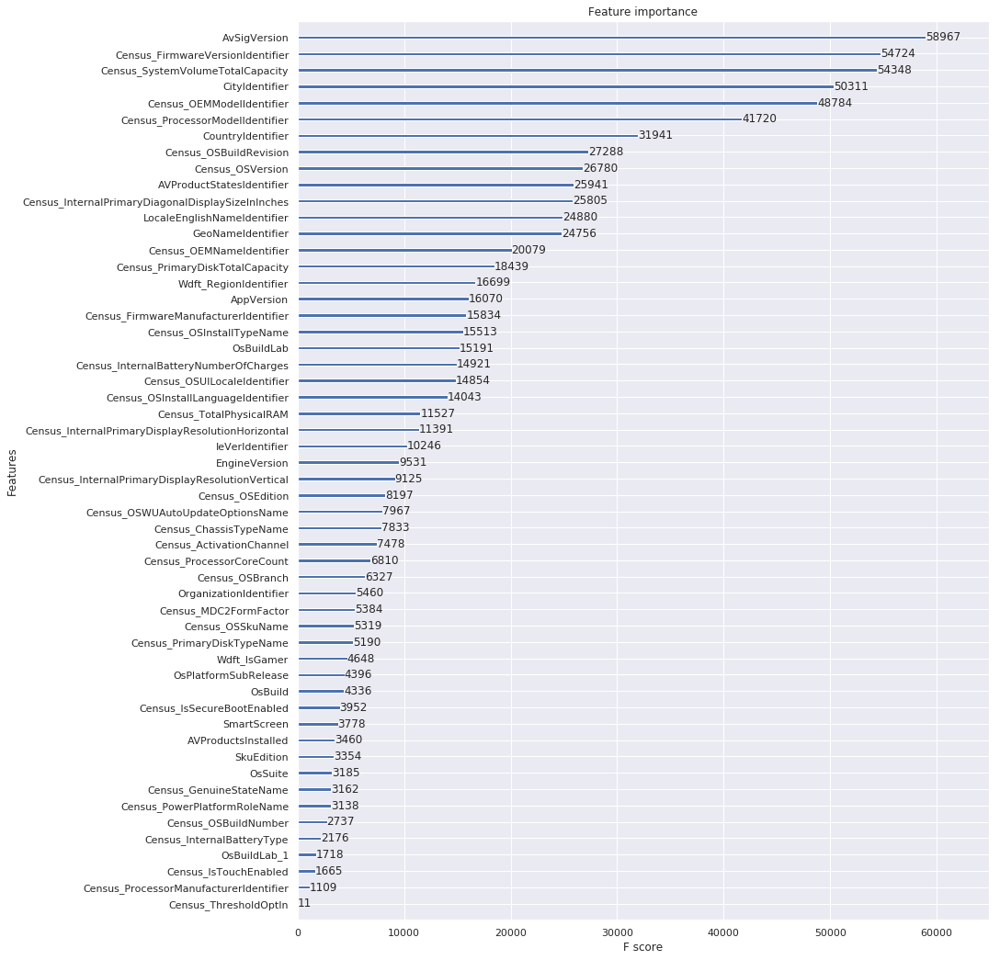

In [146]:
sns.set(rc={'figure.figsize':(12, 18)})
xgb.plot_importance(clf_xgb, title='Feature importance', xlabel='F score', ylabel='Features')

In [147]:
gc.collect()

10

### Delete defined variables to free up memory space

In [148]:
del X
del y
del xvalid
del yvalid
del xtrain
del ytrain
del predictions
del predictions_probas

In [149]:
gc.collect()

7

### Make predictions for the test Set
- Due to memory limitations predictions will be performed in chunks

In [150]:
predictions_proba_test_list = []

chunck = 400000
test_times = test.shape[0] // chunck
test_rest = test.shape[0] % chunck

for i in  np.arange(0,(chunck * (test_times+1)), chunck):
    predictions_proba_test = list(clf_xgb.predict_proba(test[i:(i+chunck)])[:,1])
    predictions_proba_test_list.append(predictions_proba_test)
    #print("times:", i)


# flatten the list of lists
predictions_proba_test_list = [y for x in predictions_proba_test_list for y in x]

print(np.shape(predictions_proba_test_list))
print(test.shape)
gc.collect()

(7853253,)
(7853253, 56)


27

### Prepare Submission File

In [151]:
del test

In [152]:
del clf_xgb

In [153]:
submission = pd.read_csv('../input/sample_submission.csv')
submission['HasDetections'] = predictions_proba_test_list
submission.to_csv('xgboost.csv', index=False)

## Conclusion
This dataset is fun to work with due to Kaggle's memory restrictions. Both EDA and Machine Learning have a wide area for applications with the dataset due to the variety of different types of categorical and numerical features.

___________________________________